# Fit bambi model to males and females combined

In [1]:
import jax
import joblib
import numpy as np
import pandas as pd
import jax.numpy as jnp
import matplotlib.pyplot as plt
import seaborn as sns
import colorcet as cc

from tqdm.auto import tqdm
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from aging.plotting import (
    figure,
    format_plots,
    add_identity,
    legend,
    PlotConfig,
    save_factory,
    COLORMAPS,
)
from copy import deepcopy
from operator import or_
from toolz import reduce, valmap, keyfilter, pluck
from aging.behavior.bio_age_model import (
    fit_model,
    masked_xval,
    raise_dim
)
from scipy.spatial.distance import pdist, squareform
from scipy.stats import ks_2samp

In [2]:
format_plots()
c = PlotConfig()
saver = save_factory(c.save_path / "fig4", tight_layout=False)

In [3]:
def zscore(ser: pd.Series):
    return (ser - ser.mean()) / ser.std()


def demean(ser: pd.Series):
    return ser - ser.mean()


def quantile(n):
    def percentile_(x):
        return x.quantile(n)
    percentile_.__name__ = 'q_{:0.02f}'.format(n)
    return percentile_


def minmax(df):
    return (df - df.min()) / (df.max() - df.min())

In [4]:
def make_plot(age_df, width, height):
    boundaries = np.arange(age_df["labels"].max() + 2) - 0.5
    pal = sns.blend_palette([COLORMAPS.ont_male(255), COLORMAPS.ont_female(255)], as_cmap=True)
    fig = figure(width, height)
    ax = sns.lineplot(
        data=age_df,
        x="true_ages",
        y="bio_ages",
        hue="labels",
        palette=[COLORMAPS.ont_male(255), COLORMAPS.ont_female(255)],
        legend=False,
        zorder=-1,
        lw=0.25,
        err_kws=dict(lw=0),
    )
    perm = np.random.permutation(len(age_df))
    im = ax.scatter(
        age_df["true_ages"].iloc[perm],
        age_df["bio_ages"].iloc[perm],
        c=age_df["labels"].iloc[perm],
        cmap=pal,
        vmin=0,
        vmax=1,
        s=1,
    )
    cb = fig.colorbar(
        mappable=im,
        boundaries=boundaries,
        ax=ax,
        label="Sex",
    )
    cb.set_ticks(range(0, 2))
    cb.set_ticklabels(["Male", "Female"])
    add_identity(ax, c="k", ls="--", zorder=-2)
    ax.set(
        xlabel="Chronological age (weeks)",
        ylabel="Behavioral age (weeks)",
        aspect="equal",
        xlim=(0, 120),
    )
    sns.despine()
    return fig

In [5]:
def read_male_ontogeny(use_syllables):
    df = pd.read_parquet(
        # "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_raw_counts_matrix_v00.parquet"
        "/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/ontogeny_males_raw_counts_matrix_v00.parquet"
    )
    df = df[use_syllables]
    df = df.query('age < 100')

    # pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_mouse_area_df_v00.parquet'
    pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/ontogeny_males_mouse_area_df_v00.parquet'
    size_df = pd.read_parquet(pth)

    sizes_col = zscore(size_df.groupby('age')['quant_0.5'].transform(demean))
    sizes_col = sizes_col.loc[df.index]
    df = df.loc[sizes_col.index]
    df = df[use_syllables]
    return df, sizes_col


def read_female_ontogeny(use_syllables):
    df = pd.read_parquet(
        # "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_females_raw_counts_matrix_v00.parquet"
        "/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/ontogeny_females_raw_counts_matrix_v00.parquet"
    )
    df = df[use_syllables]
    df = df.query('age < 100')

    # re-assign 52-wk old animals from their incorrect 8-wk old assignment
    x = ['d6f254af-d55a-427a-96e0-c452a233cbe2', '242bee8e-0ee7-45e7-8a13-678836a4cddb']

    idx = df.index.names
    tmp_df = df.reset_index()
    mask = tmp_df['uuid'].isin(x)
    tmp_df.loc[mask, 'age'] = 52
    df = tmp_df.set_index(idx)

    # pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_females_mouse_area_df_v00.parquet'
    pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/ontogeny_females_mouse_area_df_v00.parquet'
    size_df = pd.read_parquet(pth)

    idx = size_df.index.names
    tmp_df = size_df.reset_index()
    mask = tmp_df['uuid'].isin(x)
    tmp_df.loc[mask, 'age'] = 52
    size_df = tmp_df.set_index(idx)

    sizes_col = zscore(size_df.groupby('age')['quant_0.5'].transform(demean))
    sizes_col = sizes_col.loc[df.index]
    df = df.loc[sizes_col.index]

    df = df[use_syllables]

    age_mapping = {
        93: 94,
        95: 94,
        97: 98,
        98: 98,
        102: 98,
        103: 105,
        105: 105,
        107: 105
    }

    df = df.reset_index(level='age')
    df['age'] = df['age'].map(age_mapping).fillna(df['age'])

    return df.set_index('age', append=True).reorder_levels(idx), sizes_col

In [6]:
keep_syllables = np.loadtxt('/n/groups/datta/win/longtogeny/data/ontogeny/version_11/to_keep_syllables_raw.txt', dtype=int)

In [7]:
df, sizes_col = read_male_ontogeny(keep_syllables)
female_df, female_sizes_col = read_female_ontogeny(keep_syllables)
df = pd.concat([df, female_df])

age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))

label_encoder = OneHotEncoder(sparse_output=False, dtype=np.float32)
sex_id = label_encoder.fit_transform(
    np.hstack([np.zeros(len(df) - len(female_df)), np.ones(len(female_df))])[:, None]
).T

sort_idx = np.argsort(syllable_counts_jax.mean(0))[::-1]

df['sex'] = np.where(sex_id == 1)[0]
df = df.set_index('sex', append=True)

In [8]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": pd.concat([sizes_col, female_sizes_col]).to_numpy(),  # models > 1
    "mice": sex_id,
}

age_sd = 0.04

hypparams = {
    "log_age": True,
    "min_age": 3,
    "max_age": 130,
    "age_sd": age_sd,
    "n_age_samples": 1000,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "scale": 400,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(sex_id),
    "lr": 0.25,
    "n_opt_iter": 600,
}

## Get males vs females

In [9]:
mdl = fit_model(features, hypparams, 5, return_loss_on_error=True)

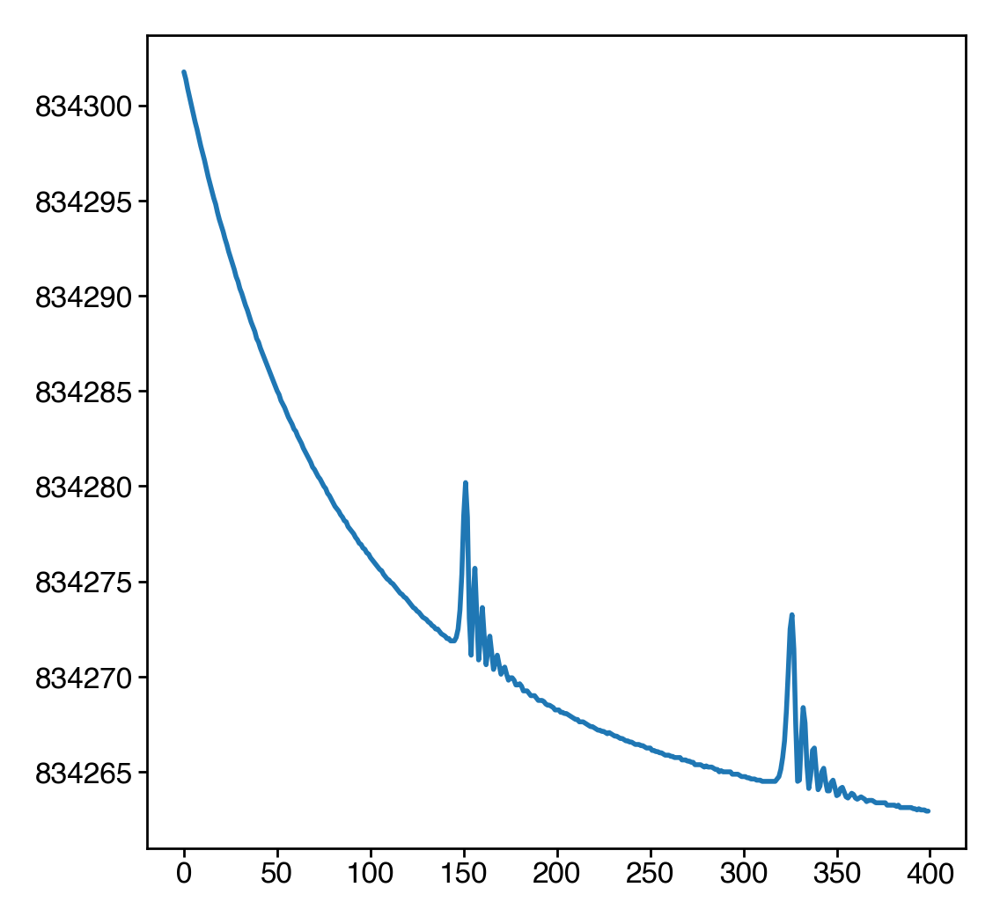

In [10]:
plt.plot(mdl['loss'][200:])

In [11]:
if len(mdl) == 1:
    print(hypparams['n_opt_iter'] - np.isnan(mdl['loss']).sum())

## Create extra dataframes for dana

In [12]:
def read_male_ontogeny2(use_syllables):
    df = pd.read_parquet(
        "/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/ontogeny_males_raw_usage_matrix_v00.parquet"
    )
    df = df[use_syllables]
    df = df.query('age < 100')

    pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/ontogeny_males_mouse_area_df_v00.parquet'
    size_df = pd.read_parquet(pth)

    sizes_col = zscore(size_df.groupby('age')['quant_0.5'].transform(demean))
    sizes_col = sizes_col.loc[df.index]
    df = df.loc[sizes_col.index]
    df = df[use_syllables]
    return df, sizes_col


def read_female_ontogeny2(use_syllables):
    df = pd.read_parquet(
        "/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/ontogeny_females_raw_usage_matrix_v00.parquet"
    )
    df = df[use_syllables]
    df = df.query('age < 100')

    # re-assign 52-wk old animals from their incorrect 8-wk old assignment
    x = ['d6f254af-d55a-427a-96e0-c452a233cbe2', '242bee8e-0ee7-45e7-8a13-678836a4cddb']

    idx = df.index.names
    tmp_df = df.reset_index()
    mask = tmp_df['uuid'].isin(x)
    tmp_df.loc[mask, 'age'] = 52
    df = tmp_df.set_index(idx)

    pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/ontogeny_females_mouse_area_df_v00.parquet'
    size_df = pd.read_parquet(pth)

    idx = size_df.index.names
    tmp_df = size_df.reset_index()
    mask = tmp_df['uuid'].isin(x)
    tmp_df.loc[mask, 'age'] = 52
    size_df = tmp_df.set_index(idx)

    sizes_col = zscore(size_df.groupby('age')['quant_0.5'].transform(demean))
    sizes_col = sizes_col.loc[df.index]
    df = df.loc[sizes_col.index]

    df = df[use_syllables]

    age_mapping = {
        93: 94,
        95: 94,
        97: 98,
        98: 98,
        102: 98,
        103: 105,
        105: 105,
        107: 105
    }

    idx = df.index.names

    df = df.reset_index(level='age')
    df['age'] = df['age'].map(age_mapping).fillna(df['age'])

    return df.set_index('age', append=True).reorder_levels(idx), sizes_col

_df, sizes_col = read_male_ontogeny2(keep_syllables)
female_df, female_sizes_col = read_female_ontogeny2(keep_syllables)
df_copy = pd.concat([_df, female_df])

label_encoder = OneHotEncoder(sparse_output=False, dtype=np.float32)
sex_id = label_encoder.fit_transform(
    np.hstack([np.zeros(len(df_copy) - len(female_df)), np.ones(len(female_df))])[:, None]
).T

df_copy['sex'] = np.where(sex_id == 1)[0]
df_copy = df_copy.set_index('sex', append=True)
df_copy = df_copy.astype('float32')

df_copy['beh_age'] = mdl['bio_ages']

!mkdir -p /n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df

for s, _df in df_copy.groupby('sex'):
    _df = _df.copy()
    _ages = _df.index.get_level_values('age')
    _df = _df.sort_values(by='beh_age')
    _df = _df.droplevel(level=['age', 'sex']).drop(columns=['beh_age'])
    _df['age'] = _ages
    _df = _df.set_index('age', append=True)
    _levels = _df.index.names
    _levels = [_levels[-1]] + list(_levels[:-1])
    _df = _df.reorder_levels(_levels)
    if s == 0:
        # males
        _df.to_parquet('/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/ontogeny_males_raw_usage_df_beh_age.parquet')
    else:
        # females
        _df.to_parquet('/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/ontogeny_females_raw_usage_df_beh_age.parquet')

/home/wg41/miniconda3/envs/aging-gpu/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [13]:
df_copy = df.copy().astype('float32')

# normalize to sum to 1
df_copy['beh_age'] = mdl['bio_ages']

for s, _df in df_copy.groupby('sex'):
    _age = _df.index.get_level_values('age')
    _df = _df.sort_values(by='beh_age')
    df_copy.loc[_df.index, 'beh_age_map'] = _age.to_numpy()

df_copy = df_copy.set_index(['beh_age', 'beh_age_map'], append=True)

In [14]:
df_copy.to_parquet('/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/2024-06-10-male-female-ontogeny-counts-df-beh-age.parquet')

## Plots and analysis

In [15]:
labels = LabelEncoder().fit_transform(np.hstack([np.zeros(len(df) - len(female_df)), np.ones(len(female_df))]))

In [ ]:
# male is blue, female is orange
example_mice = [0, 1]

mask = []
for m in example_mice:
    mask.append(labels == m)
mask = reduce(or_, mask)

sylls = [0, 1, 3, 5, 6, 8, 10, 14, 15, 19, 23]
fig, ax = plt.subplots(len(sylls), 3, figsize=(3, len(sylls)), sharex=True, dpi=900)

true_age = mdl["true_ages"][mask]
bio_age = mdl["bio_ages"][mask]
counts = mdl["counts"][mask]
pred_counts = mdl["predicted_counts"][mask]

pal = sns.blend_palette([COLORMAPS.ont_male(255), COLORMAPS.ont_female(255)], as_cmap=True)

for a, syll, i in zip(ax, map(lambda i: int(sort_idx[i]), sylls), sylls):
    max_counts = max([counts[:, syll].max(), pred_counts[:, syll].max()]) * 1.05
    a[0].scatter(true_age, counts[:, syll], s=2.5, c=labels[mask], cmap=pal, vmax=1, vmin=0, rasterized=True)
    a[0].set(title=f"Idx {i} Syllable {df.columns[syll]}", ylabel="Counts", xlabel="Chron. age (weeks)", ylim=(0, max_counts))

    a[2].scatter(bio_age, pred_counts[:, syll], s=2.5, c=labels[mask], cmap=pal, vmax=1, vmin=0, rasterized=True)
    a[2].set(ylabel="Pred. counts", xlabel="Beh. age (weeks)", ylim=(0, max_counts), yticklabels=[])

    a[1].scatter(bio_age, counts[:, syll], s=2.5, c=labels[mask], cmap=pal, vmax=1, vmin=0, rasterized=True)
    a[1].set(ylabel="Counts", xlabel="Beh. age (weeks)", ylim=(0, max_counts), yticklabels=[])

sns.despine()
fig.tight_layout()

saver(fig, "sex-ontogeny-true-vs-predicted-counts", dpi=900);

In [17]:
list(mdl['params'])

['bio_basis_weights', 'development_weights', 'individual_biases', 'size_slope']

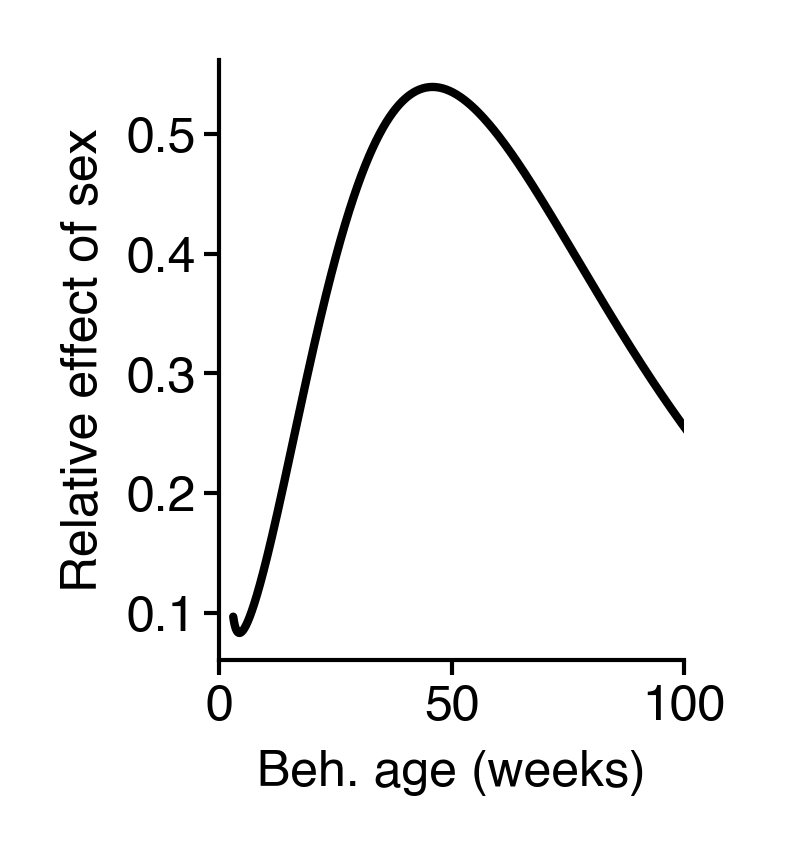

In [18]:
comps = mdl['init_components']

x = mdl['params']['development_weights']
dev = np.exp(x @ comps.bases['development']).squeeze()

fig = figure(1, 1.3)
ax = fig.gca()
ax.plot(comps.age_unnormalizer(comps.age_samples), dev, color='k')
plt.xlim(0, 100)
# plt.ylim(0, None)
plt.xlabel("Beh. age (weeks)")
plt.ylabel("Relative effect of sex")
sns.despine()
saver(fig, "ontogeny-effect-of-sex");

## Make ontogeny sex age plot

In [19]:
age_df = pd.DataFrame(
    dict(bio_ages=mdl["bio_ages"], true_ages=mdl["true_ages"], labels=labels),
)

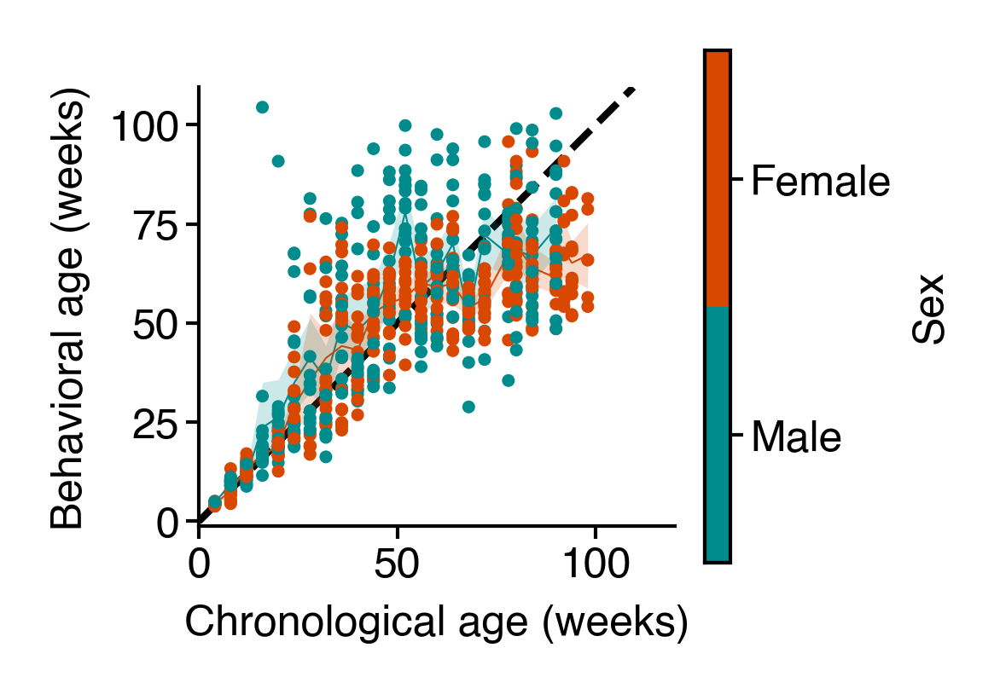

In [20]:
fig = make_plot(age_df, 1.5, 1.3)
saver(fig, "ontogeny-sex-chron-vs-beh-age-all-timepoints");

### At each chronological age, what is the male/female distribution of biological age?

In [21]:
age_df['bin'] = pd.cut(age_df['true_ages'], 8, labels=False)

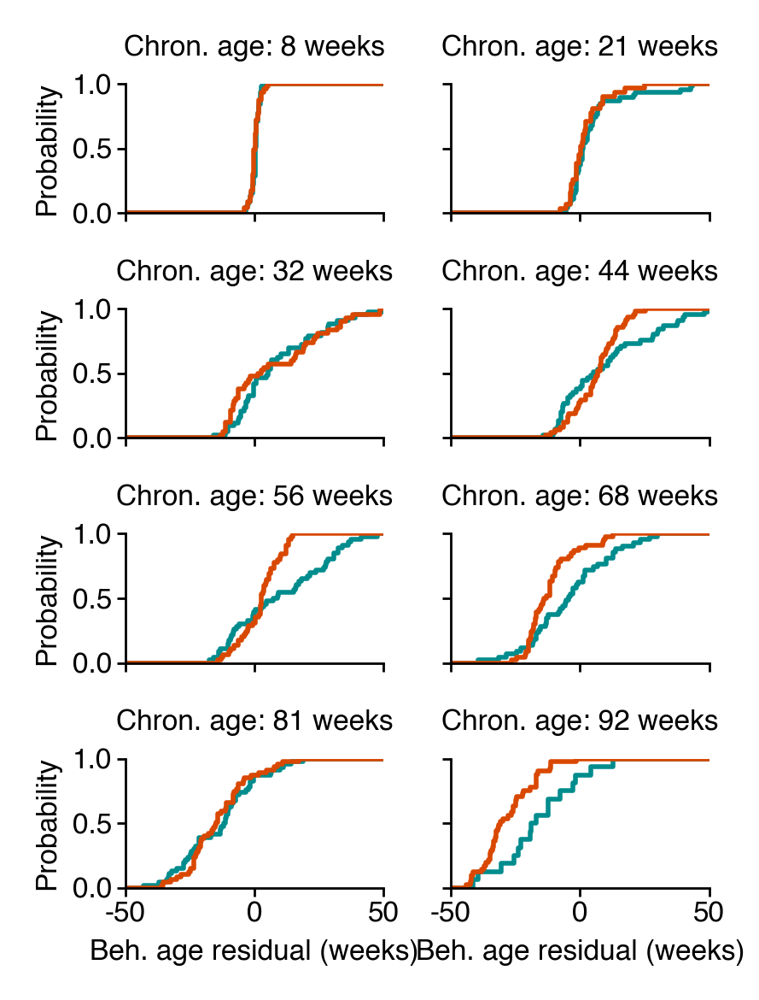

In [22]:
fig, ax = plt.subplots(4, 2, figsize=(2.2, 2.9), sharey=True, sharex=True)
for a, (_bin, _df) in zip(ax.flat, age_df.groupby("bin")):
    mean_age = _df["true_ages"].mean()
    _male_df = _df.query("labels == 0")
    _female_df = _df.query("labels == 1")
    sns.histplot(
        data=_male_df["bio_ages"] - _male_df['true_ages'],
        ax=a,
        color=COLORMAPS.ont_male(255),
        bins=np.linspace(-50, 50, 200),
        fill=False,
        cumulative=True,
        element="step",
        stat='probability',
    )
    sns.histplot(
        data=_female_df["bio_ages"] - _female_df['true_ages'],
        ax=a,
        color=COLORMAPS.ont_female(255),
        bins=np.linspace(-50, 50, 200),
        fill=False,
        cumulative=True,
        element="step",
        stat='probability',
    )
    a.set(title=f"Chron. age: {mean_age:0.0f} weeks", ylim=(0, 1))
for a in ax[-1]:
    a.set(xlabel="Beh. age residual (weeks)", xlim=(-50, 50))
sns.despine()
fig.tight_layout()
saver(fig, "male-female-difference-to-avg-chron-age");

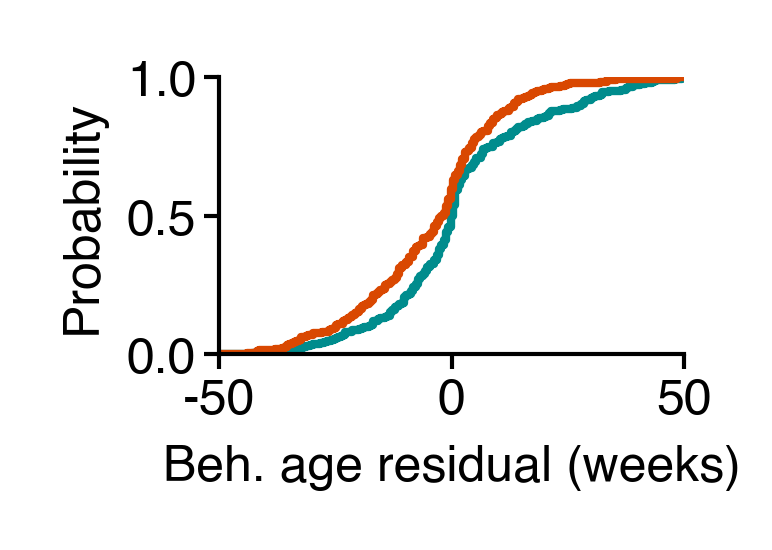

In [23]:
fig = figure(1, 0.6)
_male_df = age_df.query("labels == 0")
_female_df = age_df.query("labels == 1")
sns.histplot(
    data=_male_df["bio_ages"] - _male_df['true_ages'],
    color=COLORMAPS.ont_male(255),
    bins=np.linspace(-50, 50, 200),
    fill=False,
    cumulative=True,
    element="step",
    stat='probability',
)
a = sns.histplot(
    data=_female_df["bio_ages"] - _female_df['true_ages'],
    color=COLORMAPS.ont_female(255),
    bins=np.linspace(-50, 50, 200),
    fill=False,
    cumulative=True,
    element="step",
    stat='probability',
)
a.set(xlabel="Beh. age residual (weeks)", xlim=(-50, 50), ylim=(0, 1))
sns.despine()
saver(fig, "male-female-difference-to-avg-chron-age-combined");

In [24]:
ks_result = ks_2samp(_male_df['bio_ages'] - _male_df['true_ages'], _female_df['bio_ages'] - _female_df['true_ages'])
ks_result

KstestResult(statistic=0.13958338742200413, pvalue=0.002310284535603929, statistic_location=-10.451294, statistic_sign=-1)

## Sorting by model predictions

In [25]:
df_copy = df.copy().astype('float32')

# normalize to sum to 1
df_copy = df_copy / (df_copy.sum(1).to_numpy()[:, None])
df_copy['beh_age'] = mdl['bio_ages']
df_copy = df_copy.set_index('beh_age', append=True)

### Pre-bambi males and females

In [43]:
from itertools import product

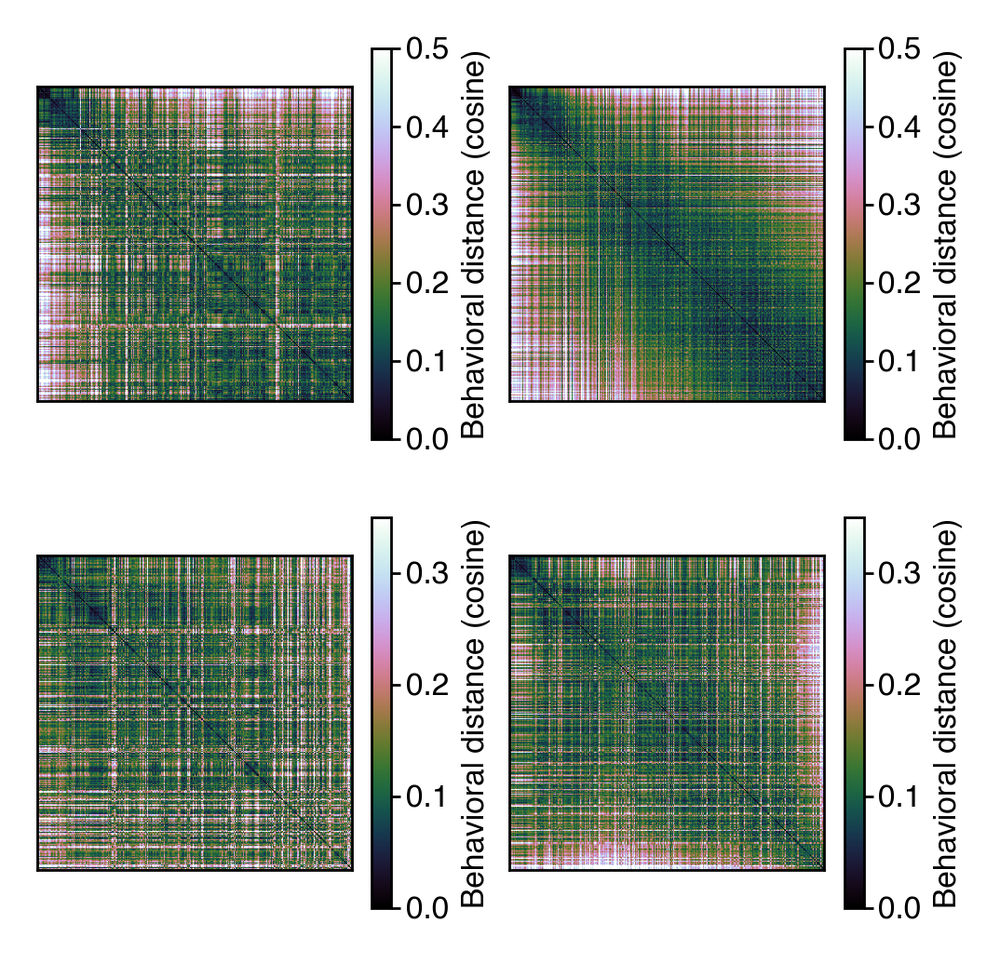

In [47]:
fig, ax = plt.subplots(2, 2, figsize=(3, 3))

sex_vmap = {
    0: 0.5,
    1: 0.35,
}

for (_sex, _sorting), a in zip(product([0, 1], ["age", "beh_age"]), ax.flat):
    d = pdist(df_copy.query('sex == @_sex').sort_index(level=_sorting), metric="cosine")
    d = squareform(d)

    im = a.imshow(d, cmap="cubehelix", vmax=sex_vmap[_sex], vmin=0)
    fig.colorbar(im, ax=a, label="Behavioral distance (cosine)")
    a.set(xticks=[], yticks=[])
saver(fig, 'male-female-distance-matrix-pre-post-bambi-sorting-cosine');

In [1]:
fig, ax = plt.subplots(2, 2, figsize=(3, 3))

sex_vmap = {
    0: 0.25,
    1: 0.25,
}

for (_sex, _sorting), a in zip(product([0, 1], ["age", "beh_age"]), ax.flat):
    d = pdist(df_copy.query('sex == @_sex').sort_index(level=_sorting), metric="euclidean")
    d = squareform(d)

    im = a.imshow(d, cmap="cubehelix", vmax=sex_vmap[_sex], vmin=0)
    fig.colorbar(im, ax=a, label="Behavioral distance (euclidean)")
    a.set(xticks=[], yticks=[])
# saver(fig, 'male-female-distance-matrix-pre-post-bambi-sorting-euclidean');

NameError: name 'plt' is not defined

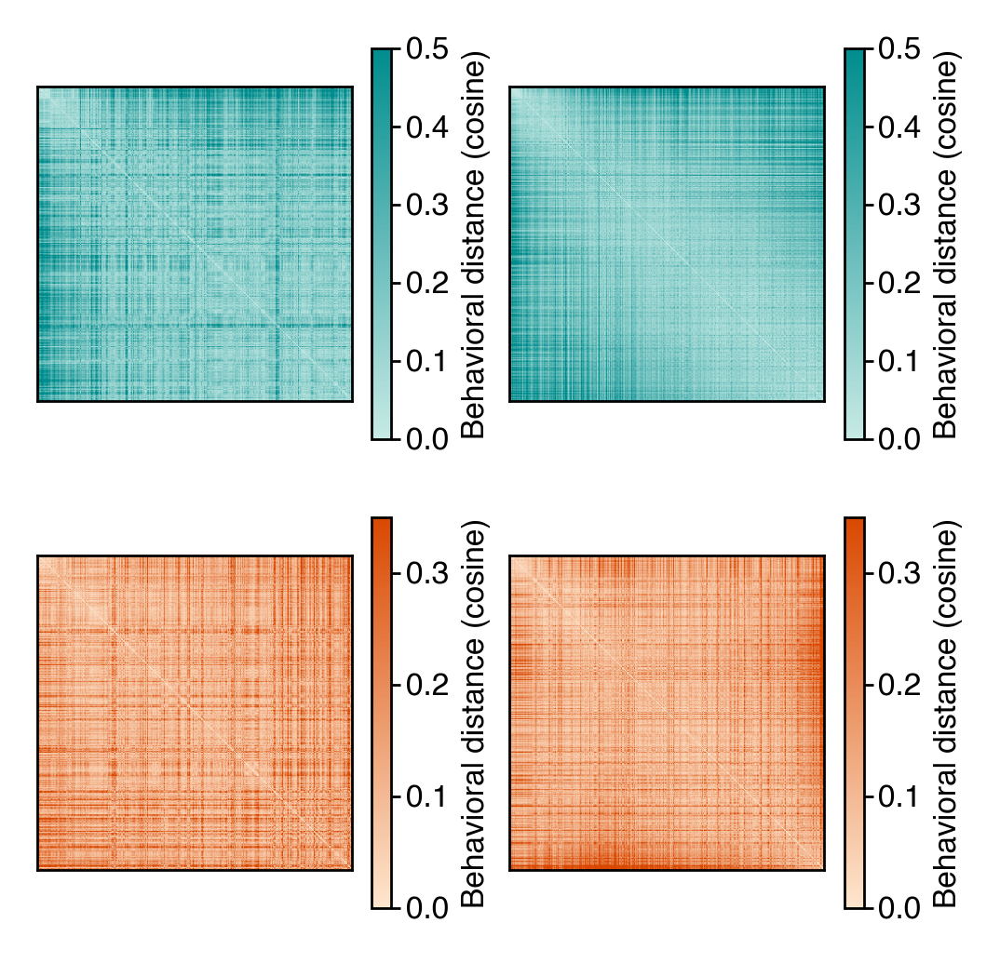

In [46]:
fig, ax = plt.subplots(2, 2, figsize=(3, 3))

sex_vmap = {
    0: 0.5,
    1: 0.35,
}

sex_cmap = {
    0: COLORMAPS.ont_male,
    1: COLORMAPS.ont_female,
}

for (_sex, _sorting), a in zip(product([0, 1], ["age", "beh_age"]), ax.flat):
    d = pdist(df_copy.query('sex == @_sex').sort_index(level=_sorting), metric="cosine")
    d = squareform(d)

    im = a.imshow(d, cmap=sex_cmap[_sex], vmax=sex_vmap[_sex], vmin=0)
    fig.colorbar(im, ax=a, label="Behavioral distance (cosine)")
    a.set(xticks=[], yticks=[])

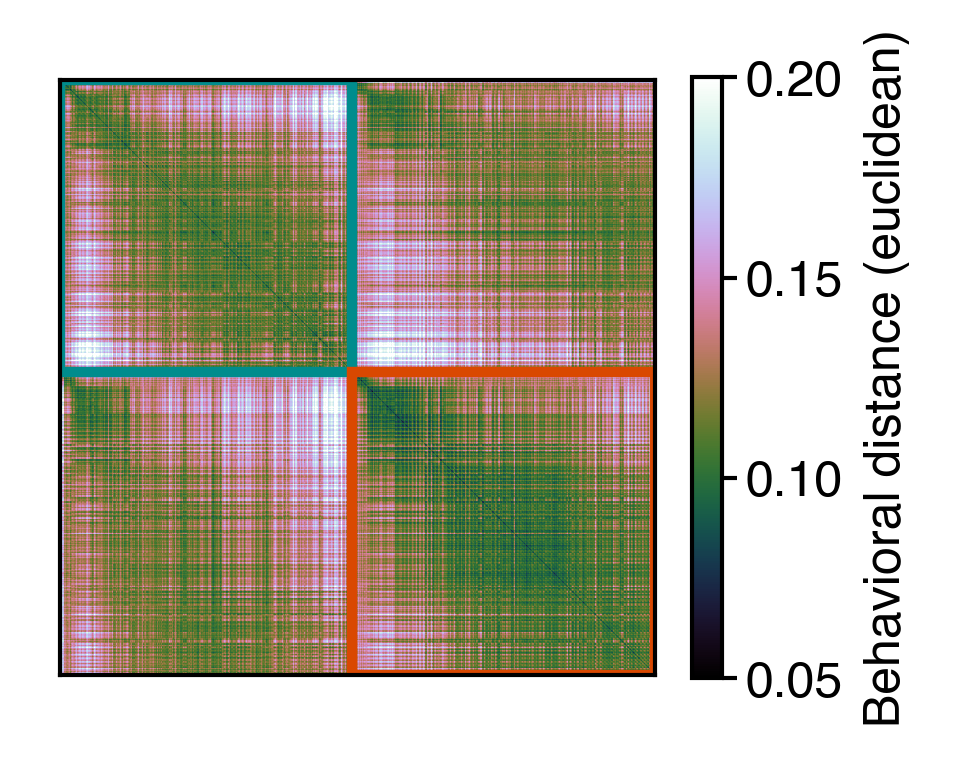

In [22]:
d = pdist(df_copy.sort_index(level=["sex", "age"]), metric="euclidean")
d = squareform(d)

fig = figure(1.6, 1.3)
ax = fig.gca()
im = ax.imshow(d, cmap="cubehelix", vmax=0.2, vmin=0.05)
fig.colorbar(im, ax=ax, label="Behavioral distance (euclidean)")

start = len(df) - len(f_df) - 1
patch = plt.Rectangle(
    (0, 0),
    start,
    start,
    edgecolor=COLORMAPS.ont_male(255),
    facecolor="none",
    linewidth=1.25,
)
ax.add_patch(patch)
patch = plt.Rectangle(
    (start, start),
    len(f_df) - 1,
    len(f_df) - 1,
    edgecolor=COLORMAPS.ont_female(255),
    facecolor="none",
    linewidth=1.25,
)
ax.add_patch(patch)
ax.set(xticks=[], yticks=[])
saver(fig, 'ontogeny-male-female-chron-age-sorted-distance-matrix');

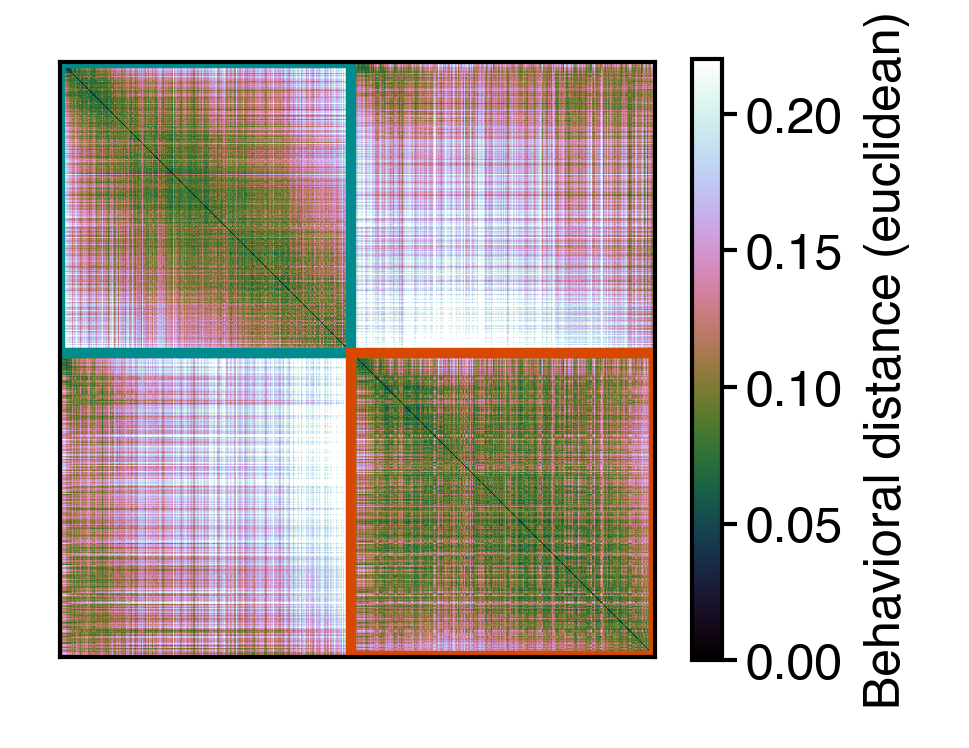

In [26]:
d = pdist(df_copy.sort_index(level=["sex", "beh_age"]), metric="euclidean")
d = squareform(d)

fig = figure(1.6, 1.3)
ax = fig.gca()
im = ax.imshow(d, cmap="cubehelix", vmax=0.22, vmin=0)
fig.colorbar(im, ax=ax, label="Behavioral distance (euclidean)")

start = len(df) - len(female_df) - 1
patch = plt.Rectangle(
    (0, 0),
    start,
    start,
    edgecolor=COLORMAPS.ont_male(255),
    facecolor="none",
    linewidth=1.25,
)
ax.add_patch(patch)
patch = plt.Rectangle(
    (start, start),
    len(female_df) - 1,
    len(female_df) - 1,
    edgecolor=COLORMAPS.ont_female(255),
    facecolor="none",
    linewidth=1.25,
)
ax.add_patch(patch)
ax.set(xticks=[], yticks=[])
saver(fig, 'male-female-sorted-distance-matrix');

## PCA on model predictions

In [27]:
from sklearn.decomposition import PCA

In [28]:
list(mdl)

['params',
 'heldout_ll',
 'loss',
 'bio_ages',
 'age_likelihoods',
 'true_ages',
 'init_components',
 'concentrations',
 'concentration_components',
 'predicted_counts',
 'counts',
 'r2_total',
 'r2_each']

In [29]:
mdl['predicted_counts'].shape

(680, 58)

In [30]:
pc = mdl['predicted_counts']
pc = pc / pc.sum(1, keepdims=True)

In [31]:
pca = PCA(n_components=2)
scores = pca.fit_transform(pc)
scores_df = pd.DataFrame(scores, index=df.index)
scores_df['bio_age'] = mdl['bio_ages']

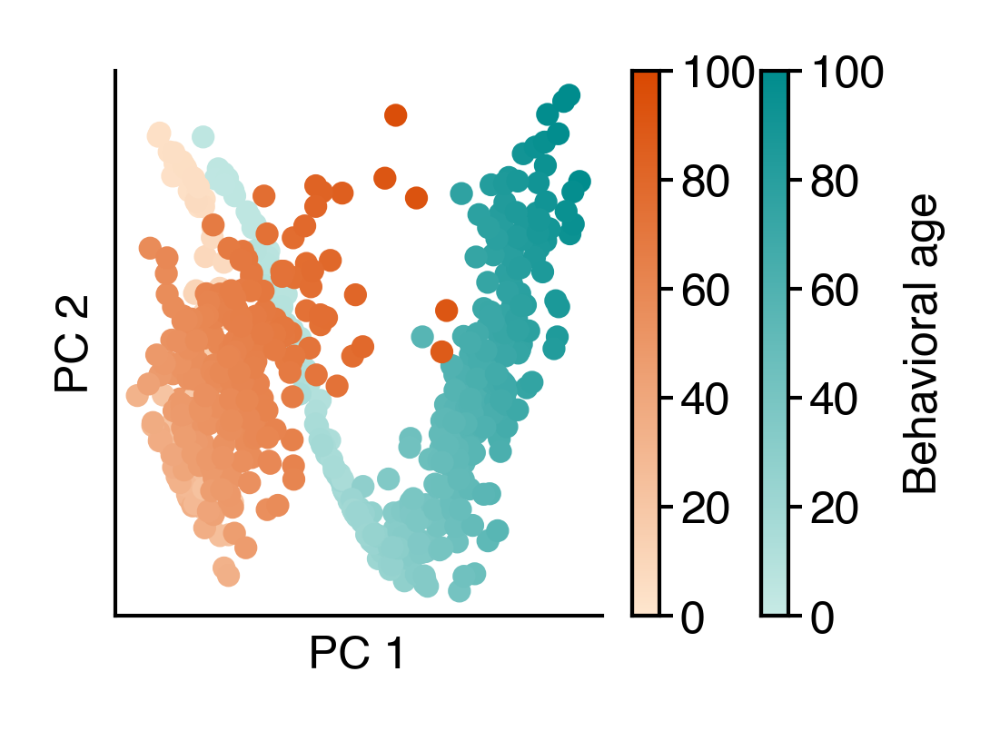

In [32]:
fig = figure(1.8, 1.3)
ax = fig.gca()
for sex, _df in scores_df.groupby('sex'):
    cm = COLORMAPS.ont_male if sex == 0 else COLORMAPS.ont_female
    im = ax.scatter(_df[0], _df[1], c=_df['bio_age'], cmap=cm, s=5, vmin=0, vmax=100)
    cb = fig.colorbar(im, ax=ax, label="Behavioral age" if sex == 0 else None)
ax.set(xticks=[], yticks=[], xlabel="PC 1", ylabel="PC 2")
sns.despine()
saver(fig, "model-based-pca-males-females-bio-age");

## Plot age likelihoods

In [33]:
list(mdl)

['params',
 'heldout_ll',
 'loss',
 'bio_ages',
 'age_likelihoods',
 'true_ages',
 'init_components',
 'concentrations',
 'concentration_components',
 'predicted_counts',
 'counts',
 'r2_total',
 'r2_each']

In [34]:
_age = mdl['init_components'].age_unnormalizer(mdl['init_components'].age_samples)

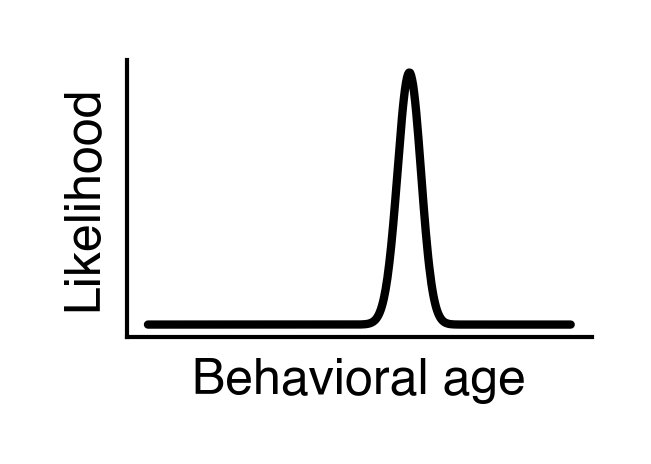

In [35]:
fig = figure(1, 0.6)
ax = fig.gca()
ax.plot(_age, mdl['age_likelihoods'][100], color='k')
ax.set(xticks=[], yticks=[], xlabel="Behavioral age", ylabel="Likelihood")
sns.despine()
saver(fig, "beh-age-likelihood-function-schematic");

In [36]:
from scipy.stats import norm

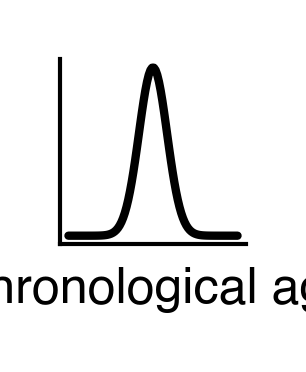

In [37]:
out = norm.pdf(np.linspace(-6, 6, 100), loc=0, scale=1)

fig = figure(0.4, 0.4)
ax = fig.gca()
ax.plot(out, color='k')
ax.set(xticks=[], yticks=[], xlabel="Chronological age")
sns.despine()
saver(fig, "chron-age-prior-schematic");

## Relative contributions

In [37]:
conc_c = mdl['concentration_components']
indiv_components = conc_c['indiv'] * conc_c['indiv_scale'][None, :, None]

total = (
    np.abs(conc_c["bio"][..., None])
    + np.abs(indiv_components)
    + np.abs(conc_c["size"][:, None, :])
)

In [38]:
inds = np.argmax(mdl['age_likelihoods'], axis=1)

In [39]:
bio = np.abs(conc_c['bio'][..., None]) / total
indiv = np.abs(indiv_components) / total
size = np.abs(conc_c['size'][:, None, :]) / total

In [40]:
bio = bio[:, inds, np.arange(len(inds))]
indiv = indiv[:, inds, np.arange(len(inds))]
size = size[:, inds, np.arange(len(inds))]

In [41]:
bio_df = pd.DataFrame(bio.T, index=df.index).reset_index()
bio_df["bio_age"] = mdl["bio_ages"]
bio_df = bio_df.drop(columns=['subject_name', 'session_name', 'uuid', 'date']).melt(
    id_vars=["mouse", "age", "bio_age", "sex"], var_name="syllable", value_name="influence"
)
bio_df["type"] = "Beh. age"

size_df = pd.DataFrame(size.T, index=df.index).reset_index()
size_df["bio_age"] = mdl["bio_ages"]
size_df = size_df.drop(columns=['subject_name', 'session_name', 'uuid', 'date']).melt(
    id_vars=["mouse", "age", "bio_age", "sex"], var_name="syllable", value_name="influence"
)
size_df["type"] = "Size"

indiv_df = pd.DataFrame(indiv.T, index=df.index).reset_index()
indiv_df["bio_age"] = mdl["bio_ages"]
indiv_df = indiv_df.drop(columns=['subject_name', 'session_name', 'uuid', 'date']).melt(
    id_vars=["mouse", "age", "bio_age", "sex"], var_name="syllable", value_name="influence"
)
indiv_df["type"] = "Sex"

In [42]:
plt_dfs = pd.concat([bio_df, size_df, indiv_df])
plt_dfs['bio_bin'] = pd.cut(plt_dfs['bio_age'], 35)
plt_dfs['bio_bin'] = plt_dfs['bio_bin'].map(lambda x: x.mid)
plt_dfs['age_bin'] = pd.cut(plt_dfs['age'], 35)
plt_dfs['age_bin'] = plt_dfs['age_bin'].map(lambda x: x.mid)

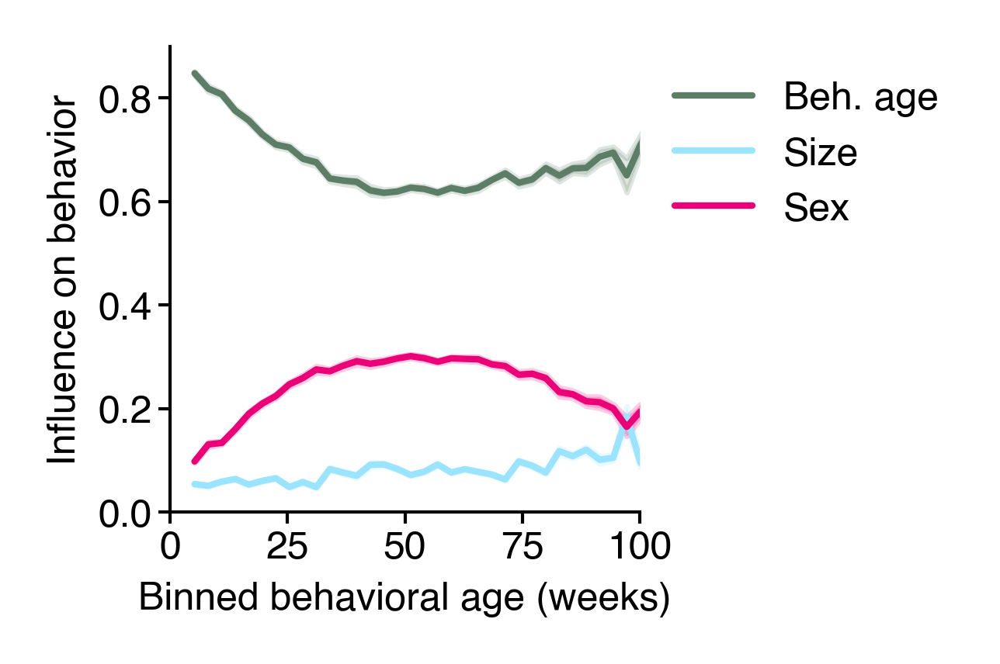

In [43]:
fig = figure(1.3, 1.3)
ax = sns.lineplot(data=plt_dfs, x='bio_bin', y='influence', errorbar='se', hue='type', palette=cc.glasbey[24:27])
ax.set(xlabel="Binned behavioral age (weeks)", ylabel="Influence on behavior", ylim=(0, 0.9), xlim=(0, 100))
legend()
sns.despine()
saver(fig, 'sex-component-influence-on-behavior');

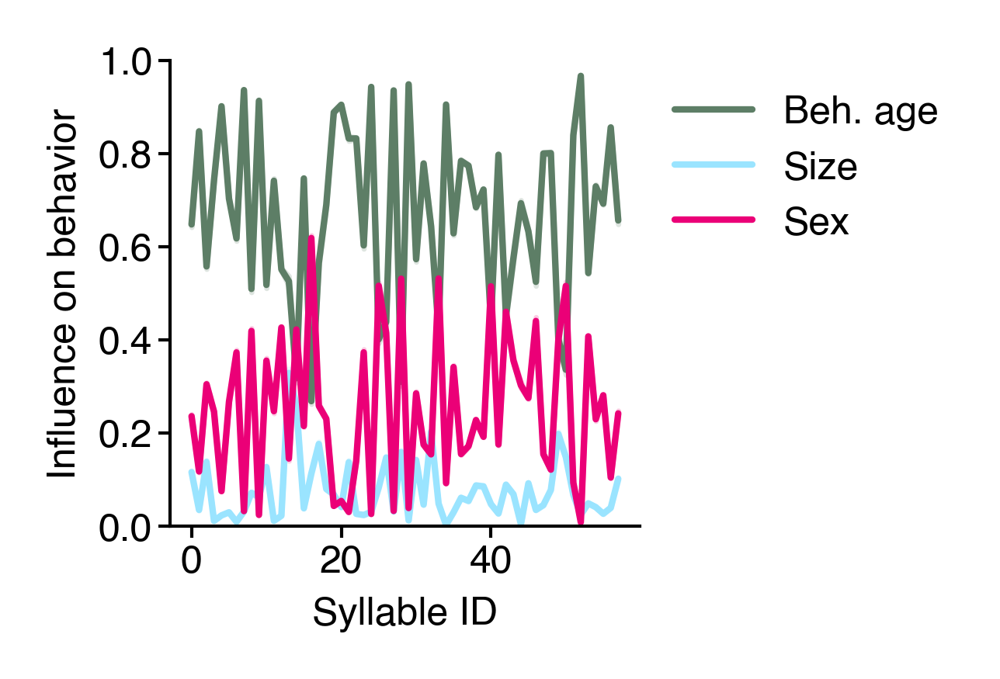

In [44]:
fig = figure(1.3, 1.3)
ax = sns.lineplot(data=plt_dfs, x='syllable', y='influence', errorbar='se', hue='type', palette=cc.glasbey[24:27])
ax.set(xlabel="Syllable ID", ylabel="Influence on behavior", ylim=(0, 1))
legend()
sns.despine()
saver(fig, 'sex-syllables-component-influence-on-behavior');

In [45]:
x = pd.pivot_table(
    plt_dfs.groupby(["syllable", "type"])["influence"].mean().reset_index(),
    index="syllable",
    columns="type",
    values="influence",
)
remapping = dict(
    map(reversed, enumerate(x.sort_values(by="Beh. age", ascending=False).index))
)

In [46]:
plt_dfs.head()

,mouse,age,bio_age,sex,syllable,influence,type,bio_bin,age_bin
0,4M_01_01,4.0,5.106746,0,0,0.947850,Beh. age,5.1925,5.296
1,4M_01_02,4.0,4.880706,0,0,0.959960,Beh. age,5.1925,5.296
2,4M_01_03,4.0,4.629608,0,0,0.953194,Beh. age,5.1925,5.296
3,4M_01_04,4.0,4.424689,0,0,0.950335,Beh. age,5.1925,5.296
4,4M_02_01,4.0,3.981125,0,0,0.967776,Beh. age,5.1925,5.296


In [47]:
plt_dfs['sorted_syllable'] = plt_dfs['syllable'].map(remapping)

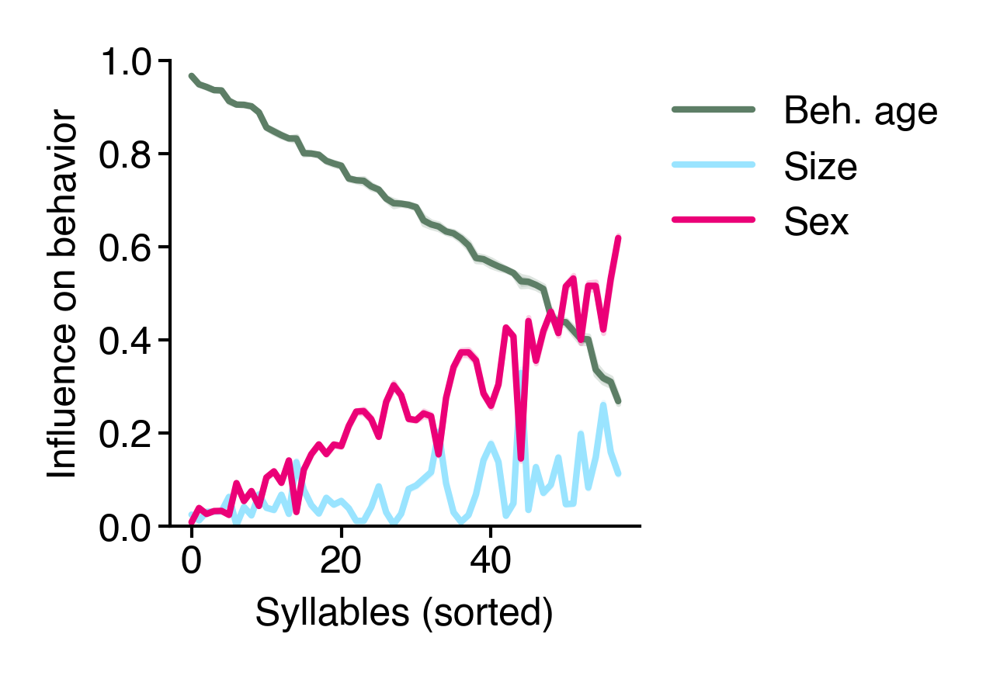

In [48]:
fig = figure(1.3, 1.3)
ax = sns.lineplot(data=plt_dfs, x='sorted_syllable', y='influence', errorbar='se', hue='type', palette=cc.glasbey[24:27])
ax.set(xlabel="Syllables (sorted)", ylabel="Influence on behavior", ylim=(0, 1))
legend()
sns.despine()
saver(fig, 'sex-syllables-component-influence-on-behavior-sorted');

In [49]:
# rank-order influences
tmp = plt_dfs.groupby(['syllable', 'type'])[['influence']].mean()
ranks = tmp.groupby('type').rank().reset_index()

### Make plots showing high-influence syllables are better predicting than low-influence syllables

In [50]:
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.metrics import accuracy_score, r2_score

<Axes: xlabel='syllable', ylabel='type'>

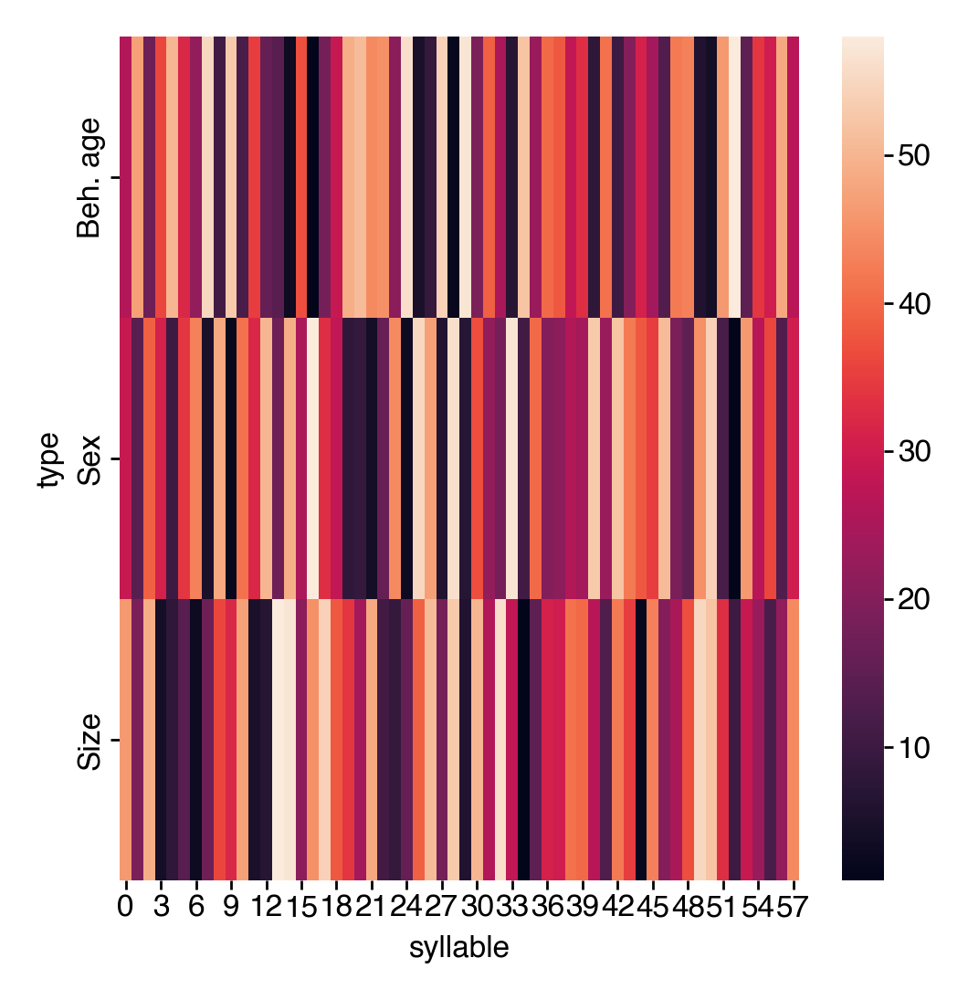

In [51]:
sns.heatmap(ranks.pivot_table(index="type", columns="syllable", values="influence"))

In [52]:
top_n = 5
thresh = 58 - top_n

filt_ranks = ranks.query('influence > @thresh')

In [53]:
clf_data = df.reset_index()

In [54]:
pipe = make_pipeline(
    StandardScaler(),
    LinearRegression(),
)

In [55]:
n_repeats = 20
x = []

for idx, row in filt_ranks.iterrows():
    # age regression
    r2s = []
    for i in range(n_repeats):
        preds = cross_val_predict(
            pipe,
            np.array(syllable_counts_jax[:, [row.syllable]]),
            clf_data["age"],
            # cv=StratifiedKFold(n_splits=6, shuffle=True, random_state=i),
            cv=KFold(n_splits=10, shuffle=True, random_state=i),
            n_jobs=-1,
        )
        r2s.append(r2_score(clf_data["age"], preds))
    x.append({"r2": np.mean(r2s), "type": row.type})

x = pd.DataFrame(x)

/home/wg41/miniconda3/envs/aging-gpu/lib/python3.10/site-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


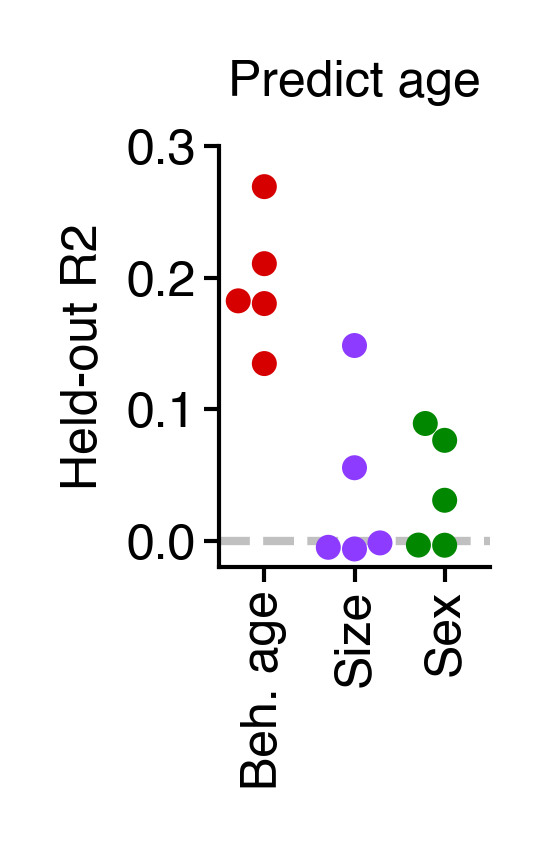

In [56]:
fig = figure(0.9, 1.4)
ax = sns.swarmplot(data=x, x='type', y='r2', hue='type', palette=cc.glasbey_dark[:3], size=3)
plt.xticks(rotation=90)
ax.set(ylabel="Held-out R2", xlabel="", title="Predict age", ylim=(None, 0.3))
ax.axhline(0, color='silver', ls='--', lw=1, zorder=-1)
sns.despine()
saver(fig, "predict-age-from-syllables", tight_layout=True);

In [57]:
n_repeats = 20
x = []

for idx, row in filt_ranks.iterrows():
    # age regression
    r2s = []
    for i in range(n_repeats):
        preds = cross_val_predict(
            pipe,
            np.array(syllable_counts_jax[:, [row.syllable]]),
            np.array(features['sizes']),
            # cv=StratifiedKFold(n_splits=6, shuffle=True, random_state=i),
            cv=KFold(n_splits=10, shuffle=True, random_state=i),
            n_jobs=-1,
        )
        r2s.append(r2_score(np.array(features['sizes']), preds))
    x.append({"r2": np.mean(r2s), "type": row.type})

x = pd.DataFrame(x)

/home/wg41/miniconda3/envs/aging-gpu/lib/python3.10/site-packages/seaborn/categorical.py:3399: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


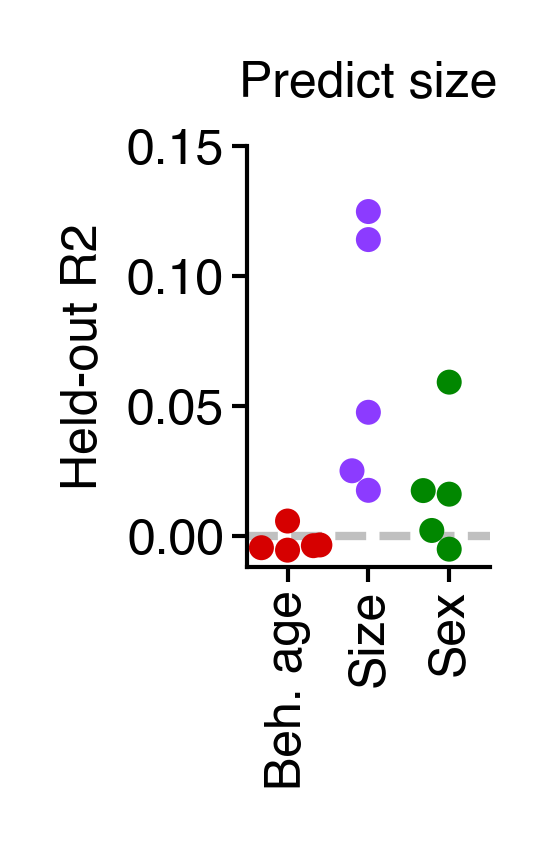

In [58]:
fig = figure(0.9, 1.4)
ax = sns.swarmplot(data=x, x='type', y='r2', hue='type', palette=cc.glasbey_dark[:3], size=3)
plt.xticks(rotation=90)
ax.set(ylabel="Held-out R2", xlabel="", title="Predict size", ylim=(None, 0.15))
ax.axhline(0, color='silver', ls='--', lw=1, zorder=-1)
sns.despine()
saver(fig, "predict-size-from-syllables", tight_layout=True);

In [59]:
clf_pipe = make_pipeline(
    StandardScaler(),
    SVC(kernel='linear'),
)

In [60]:
n_repeats = 20
x = []

for idx, row in filt_ranks.iterrows():
    # age regression
    r2s = []
    for i in range(n_repeats):
        preds = cross_val_predict(
            clf_pipe,
            np.array(syllable_counts_jax[:, [row.syllable]]),
            np.argmax(features['mice'], axis=0),
            # cv=StratifiedKFold(n_splits=6, shuffle=True, random_state=i),
            cv=KFold(n_splits=10, shuffle=True, random_state=i),
            n_jobs=-1,
        )
        r2s.append(accuracy_score(np.argmax(features['mice'], axis=0), preds))
    x.append({"acc": np.mean(r2s), "type": row.type})

x = pd.DataFrame(x)

/home/wg41/miniconda3/envs/aging-gpu/lib/python3.10/site-packages/seaborn/categorical.py:3399: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


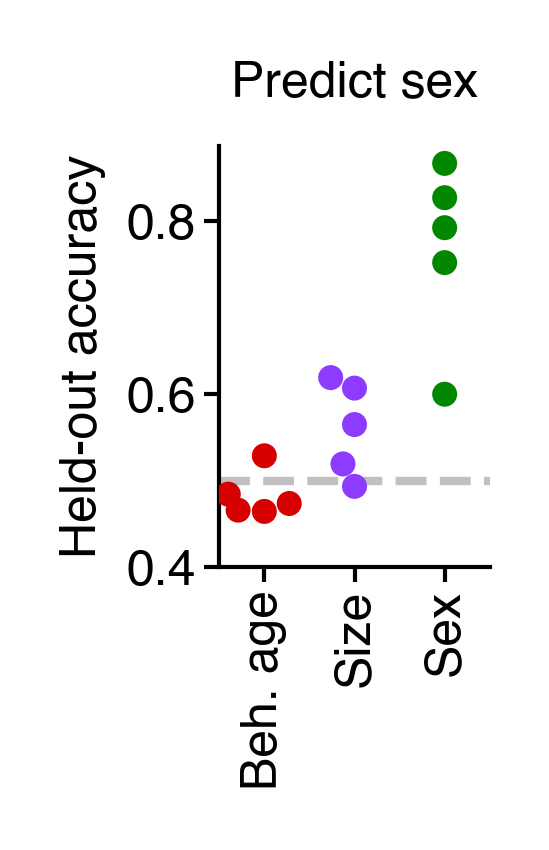

In [61]:
fig = figure(0.9, 1.4)
ax = sns.swarmplot(data=x, x='type', y='acc', hue='type', palette=cc.glasbey_dark[:3], size=3)
plt.xticks(rotation=90)
ax.set(ylabel="Held-out accuracy", xlabel="", title="Predict sex", ylim=(0.4, None))
ax.axhline(0.5, color='silver', ls='--', lw=1, zorder=-1)
sns.despine()
saver(fig, "predict-sex-from-syllables", tight_layout=True);

In [62]:
mp = ranks.query('type == "Sex"').set_index('syllable')['influence']

In [63]:
ranks['color'] = ranks['syllable'].map(mp)

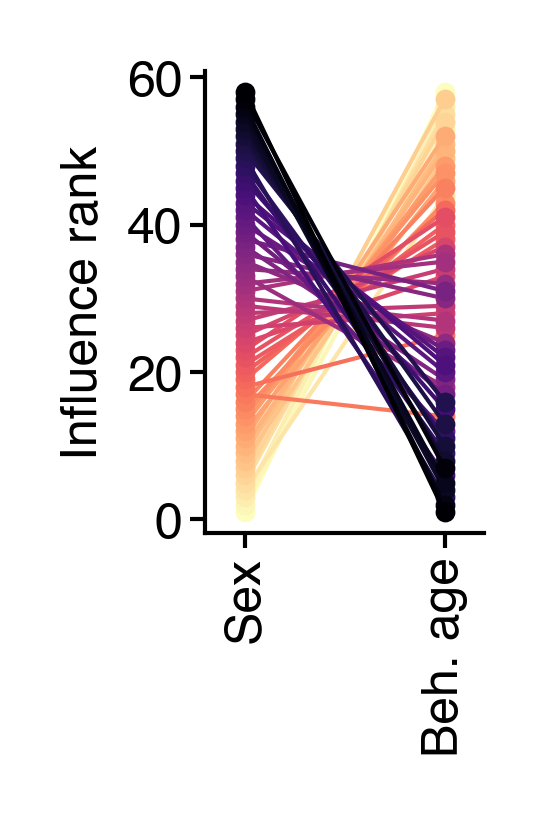

In [64]:
# NOTE: I don't think this plot is useful any more - this is a necessary outcome of looking at relative influence
fig = figure(0.6, 1)
ax = sns.pointplot(
    data=ranks,
    x="type",
    y="influence",
    hue="color",
    palette="magma_r",
    order=["Sex", "Beh. age"],
    legend=False,
    markersize=2,
    linewidth=0.5
)
ax.set(xlabel="", xlim=(-0.2, 1.2), ylabel="Influence rank")
plt.xticks(rotation=90)
sns.despine()
saver(fig, "sex-rank-order-influence");

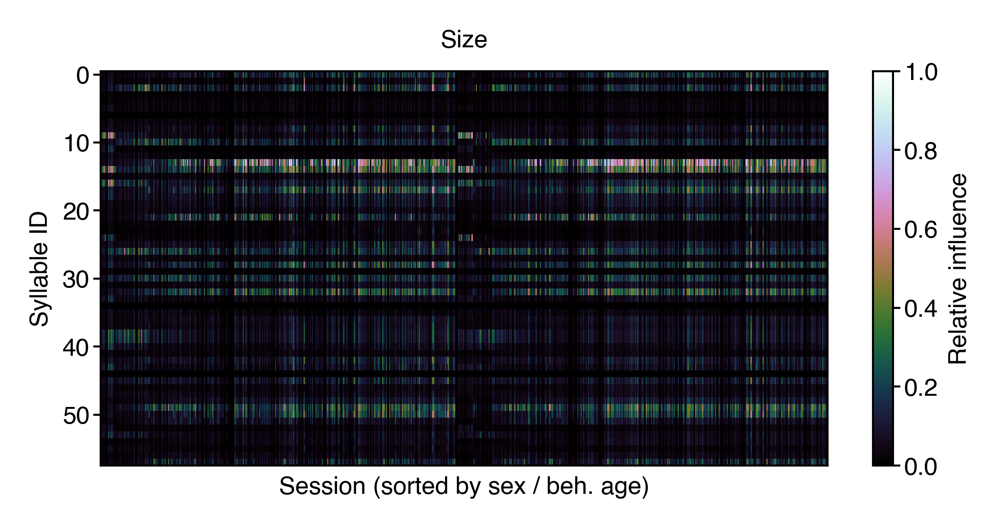

In [65]:
fig = figure(4, 1.75)
plt.imshow(size, aspect='auto', interpolation='none', vmin=0, vmax=1, cmap='cubehelix')
plt.colorbar(label="Relative influence")
plt.xticks([])
plt.ylabel("Syllable ID")
plt.title("Size")
plt.xlabel("Session (sorted by sex / beh. age)")
saver(fig, "sex-size-influence-matrix");

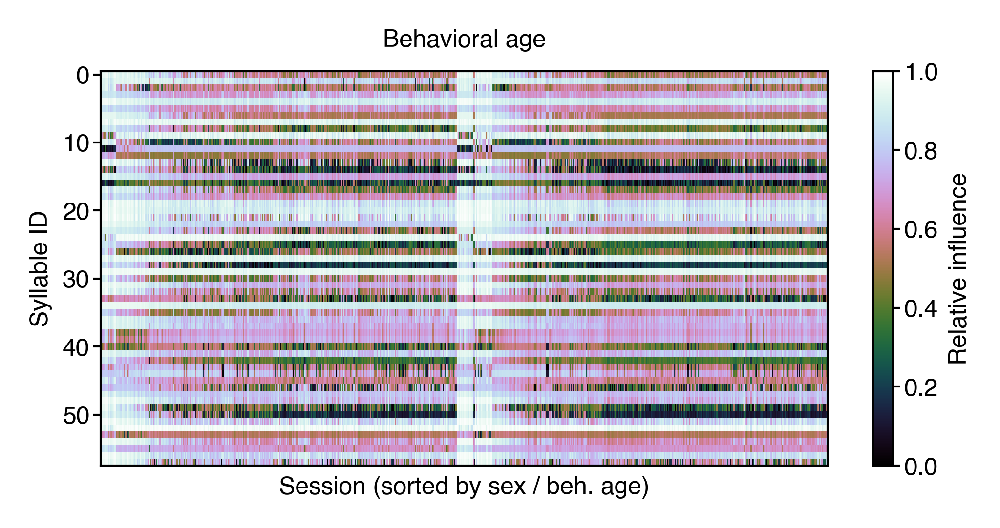

In [66]:
fig = figure(4, 1.75)
plt.imshow(bio, aspect='auto', interpolation='none', vmin=0, vmax=1, cmap='cubehelix')
plt.colorbar(label="Relative influence")
plt.xticks([])
plt.ylabel("Syllable ID")
plt.title("Behavioral age")
plt.xlabel("Session (sorted by sex / beh. age)")
saver(fig, "sex-beh-age-influence-matrix");

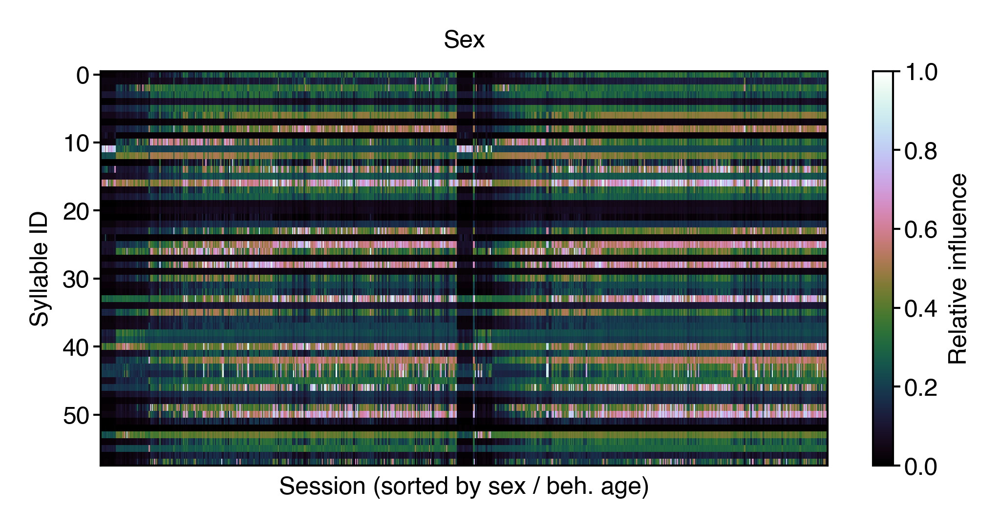

In [67]:
fig = figure(4, 1.75)
plt.imshow(indiv, aspect='auto', interpolation='none', vmin=0, vmax=1, cmap='cubehelix')
plt.colorbar(label="Relative influence")
plt.xticks([])
plt.ylabel("Syllable ID")
plt.title("Sex")
plt.xlabel("Session (sorted by sex / beh. age)")
saver(fig, "sex-indiv-influence-matrix");

## NMF on just males??

In [13]:
from sklearn.decomposition import NMF

### Males

In [14]:
mask = df.index.get_level_values('sex') == 0

nmf_df = pd.DataFrame(dict(age=mdl['true_ages'], bio_age=mdl['bio_ages']), index=df.index).loc[mask].copy()

_age = nmf_df['age'].to_numpy()
nmf_df = nmf_df.sort_values(by='bio_age')
nmf_df['bio_age_map'] = _age
nmf_df = nmf_df.loc[df.index[mask]]

In [15]:
nmf = NMF(n_components=4, random_state=0, max_iter=2_000)
scores = nmf.fit_transform(minmax(df.loc[mask].copy()))
nmf_keys = [f"{c + 1}" for c in range(4)]
nmf_df[nmf_keys] = scores

In [16]:
joblib.dump(nmf.components_, '/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/male-nmf-components.p')

['/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/male-nmf-components.p']

In [17]:
nmf_df.to_parquet('/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/male-nmf-scores.parquet')

In [18]:
cmap = COLORMAPS.ont_male(np.linspace(0, 1, 4))

In [19]:
chron_avg = nmf_df.groupby(level='age')[nmf_keys].mean()
bio_avg = nmf_df.groupby('bio_age_map')[nmf_keys].mean()

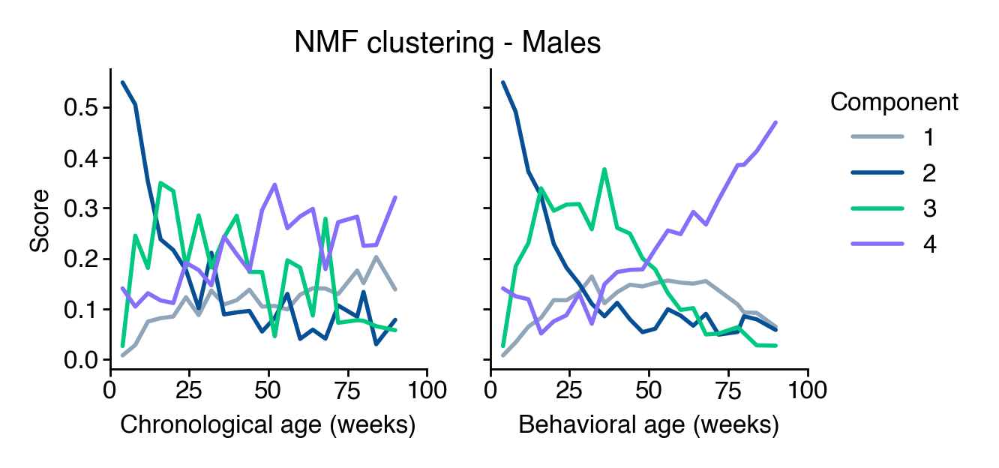

In [20]:
with plt.rc_context({'axes.prop_cycle': plt.cycler(color=cc.glasbey_cool[15:])}):
    fig, ax = plt.subplots(1, 2, figsize=(3, 1.3), sharey=True, sharex=True)
    a = chron_avg.plot(ax=ax[0], legend=False)
    a.set(xlabel="Chronological age (weeks)", ylabel="Score")
    a2 = bio_avg.plot(ax=ax[1])
    a2.set(xlabel="Behavioral age (weeks)", ylabel="Score", xlim=(0, 100))
    legend(a2, title="Component")
    sns.despine()
    fig.suptitle("NMF clustering - Males")
    saver(fig, "nmf-components-pre-post-sorting-blue-colors");

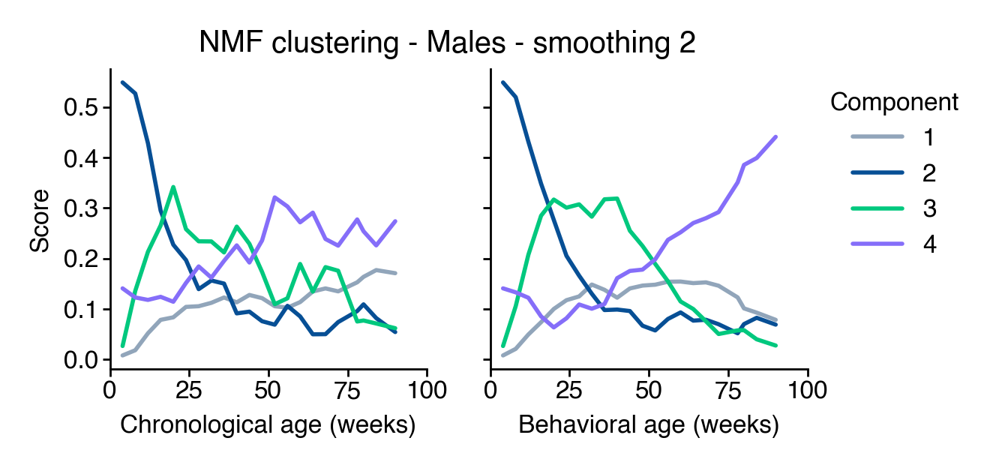

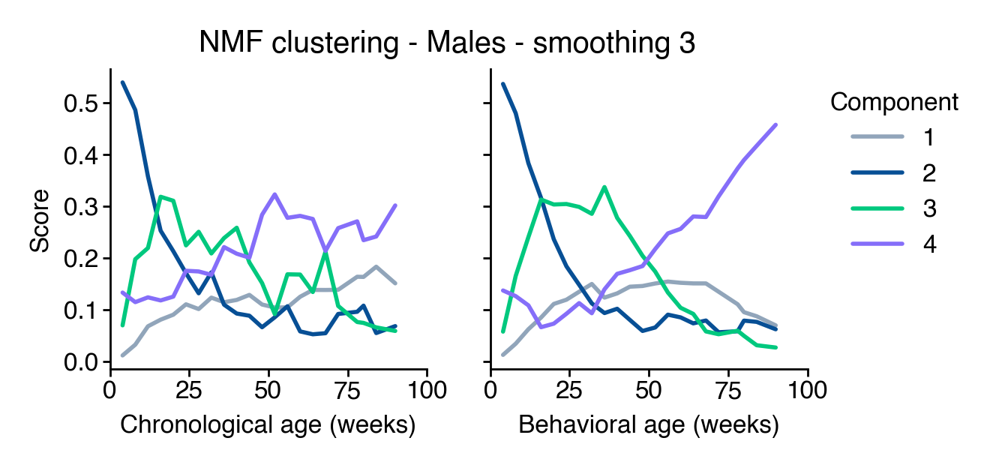

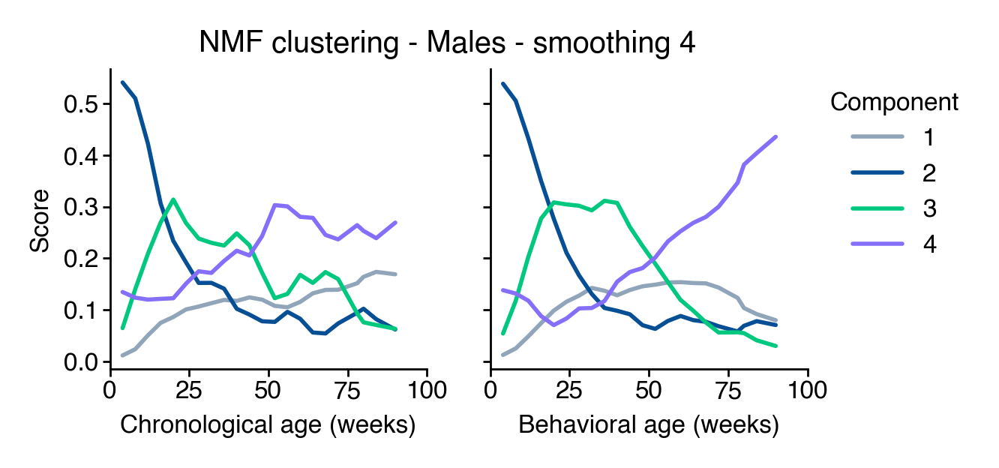

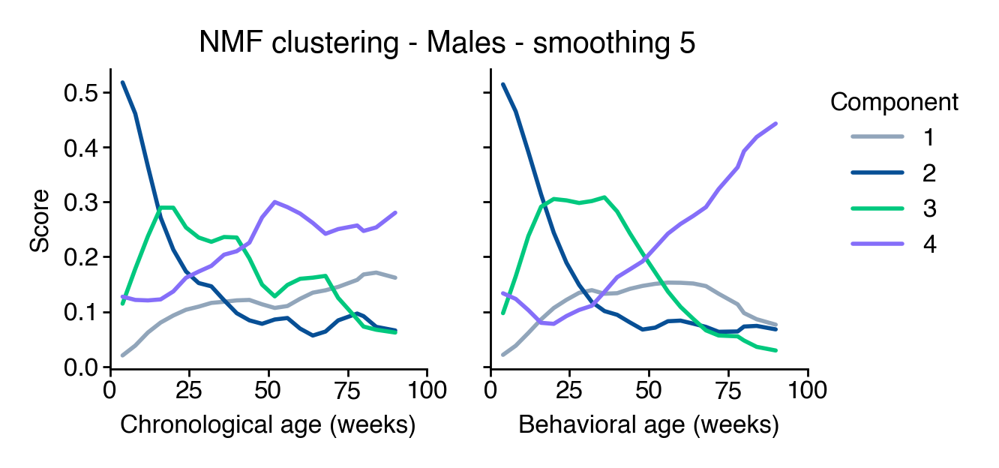

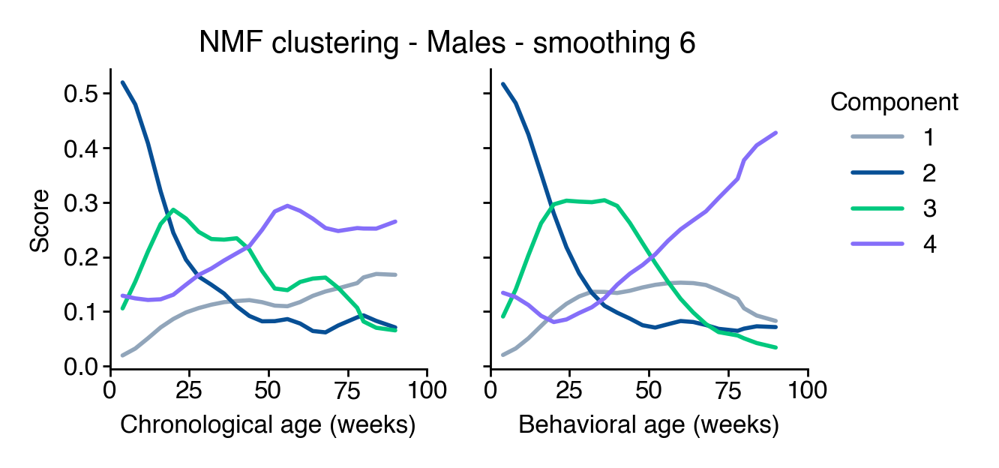

In [24]:
with plt.rc_context({'axes.prop_cycle': plt.cycler(color=cc.glasbey_cool[15:])}):
    for i in range(2, 7):
        fig, ax = plt.subplots(1, 2, figsize=(3, 1.3), sharey=True, sharex=True)
        a = chron_avg.rolling(i, center=True, min_periods=1, win_type='gaussian').mean(std=i * 0.2).plot(ax=ax[0], legend=False)
        a.set(xlabel="Chronological age (weeks)", ylabel="Score")
        a2 = bio_avg.rolling(i, center=True, min_periods=1, win_type='gaussian').mean(std=i * 0.3).plot(ax=ax[1])
        a2.set(xlabel="Behavioral age (weeks)", ylabel="Score", xlim=(0, 100))
        legend(a2, title="Component")
        sns.despine()
        fig.suptitle(f"NMF clustering - Males - smoothing {i}")
        saver(fig, f"nmf-components-pre-post-sorting-blue-colors-smoothing-{i}");

### Females

In [25]:
mask = df.index.get_level_values('sex') == 1

nmf_df = pd.DataFrame(dict(age=mdl['true_ages'], bio_age=mdl['bio_ages']), index=df.index).loc[mask].copy()

_age = nmf_df['age'].to_numpy()
nmf_df = nmf_df.sort_values(by='bio_age')
nmf_df['bio_age_map'] = _age
nmf_df = nmf_df.loc[df.index[mask]]

In [26]:
nmf = NMF(n_components=4, random_state=0, max_iter=2_000)
scores = nmf.fit_transform(minmax(df.loc[mask].copy()))
nmf_keys = [f"{c + 1}" for c in range(4)]
nmf_df[nmf_keys] = scores

In [82]:
joblib.dump(nmf.components_, '/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/female-nmf-components.p')

['/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/female-nmf-components.p']

In [77]:
nmf_df.to_parquet('/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/female-nmf-scores.parquet')

In [27]:
chron_avg = nmf_df.groupby(level='age')[nmf_keys].mean()
bio_avg = nmf_df.groupby('bio_age_map')[nmf_keys].mean()

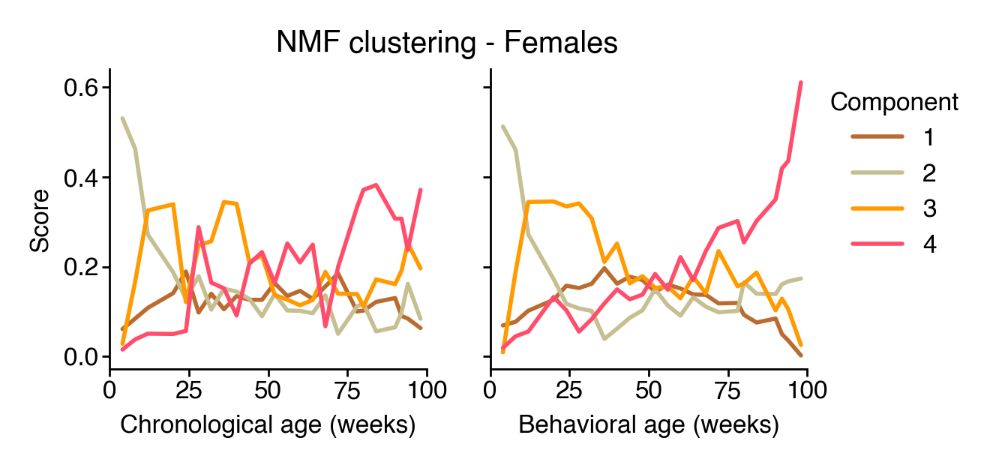

In [79]:
with plt.rc_context({'axes.prop_cycle': plt.cycler(color=cc.glasbey_warm[11:])}):
    fig, ax = plt.subplots(1, 2, figsize=(3, 1.3), sharey=True, sharex=True)
    a = chron_avg.plot(ax=ax[0], legend=False)
    a.set(xlabel="Chronological age (weeks)", ylabel="Score")
    a2 = bio_avg.plot(ax=ax[1])
    legend(a2, title="Component")
    a2.set(xlabel="Behavioral age (weeks)", ylabel="Score", xlim=(0, 100))
    sns.despine()
    fig.suptitle("NMF clustering - Females")
    saver(fig, "female-nmf-components-pre-post-sorting-blue-colors");

In [ ]:
with plt.rc_context({'axes.prop_cycle': plt.cycler(color=cc.glasbey_warm[11:])}):
    for i in range(2, 7):
        fig, ax = plt.subplots(1, 2, figsize=(3, 1.3), sharey=True, sharex=True)
        a = chron_avg.rolling(i, center=True, min_periods=1, win_type='gaussian').mean(std=i * 0.2).plot(ax=ax[0], legend=False)
        a.set(xlabel="Chronological age (weeks)", ylabel="Score")
        a2 = bio_avg.rolling(i, center=True, min_periods=1, win_type='gaussian').mean(std=i * 0.3).plot(ax=ax[1])
        a2.set(xlabel="Behavioral age (weeks)", ylabel="Score", xlim=(0, 100))
        legend(a2, title="Component")
        sns.despine()
        fig.suptitle(f"NMF clustering - Females - smoothing {i}")
        saver(fig, f"female-nmf-components-pre-post-sorting-blue-colors-smoothing-{i}");

## K-means

### males

#### sort by chron age

In [80]:
from itertools import combinations
from toolz import groupby, valmap, compose
from toolz.curried import get, pluck

from sklearn.cluster import k_means
from sklearn.metrics import silhouette_score
from itertools import product

In [81]:
class_df = pd.read_csv(
    "../v11_syllable_labels_v2.csv", index_col="Original ID", usecols=range(4)
)

def get_class(syll):
    return class_df.loc[syll, "Class"]

In [82]:
mask = df.index.get_level_values('sex') == 0

In [83]:
silhouettes = []

_males = df.loc[mask].copy()
for c, seed in tqdm(product(range(2, 7), range(500))):
    # mm_df = minmax(_males.sample(frac=1, replace=True, random_state=seed)).groupby('age').mean()
    mm_df = minmax(_males.sample(frac=1, replace=True, random_state=seed).groupby('age').mean())
    # mm_df = _males.groupby('age').mean()
    centroid, labels, inertia = k_means(mm_df.T, c, random_state=seed)
    silhouettes.append(dict(n_clust=c, seed=seed, s_sc=silhouette_score(mm_df.T, labels), sse=inertia))
silhouettes = pd.DataFrame(silhouettes)

0it [00:00, ?it/s]

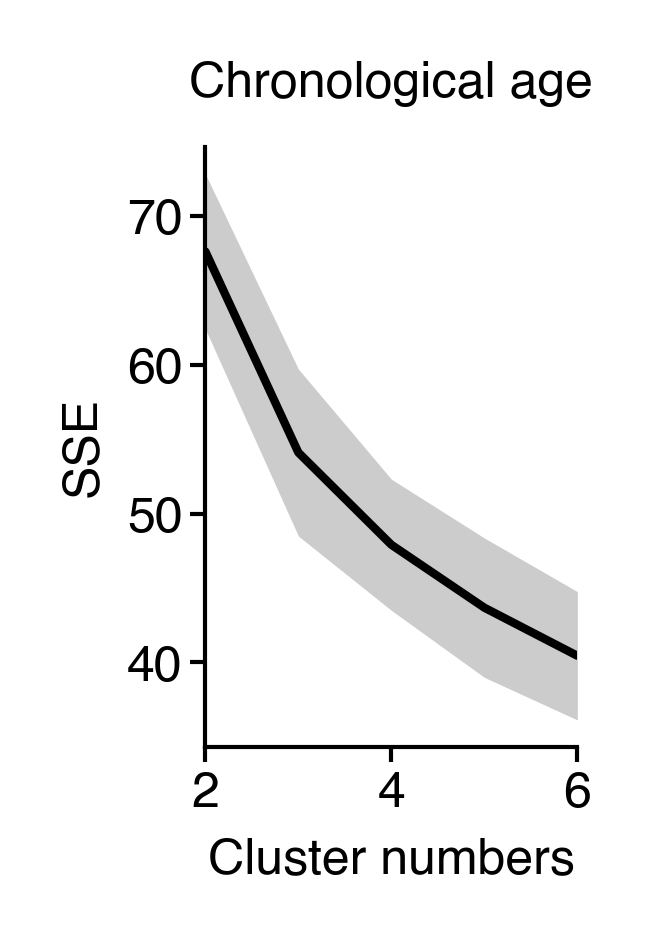

In [84]:
fig = figure(0.8, 1.3)
ax = sns.lineplot(
    data=silhouettes,
    x="n_clust",
    y="sse",
    errorbar=("sd", 2),
    err_kws=dict(lw=0),
    color="k",
)
# ax.axvline(4, color="gray", ls="--")
ax.set(ylabel="SSE", xlabel="Cluster numbers", xlim=(2, 6), title="Chronological age")
sns.despine()
# saver(fig, "male-k-means-cluster-silhouette-score-chron-age");

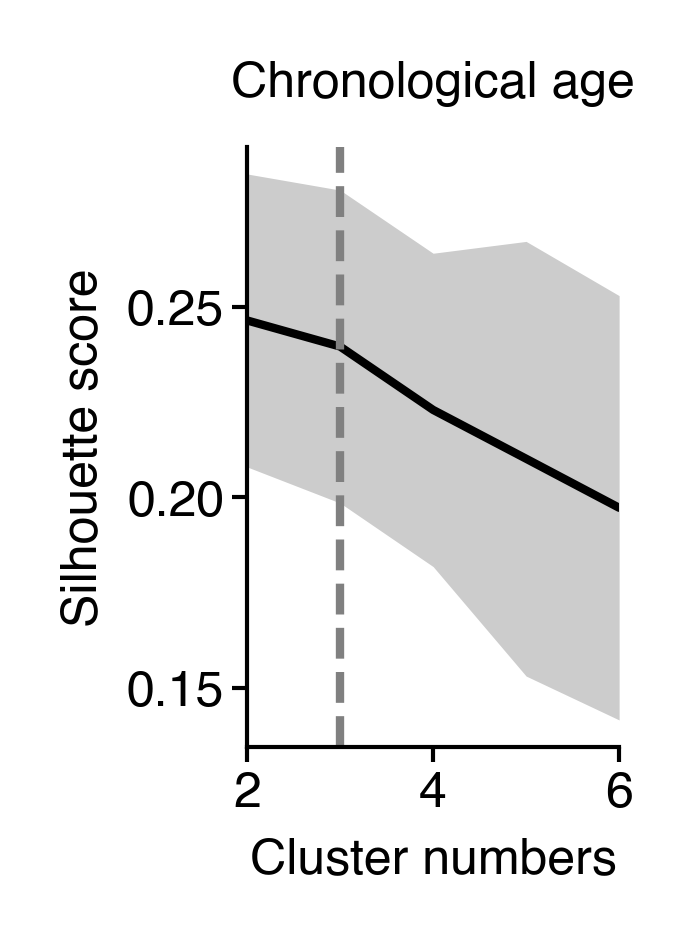

In [85]:
fig = figure(0.8, 1.3)
ax = sns.lineplot(
    data=silhouettes,
    x="n_clust",
    y="s_sc",
    errorbar=("sd", 2),
    err_kws=dict(lw=0),
    color="k",
)
ax.axvline(3, color="gray", ls="--")
ax.set(ylabel="Silhouette score", xlabel="Cluster numbers", xlim=(2, 6), title="Chronological age")
sns.despine()
saver(fig, "male-k-means-cluster-silhouette-score-chron-age");

In [86]:
_males = df.loc[mask].copy()
mm_df = minmax(_males.groupby('age').mean())

n_clust = 3

centroid_dfs = []
syllable_groups = {}

for seed in tqdm(range(5_000)):
    centroid, labels, inertia = k_means(mm_df.T, n_clust, random_state=seed)
    s_sc = silhouette_score(mm_df.T, labels)

    k = pd.DataFrame(centroid.T, index=mm_df.index)
    k['seed'] = seed
    k['s_sc'] = s_sc
    centroid_dfs.append(k)

    groups = groupby(get(0), zip(labels, mm_df.columns))
    groups = valmap(compose(list, pluck(1)), groups)
    syllable_groups[seed] = groups

  0%|          | 0/5000 [00:00<?, ?it/s]

In [87]:
best_kmeans = max(centroid_dfs, key=lambda x: x['s_sc'].max())
best_seed = best_kmeans['seed'].iloc[0]

In [88]:
best_kmeans.head(2)

,0,1,2,seed,s_sc
age,,,,,
4.0,0.121649,0.161167,0.771010,6,0.284515
8.0,0.597271,0.225964,0.860119,6,0.284515


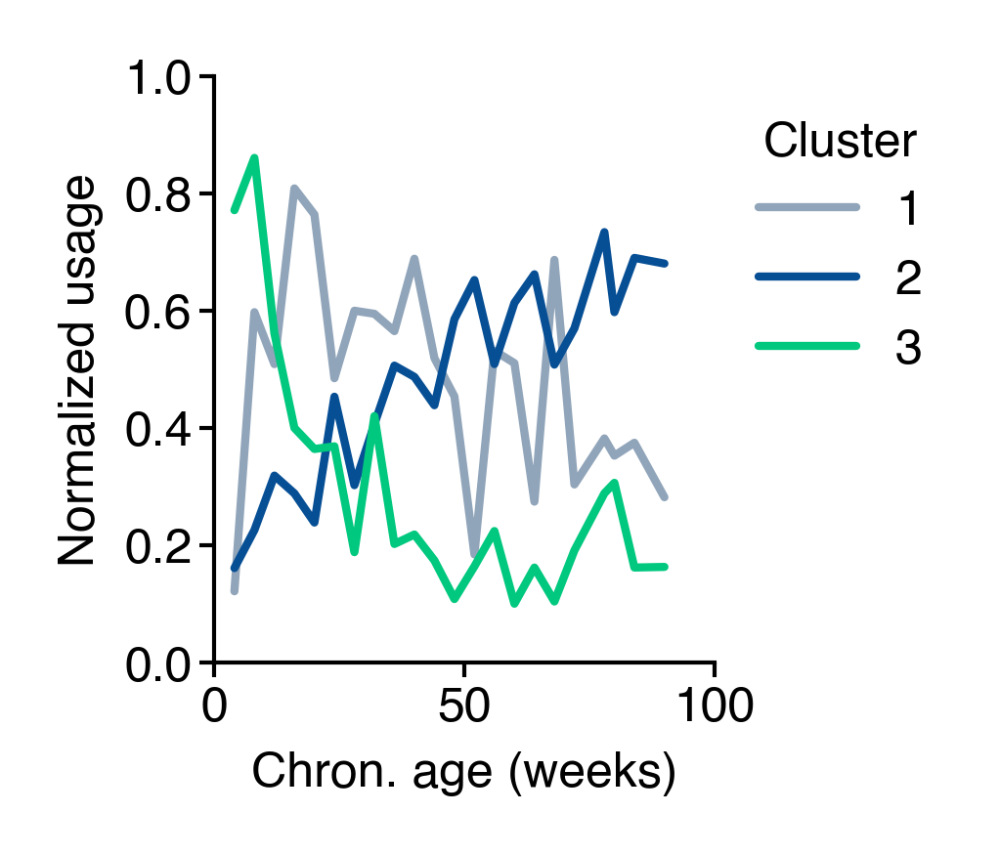

In [89]:
with plt.rc_context({'axes.prop_cycle': plt.cycler(color=cc.glasbey_cool[15:])}):
    fig = figure(1.1, 1.3)
    ax = fig.gca()
    ax = best_kmeans.drop(columns=['seed', 's_sc']).rename(columns=lambda x: x + 1).plot(ax=ax)
    legend(ax, title="Cluster")
    ax.set(xlabel="Chron. age (weeks)", ylabel="Normalized usage", xlim=(0, 100), ylim=(0, 1))
    sns.despine()
    saver(fig, "male-k-means-cluster-chron-age");

#### Cluster version with 4 plots, one for each cluster

In [90]:
syll_classes = valmap(lambda x: list(map(get_class, x)), syllable_groups[best_seed])
# sort classes
syll_classes = dict(sorted(syll_classes.items(), key=get(0)))

class_freqs = valmap(lambda x: pd.Series(x).value_counts(), syll_classes)

/n/groups/datta/win/longtogeny/code/aging/plotting.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


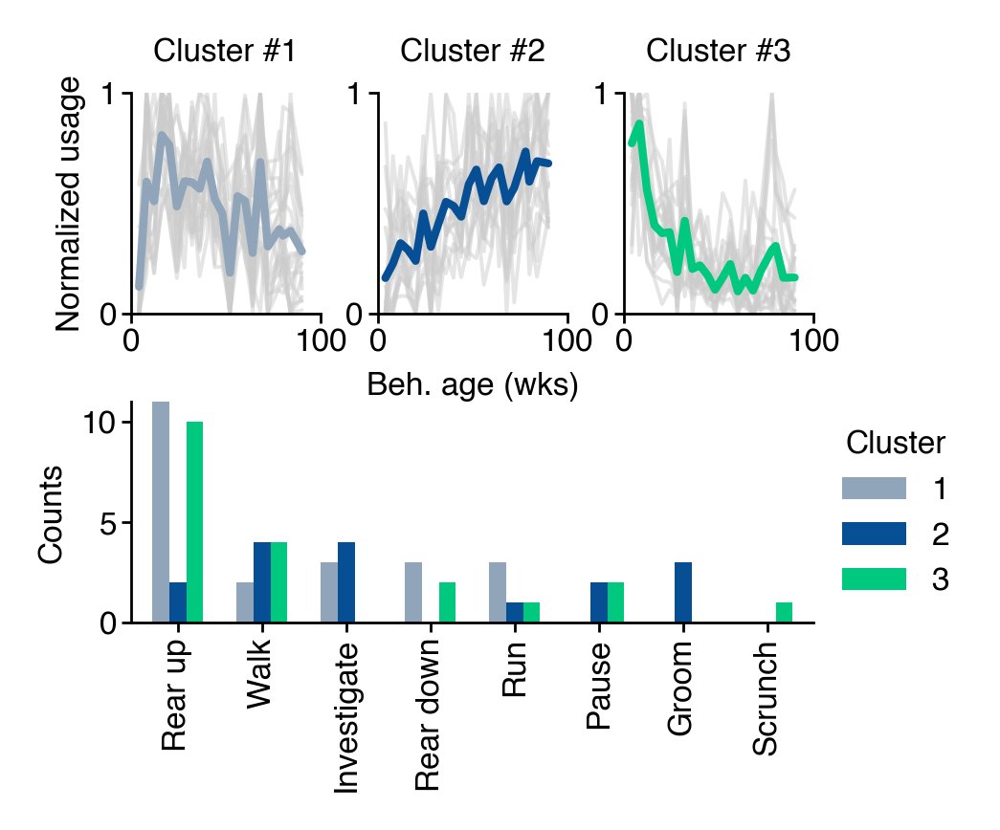

In [91]:
_classes = dict(sorted(syllable_groups[best_seed].items(), key=lambda item: item[0]))

mosaic = '''
abc
ddd
'''

fig, ax = plt.subplot_mosaic(mosaic, figsize=(2.3, 1.8), gridspec_kw={'wspace': 0.3, 'hspace': 0.4})

for _a, ((k, sylls), color) in enumerate(zip(_classes.items(), cc.glasbey_cool[15:])):
    letter = chr(_a + 97)
    a = ax[letter]
    mm_df[sylls].plot(ax=a, legend=False, color='#ccc', alpha=0.5, lw=0.7)
    a.plot(mm_df[sylls].mean(1), color=color, lw=1.5)
    a.set(title=f"Cluster #{k + 1}", xlabel="", ylim=(0, 1), yticks=(0, 1), xlim=(0, 100))
ax['a'].set(ylabel="Normalized usage")
ax['b'].set(xlabel="Beh. age (wks)")

with plt.rc_context({'axes.prop_cycle': plt.cycler(color=cc.glasbey_cool[15:])}):
    a = ax['d']
    cf_df = pd.DataFrame(class_freqs).fillna(0).rename(columns=lambda x: x+1)
    cf_df = cf_df.loc[cf_df.sum(1).sort_values(ascending=False).index]
    a = cf_df.plot(kind='bar', ax=a, width=0.6, linewidth=0)
    legend(a, title="Cluster")
    a.set(ylabel="Counts", xlabel="", ylim=(0, cf_df.max().max()))
sns.despine()
saver(fig, "male-k-means-cluster-all-sylls-chron-age", tight_layout=True);

In [92]:
joblib.dump(syllable_groups[best_seed], '/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/male-kmeans-label-dict-chron-age.p')

['/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/male-kmeans-label-dict-chron-age.p']

#### Sort by bio age

In [93]:
silhouettes = []

_males = df.loc[mask].copy()
_males['bio_age'] = mdl['bio_ages'][mask]
_age = _males.index.get_level_values('age')
_males = _males.sort_values(by='bio_age')
_males['bio_age_map'] = _age.to_numpy()
_males = _males.loc[df.index[mask]].drop(columns=['bio_age']).set_index('bio_age_map', append=True)

for c, seed in tqdm(product(range(2, 7), range(500))):
    mm_df = minmax(_males.sample(frac=1, replace=True, random_state=seed).groupby('bio_age_map').mean())
    pd_mtx = squareform(pdist(mm_df.T, metric='correlation'))

    cols = mm_df.columns.to_numpy()
    col_map = dict(map(reversed, enumerate(cols)))

    def to_syll_array(sylls):
        return np.array([col_map[s] for s in sylls])

    # mm_df = _males.groupby('bio_age_map').mean()
    centroid, labels, inertia = k_means(mm_df.T, c, random_state=seed)

    groups = groupby(get(0), zip(labels, mm_df.columns))
    groups = valmap(compose(list, pluck(1)), groups)

    dists = {}
    for a, b in combinations(range(c), 2):
        dists[a, b] = pd_mtx[to_syll_array(groups[a])[:, None], to_syll_array(groups[b])[None]].mean()
    corr_dist = np.mean(list(dists.values()))

    silhouettes.append(dict(n_clust=c, seed=seed, s_sc=silhouette_score(mm_df.T, labels), sse=inertia, corr_dist=corr_dist))
silhouettes = pd.DataFrame(silhouettes)

0it [00:00, ?it/s]

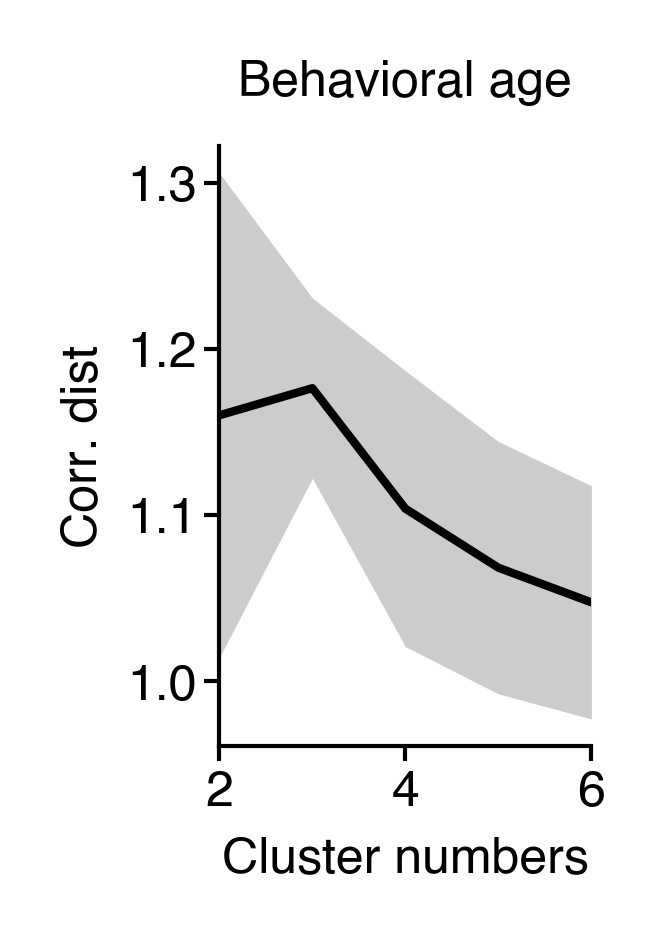

In [94]:
fig = figure(0.8, 1.3)
ax = sns.lineplot(
    data=silhouettes,
    x="n_clust",
    y="corr_dist",
    errorbar=("sd", 2),
    err_kws=dict(lw=0),
    color="k",
)
# ax.axvline(4, color="gray", ls="--")
ax.set(ylabel="Corr. dist", xlabel="Cluster numbers", xlim=(2, 6), title="Behavioral age")
sns.despine()
# saver(fig, "male-k-means-cluster-silhouette-score-beh-age");

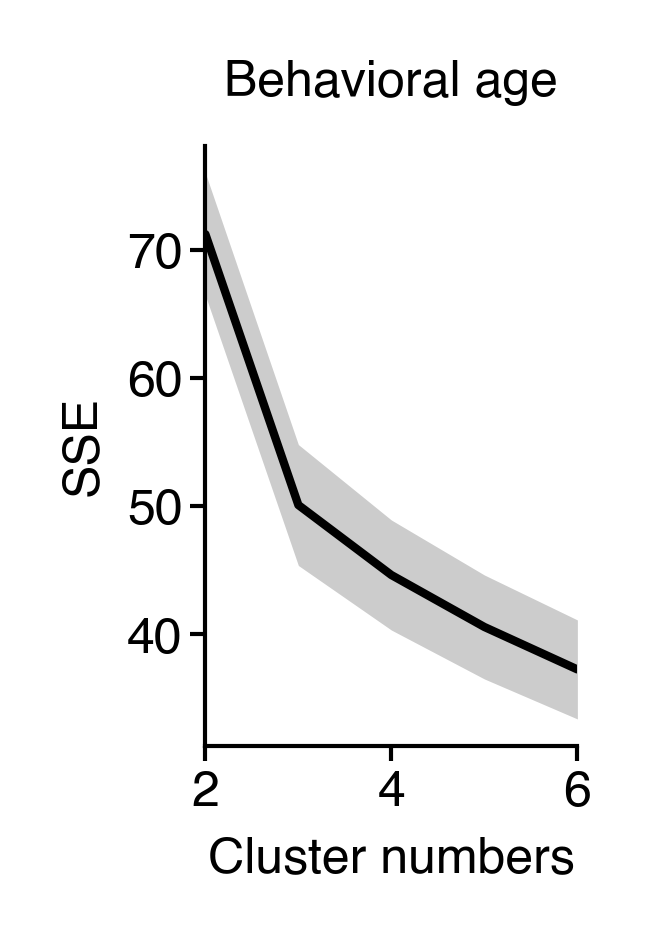

In [95]:
fig = figure(0.8, 1.3)
ax = sns.lineplot(
    data=silhouettes,
    x="n_clust",
    y="sse",
    errorbar=("sd", 2),
    err_kws=dict(lw=0),
    color="k",
)
# ax.axvline(4, color="gray", ls="--")
ax.set(ylabel="SSE", xlabel="Cluster numbers", xlim=(2, 6), title="Behavioral age")
sns.despine()
# saver(fig, "male-k-means-cluster-silhouette-score-beh-age");

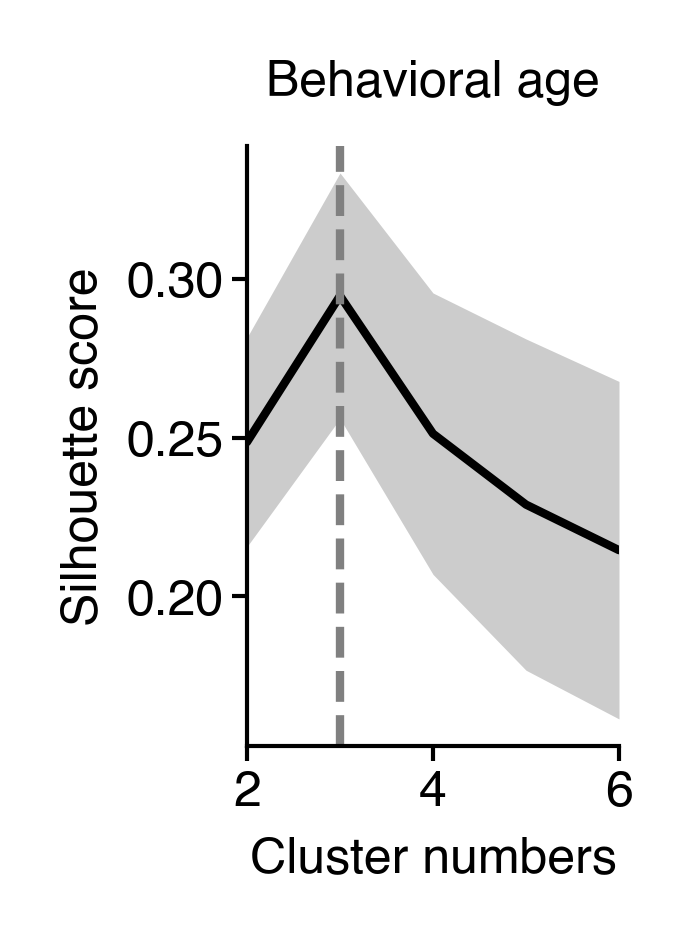

In [96]:
fig = figure(0.8, 1.3)
ax = sns.lineplot(
    data=silhouettes,
    x="n_clust",
    y="s_sc",
    errorbar=("sd", 2),
    err_kws=dict(lw=0),
    color="k",
)
ax.axvline(3, color="gray", ls="--")
ax.set(ylabel="Silhouette score", xlabel="Cluster numbers", xlim=(2, 6), title="Behavioral age")
sns.despine()
saver(fig, "male-k-means-cluster-silhouette-score-beh-age");

In [97]:
_males = df.loc[mask].copy()
_males['bio_age'] = mdl['bio_ages'][mask]
_age = _males.index.get_level_values('age')
_males = _males.sort_values(by='bio_age')
_males['bio_age_map'] = _age.to_numpy()
_males = _males.loc[df.index[mask]].drop(columns=['bio_age']).set_index('bio_age_map', append=True)

mm_df = minmax(_males.groupby('bio_age_map').mean())

n_clust = 3

centroid_dfs = []
syllable_groups = {}

for seed in tqdm(range(5_000)):
    centroid, labels, inertia = k_means(mm_df.T, n_clust, random_state=seed)
    s_sc = silhouette_score(mm_df.T, labels)

    k = pd.DataFrame(centroid.T, index=mm_df.index)
    k['seed'] = seed
    k['s_sc'] = s_sc

    groups = groupby(get(0), zip(labels, mm_df.columns))
    groups = valmap(compose(list, pluck(1)), groups)
    syllable_groups[seed] = groups

    centroid_dfs.append(k)

  0%|          | 0/5000 [00:00<?, ?it/s]

In [98]:
best_kmeans = max(centroid_dfs, key=lambda x: x['s_sc'].max())
best_seed = best_kmeans['seed'].iloc[0]

In [99]:
best_kmeans.head(2)

,0,1,2,seed,s_sc
bio_age_map,,,,,
4.0,0.217908,0.166180,0.808576,10,0.348334
8.0,0.542583,0.213855,0.835373,10,0.348334


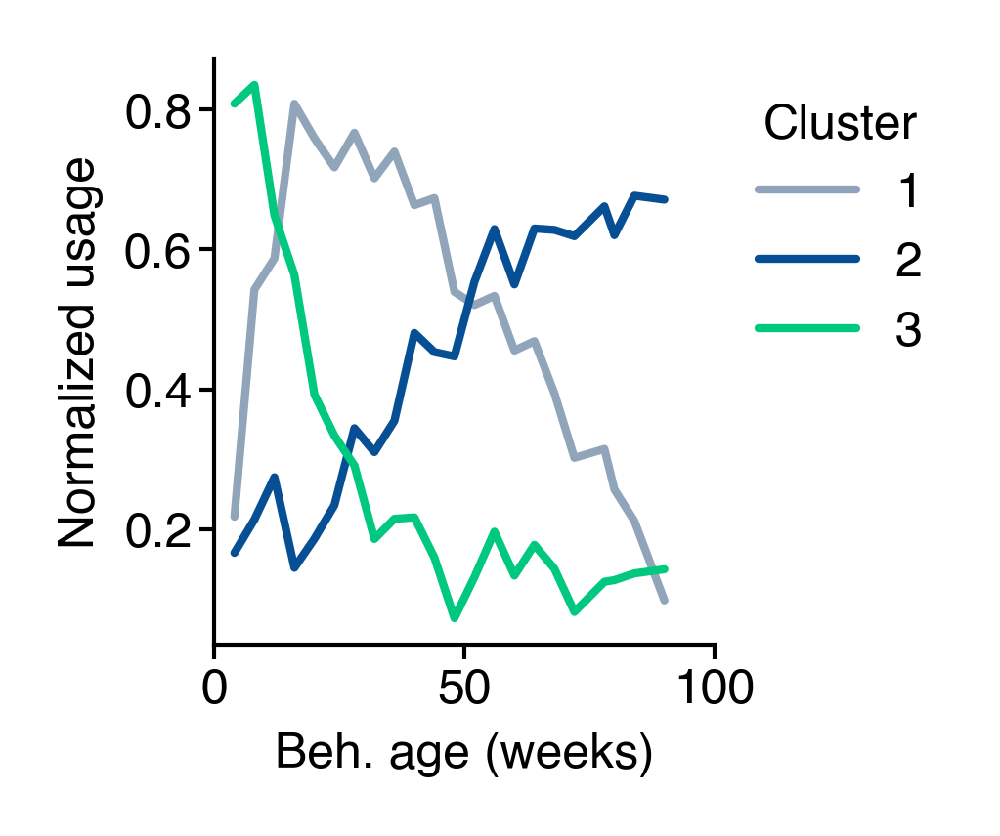

In [100]:
with plt.rc_context({'axes.prop_cycle': plt.cycler(color=cc.glasbey_cool[15:])}):
    fig = figure(1.1, 1.3)
    ax = fig.gca()
    ax = best_kmeans.drop(columns=['seed', 's_sc']).rename(columns=lambda x: x + 1).plot(ax=ax)
    legend(ax, title="Cluster")
    ax.set(xlabel="Beh. age (weeks)", ylabel="Normalized usage", xlim=(0, 100))
    sns.despine()
    saver(fig, "male-k-means-cluster-beh-age");

In [101]:
syll_classes = valmap(lambda x: list(map(get_class, x)), syllable_groups[best_seed])
# sort classes
syll_classes = dict(sorted(syll_classes.items(), key=get(0)))

class_freqs = valmap(lambda x: pd.Series(x).value_counts(), syll_classes)

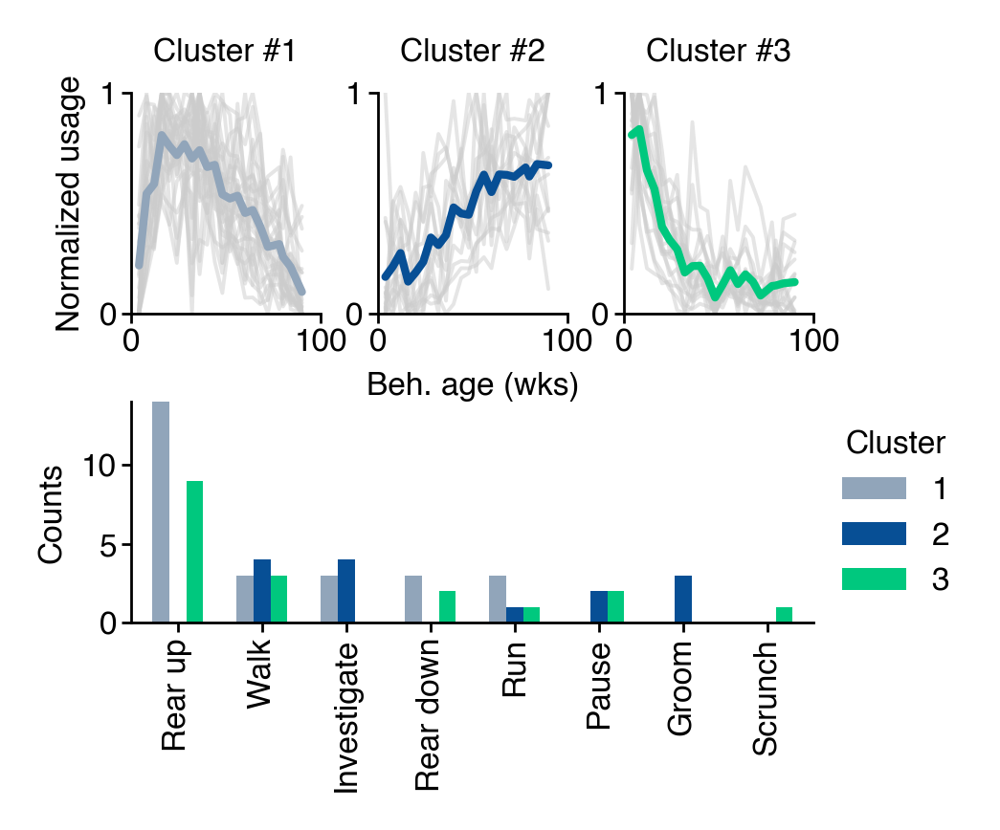

In [102]:
_classes = dict(sorted(syllable_groups[best_seed].items(), key=lambda item: item[0]))

mosaic = '''
abc
ddd
'''

fig, ax = plt.subplot_mosaic(mosaic, figsize=(2.3, 1.8), gridspec_kw={'wspace': 0.3, 'hspace': 0.4})

for _a, ((k, sylls), color) in enumerate(zip(_classes.items(), cc.glasbey_cool[15:])):
    letter = chr(_a + 97)
    a = ax[letter]
    mm_df[sylls].plot(ax=a, legend=False, color='#ccc', alpha=0.5, lw=0.7)
    a.plot(mm_df[sylls].mean(1), color=color, lw=1.5)
    a.set(title=f"Cluster #{k + 1}", xlabel="", ylim=(0, 1), yticks=(0, 1), xlim=(0, 100))
ax['a'].set(ylabel="Normalized usage")
ax['b'].set(xlabel="Beh. age (wks)")

with plt.rc_context({'axes.prop_cycle': plt.cycler(color=cc.glasbey_cool[15:])}):
    a = ax['d']
    cf_df = pd.DataFrame(class_freqs).fillna(0).rename(columns=lambda x: x+1)
    cf_df = cf_df.loc[cf_df.sum(1).sort_values(ascending=False).index]
    a = cf_df.plot(kind='bar', ax=a, width=0.6, linewidth=0)
    legend(a, title="Cluster")
    a.set(ylabel="Counts", xlabel="", ylim=(0, cf_df.max().max()))
sns.despine()
saver(fig, "male-k-means-cluster-all-sylls-beh-age", tight_layout=False);

Clusters

0: groom is main syllable

1: rear up (some version)

2: rear up also? (how is it distinguished from c1?)

3: rear and investigate (infotaxis?)

In [103]:
joblib.dump(syllable_groups[best_seed], '/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/male-kmeans-label-dict-beh-age.p')

['/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/male-kmeans-label-dict-beh-age.p']

### females

In [104]:
mask = df.index.get_level_values('sex') == 1

In [105]:
silhouettes = []

_males = df.loc[mask].copy()
for c, seed in tqdm(product(range(2, 7), range(500))):
    mm_df = minmax(_males.sample(frac=1, replace=True, random_state=seed).groupby('age').mean())
    # mm_df = _males.groupby('age').mean()
    centroid, labels, inertia = k_means(mm_df.T, c, random_state=seed)
    silhouettes.append(dict(n_clust=c, seed=seed, s_sc=silhouette_score(mm_df.T, labels), sse=inertia))
silhouettes = pd.DataFrame(silhouettes)

0it [00:00, ?it/s]

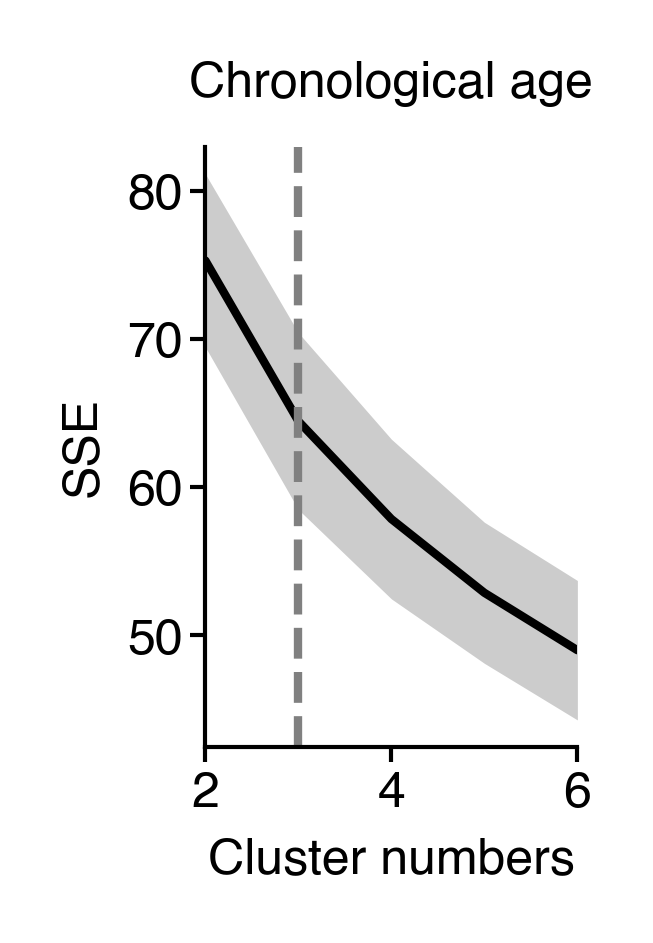

In [106]:
fig = figure(0.8, 1.3)
ax = sns.lineplot(
    data=silhouettes,
    x="n_clust",
    y="sse",
    errorbar=("sd", 2),
    err_kws=dict(lw=0),
    color="k",
)
ax.axvline(3, color="gray", ls="--")
ax.set(ylabel="SSE", xlabel="Cluster numbers", xlim=(2, 6), title="Chronological age")
sns.despine()
# saver(fig, "female-k-means-cluster-silhouette-score-chron-age");

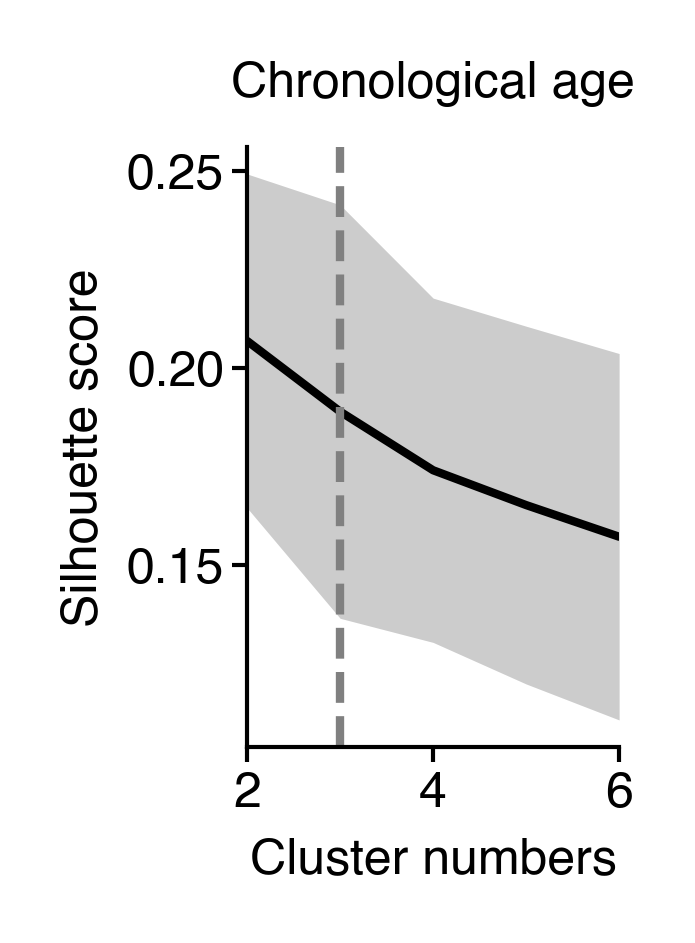

In [107]:
fig = figure(0.8, 1.3)
ax = sns.lineplot(
    data=silhouettes,
    x="n_clust",
    y="s_sc",
    errorbar=("sd", 2),
    err_kws=dict(lw=0),
    color="k",
)
ax.axvline(3, color="gray", ls="--")
ax.set(ylabel="Silhouette score", xlabel="Cluster numbers", xlim=(2, 6), title="Chronological age")
sns.despine()
saver(fig, "female-k-means-cluster-silhouette-score-chron-age");

In [108]:
_males = df.loc[mask].copy()
mm_df = minmax(_males.groupby('age').mean())

n_clust = 3

centroid_dfs = []
syllable_groups = {}

for seed in tqdm(range(5_000)):
    centroid, labels, inertia = k_means(mm_df.T, n_clust, random_state=seed)
    s_sc = silhouette_score(mm_df.T, labels)

    k = pd.DataFrame(centroid.T, index=mm_df.index)
    k['seed'] = seed
    k['s_sc'] = s_sc
    centroid_dfs.append(k)

    groups = groupby(get(0), zip(labels, mm_df.columns))
    groups = valmap(compose(list, pluck(1)), groups)
    syllable_groups[seed] = groups

  0%|          | 0/5000 [00:00<?, ?it/s]

In [109]:
best_kmeans = max(centroid_dfs, key=lambda x: x['s_sc'].max())
best_seed = best_kmeans['seed'].iloc[0]

In [110]:
best_kmeans.head(2)

,0,1,2,seed,s_sc
age,,,,,
4.0,0.045398,0.683069,0.431375,0,0.247187
8.0,0.267009,0.760724,0.408288,0,0.247187


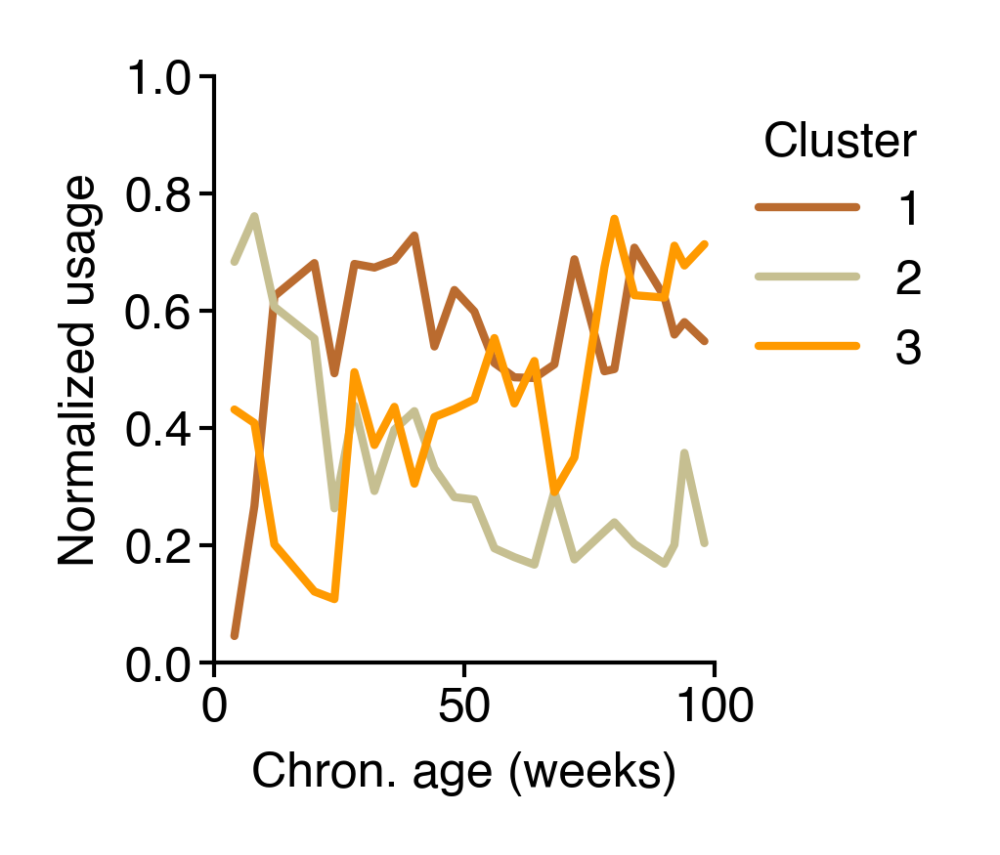

In [111]:
with plt.rc_context({'axes.prop_cycle': plt.cycler(color=cc.glasbey_warm[11:])}):
    fig = figure(1.1, 1.3)
    ax = fig.gca()
    ax = best_kmeans.drop(columns=['seed', 's_sc']).rename(columns=lambda x: x + 1).plot(ax=ax)
    legend(ax, title="Cluster")
    ax.set(xlabel="Chron. age (weeks)", ylabel="Normalized usage", xlim=(0, 100), ylim=(0, 1))
    sns.despine()
    saver(fig, "female-k-means-cluster-chron-age");

In [112]:
syll_classes = valmap(lambda x: list(map(get_class, x)), syllable_groups[best_seed])
# sort classes
syll_classes = dict(sorted(syll_classes.items(), key=get(0)))

class_freqs = valmap(lambda x: pd.Series(x).value_counts(), syll_classes)

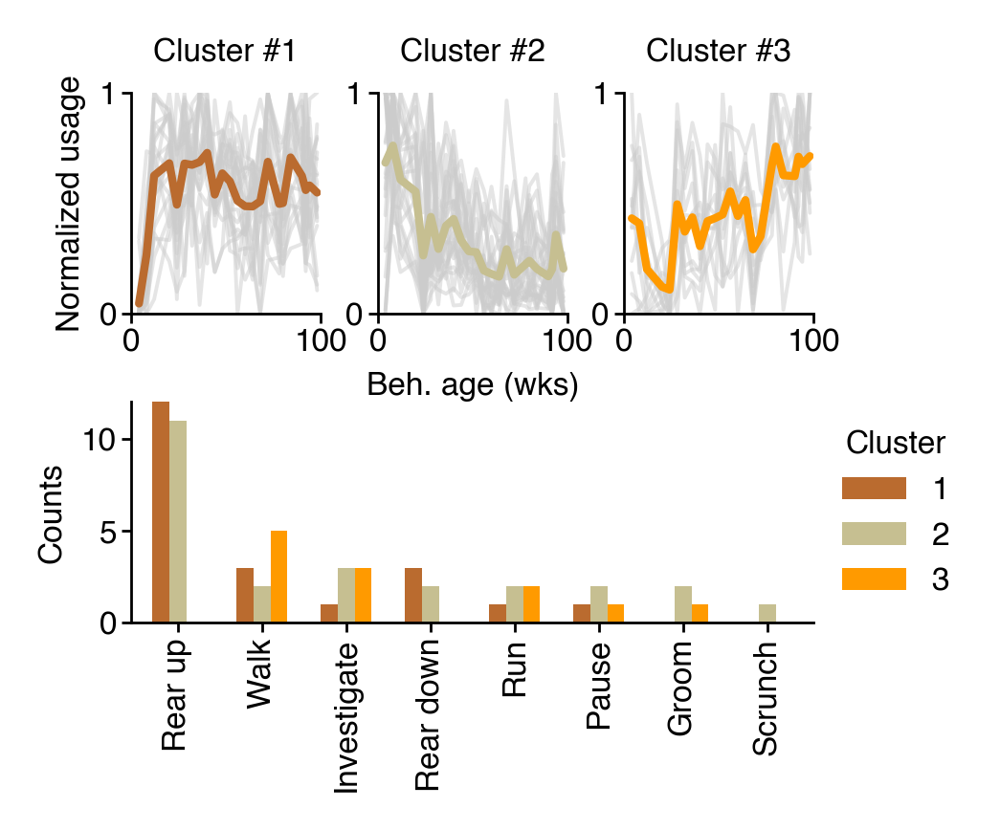

In [113]:
_classes = dict(sorted(syllable_groups[best_seed].items(), key=lambda item: item[0]))

mosaic = '''
abc
ddd
'''

fig, ax = plt.subplot_mosaic(mosaic, figsize=(2.3, 1.8), gridspec_kw={'wspace': 0.3, 'hspace': 0.4})

for _a, ((k, sylls), color) in enumerate(zip(_classes.items(), cc.glasbey_warm[11:])):
    letter = chr(_a + 97)
    a = ax[letter]
    mm_df[sylls].plot(ax=a, legend=False, color='#ccc', alpha=0.5, lw=0.7)
    a.plot(mm_df[sylls].mean(1), color=color, lw=1.5)
    a.set(title=f"Cluster #{k + 1}", xlabel="", ylim=(0, 1), yticks=(0, 1), xlim=(0, 100))
ax['a'].set(ylabel="Normalized usage")
ax['b'].set(xlabel="Beh. age (wks)")
with plt.rc_context({'axes.prop_cycle': plt.cycler(color=cc.glasbey_warm[11:])}):
    a = ax['d']
    cf_df = pd.DataFrame(class_freqs).fillna(0).rename(columns=lambda x: x+1)
    cf_df = cf_df.loc[cf_df.sum(1).sort_values(ascending=False).index]
    a = cf_df.plot(kind='bar', ax=a, width=0.6, linewidth=0)
    legend(a, title="Cluster")
    a.set(ylabel="Counts", xlabel="", ylim=(0, cf_df.max().max()))
sns.despine()
saver(fig, "female-k-means-cluster-all-sylls-chron-age", tight_layout=False);

In [114]:
joblib.dump(syllable_groups[best_seed], '/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/female-kmeans-label-dict-chron-age.p')

['/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/female-kmeans-label-dict-chron-age.p']

#### Sort by bio age

In [115]:
silhouettes = []

_males = df.loc[mask].copy()
_males['bio_age'] = mdl['bio_ages'][mask]
_age = _males.index.get_level_values('age')
_males = _males.sort_values(by='bio_age')
_males['bio_age_map'] = _age.to_numpy()
_males = _males.loc[df.index[mask]].drop(columns=['bio_age']).set_index('bio_age_map', append=True)

for c, seed in tqdm(product(range(2, 7), range(500))):
    mm_df = minmax(_males.sample(frac=1, replace=True, random_state=seed).groupby('bio_age_map').mean())
    # mm_df = _males.groupby('bio_age_map').mean()
    centroid, labels, inertia = k_means(mm_df.T, c, random_state=seed)
    silhouettes.append(dict(n_clust=c, seed=seed, s_sc=silhouette_score(mm_df.T, labels), sse=inertia))
silhouettes = pd.DataFrame(silhouettes)

0it [00:00, ?it/s]

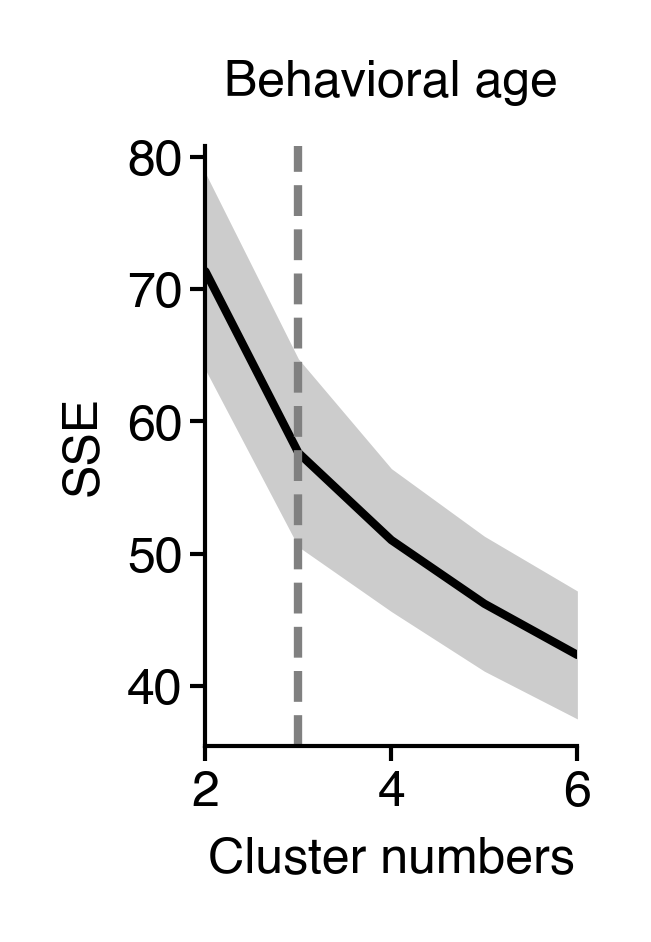

In [116]:
fig = figure(0.8, 1.3)
ax = sns.lineplot(
    data=silhouettes,
    x="n_clust",
    y="sse",
    errorbar=("sd", 2),
    err_kws=dict(lw=0),
    color="k",
)
ax.axvline(3, color="gray", ls="--")
ax.set(ylabel="SSE", xlabel="Cluster numbers", xlim=(2, 6), title="Behavioral age")
sns.despine()
# saver(fig, "female-k-means-cluster-silhouette-score-beh-age");

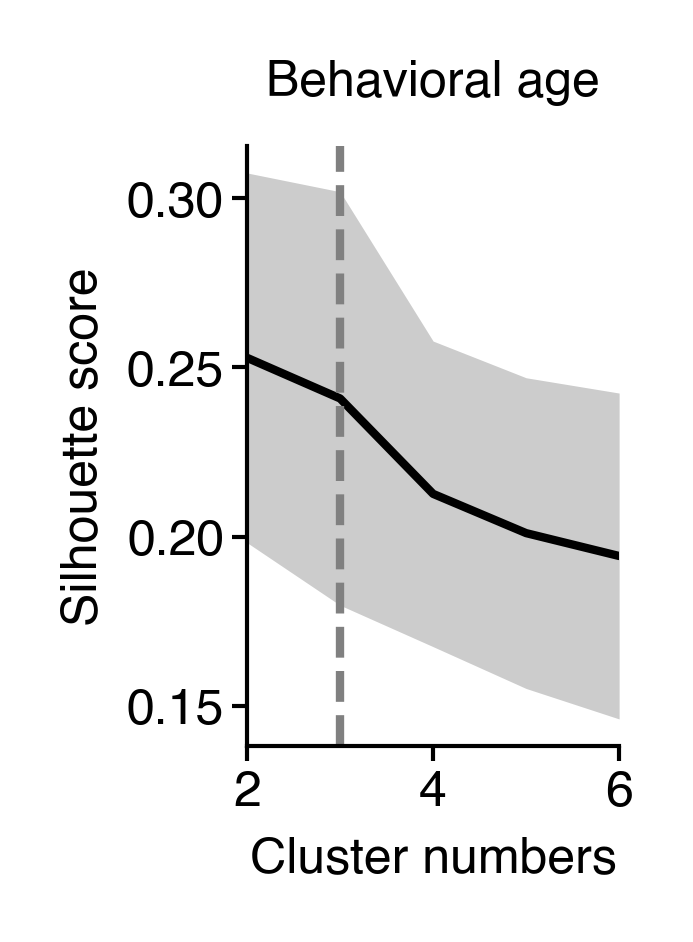

In [117]:
fig = figure(0.8, 1.3)
ax = sns.lineplot(
    data=silhouettes,
    x="n_clust",
    y="s_sc",
    errorbar=("sd", 2),
    err_kws=dict(lw=0),
    color="k",
)
ax.axvline(3, color="gray", ls="--")
ax.set(ylabel="Silhouette score", xlabel="Cluster numbers", xlim=(2, 6), title="Behavioral age")
sns.despine()
saver(fig, "female-k-means-cluster-silhouette-score-beh-age");

In [118]:
_males = df.loc[mask].copy()
_males['bio_age'] = mdl['bio_ages'][mask]
_age = _males.index.get_level_values('age')
_males = _males.sort_values(by='bio_age')
_males['bio_age_map'] = _age.to_numpy()
_males = _males.loc[df.index[mask]].drop(columns=['bio_age']).set_index('bio_age_map', append=True)

mm_df = minmax(_males.groupby('bio_age_map').mean())

n_clust = 3

centroid_dfs = []
syllable_groups = {}

for seed in tqdm(range(5_000)):
    centroid, labels, inertia = k_means(mm_df.T, n_clust, random_state=seed)
    s_sc = silhouette_score(mm_df.T, labels)

    k = pd.DataFrame(centroid.T, index=mm_df.index)
    k['seed'] = seed
    k['s_sc'] = s_sc
    centroid_dfs.append(k)

    groups = groupby(get(0), zip(labels, mm_df.columns))
    groups = valmap(compose(list, pluck(1)), groups)
    syllable_groups[seed] = groups

  0%|          | 0/5000 [00:00<?, ?it/s]

In [119]:
best_kmeans = max(centroid_dfs, key=lambda x: x['s_sc'].max())
best_seed = best_kmeans['seed'].iloc[0]

In [120]:
best_kmeans.head(2)

,0,1,2,seed,s_sc
bio_age_map,,,,,
4.0,0.543267,0.148150,0.435715,1,0.317144
8.0,0.772435,0.349133,0.419818,1,0.317144


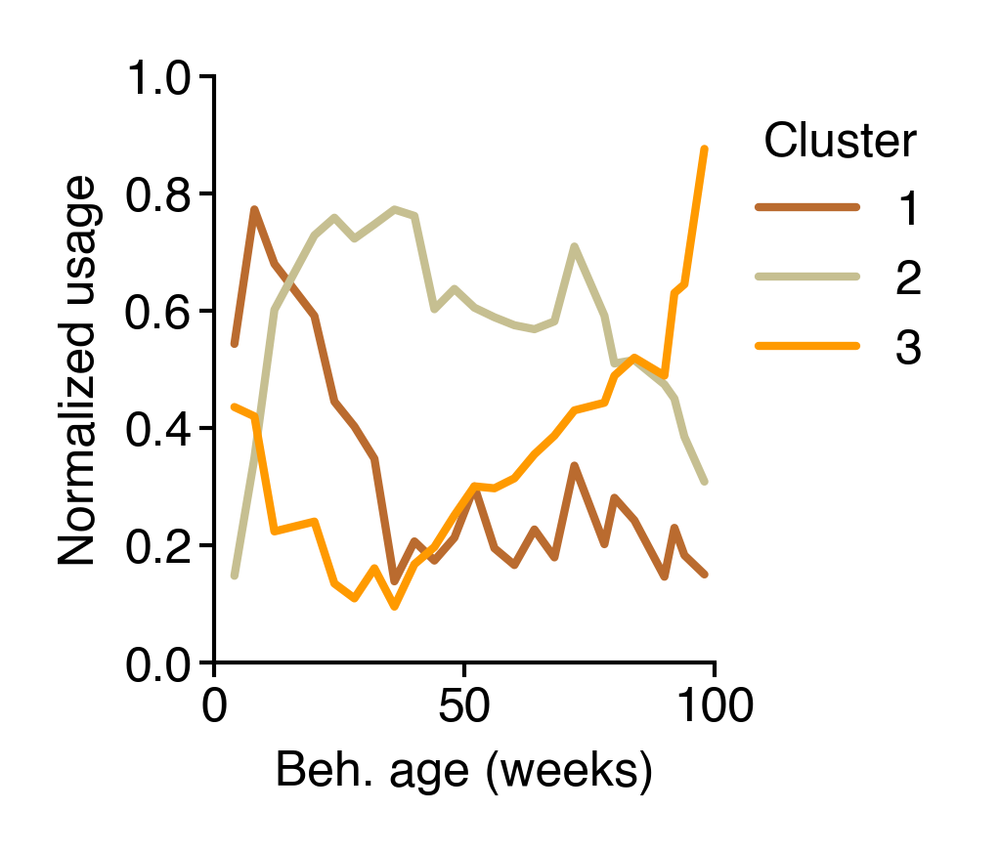

In [121]:
with plt.rc_context({'axes.prop_cycle': plt.cycler(color=cc.glasbey_warm[11:])}):
    fig = figure(1.1, 1.3)
    ax = fig.gca()
    ax = best_kmeans.drop(columns=['seed', 's_sc']).rename(columns=lambda x: x + 1).plot(ax=ax)
    legend(ax, title="Cluster")
    ax.set(xlabel="Beh. age (weeks)", ylabel="Normalized usage", xlim=(0, 100), ylim=(0, 1))
    sns.despine()
    saver(fig, "female-k-means-cluster-beh-age");

In [122]:
syll_classes = valmap(lambda x: list(map(get_class, x)), syllable_groups[best_seed])
# sort classes
syll_classes = dict(sorted(syll_classes.items(), key=get(0)))

class_freqs = valmap(lambda x: pd.Series(x).value_counts(), syll_classes)

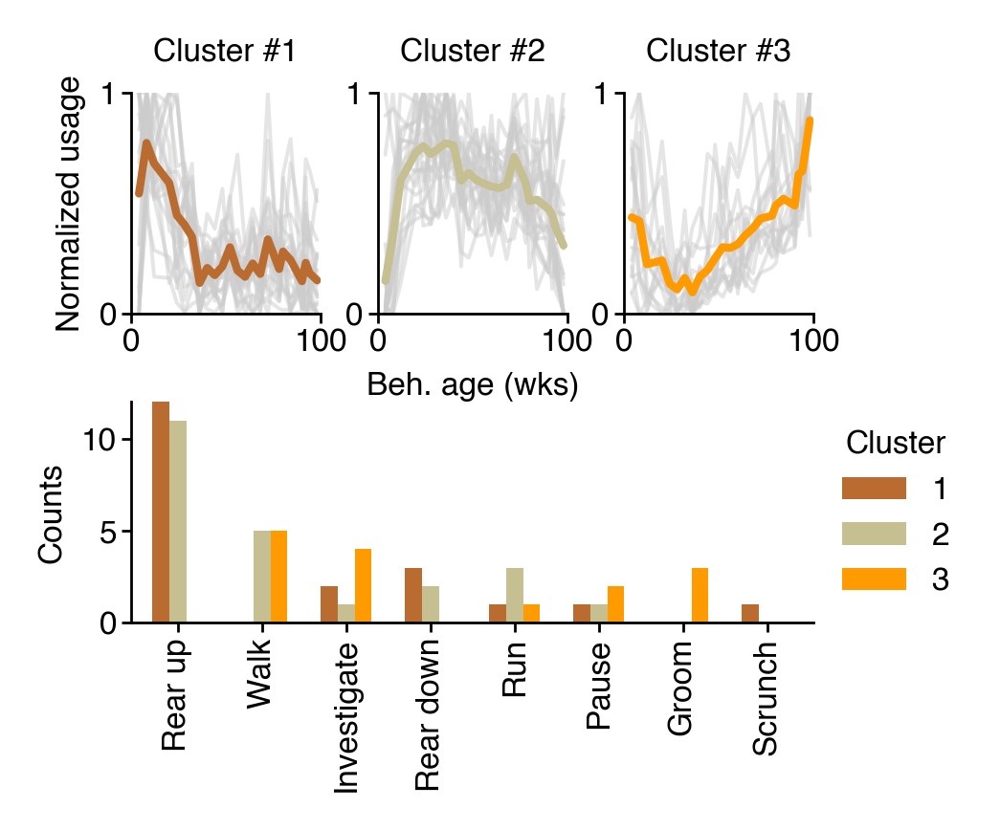

In [123]:
_classes = dict(sorted(syllable_groups[best_seed].items(), key=lambda item: item[0]))

mosaic = '''
abc
ddd
'''

fig, ax = plt.subplot_mosaic(mosaic, figsize=(2.3, 1.8), gridspec_kw={'wspace': 0.3, 'hspace': 0.4})

for _a, ((k, sylls), color) in enumerate(zip(_classes.items(), cc.glasbey_warm[11:])):
    letter = chr(_a + 97)
    a = ax[letter]
    mm_df[sylls].plot(ax=a, legend=False, color='#ccc', alpha=0.5, lw=0.7)
    a.plot(mm_df[sylls].mean(1), color=color, lw=1.5)
    a.set(title=f"Cluster #{k + 1}", xlabel="", ylim=(0, 1), yticks=(0, 1), xlim=(0, 100))
ax['a'].set(ylabel="Normalized usage")
ax['b'].set(xlabel="Beh. age (wks)")
with plt.rc_context({'axes.prop_cycle': plt.cycler(color=cc.glasbey_warm[11:])}):
    a = ax['d']
    cf_df = pd.DataFrame(class_freqs).fillna(0).rename(columns=lambda x: x+1)
    cf_df = cf_df.loc[cf_df.sum(1).sort_values(ascending=False).index]
    a = cf_df.plot(kind='bar', ax=a, width=0.6, linewidth=0)
    legend(a, title="Cluster")
    # a.legend(title="Cluster", frameon=False)
    a.set(ylabel="Counts", xlabel="", ylim=(0, cf_df.max().max()))
sns.despine()
saver(fig, "female-k-means-cluster-all-sylls-beh-age", tight_layout=False);

Clusters

0: rear up

1: rear up also

2: rear and investigate

3: dominated by walking

In [124]:
joblib.dump(syllable_groups[best_seed], '/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/female-kmeans-label-dict-beh-age.p')

['/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/female-kmeans-label-dict-beh-age.p']

## Show shuffles/controls

In [113]:
from scipy.stats import ttest_ind

In [114]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": pd.concat([sizes_col, female_sizes_col]).to_numpy(),  # models > 1
    "mice": sex_id,
}

age_sd = 0.04

hypparams = {
    "log_age": True,
    "min_age": 3,
    "max_age": 130,
    "age_sd": age_sd,
    "n_age_samples": 1000,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "scale": 400,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(sex_id),
    "lr": 0.25,
    "n_opt_iter": 1300,
}

In [115]:
n_repeats = 35

In [116]:
hyp_copy = deepcopy(hypparams)
mdl3 = masked_xval(features, hyp_copy, 5, n_repeats=n_repeats)
r2_3 = list(pluck('heldout_r2_total_v3', mdl3.values()))
print(np.mean(r2_3))
del mdl3

  0%|          | 0/35 [00:00<?, ?it/s]

0.5810454865586371


In [117]:
# plt.plot(mdl3[0]['loss'][100:])

In [118]:
# mdl3[0]['heldout_ll']

In [119]:
hyp_copy = deepcopy(hypparams)
mdl2 = masked_xval(features, hyp_copy, 2, n_repeats=n_repeats)
r2_2 = list(pluck('heldout_r2_total_v3', mdl2.values()))
print(np.mean(r2_2))
del mdl2

  0%|          | 0/35 [00:00<?, ?it/s]

0.5733825291320193


In [120]:
ttest_ind(r2_2, r2_3, alternative='less')

TtestResult(statistic=-3.8357528219470303, pvalue=0.00013825825728175755, df=68.0)

In [122]:
# mdl2[0]['heldout_ll']

In [123]:
# plt.plot(mdl2[0]['loss'][100:])

In [124]:
hyp_copy = deepcopy(hypparams)
mdl1 = masked_xval(features, hyp_copy, 1, n_repeats=n_repeats)
r2_1 = list(pluck('heldout_r2_total_v3', mdl1.values()))
print(np.mean(r2_1))
del mdl1

  0%|          | 0/35 [00:00<?, ?it/s]

0.5646654713085183


In [125]:
# mdl1[0]['heldout_ll']

In [126]:
# plt.plot(mdl1[0]['loss'][100:])

In [127]:
hyp_copy = deepcopy(hypparams)
mdl0 = masked_xval(features, hyp_copy, 0, n_repeats=n_repeats)
r2_0 = list(pluck('heldout_r2_total_v3', mdl0.values()))
print(np.mean(r2_0))
del mdl0

  0%|          | 0/35 [00:00<?, ?it/s]

0.4750240655319937


In [128]:
# mdl0[0]['heldout_ll']

In [129]:
# plt.plot(mdl0[0]['loss'][100:])

In [130]:
hyp_copy = deepcopy(hypparams)
hyp_copy['age_sd'] = 1e-6
mdl0_1 = masked_xval(features, hyp_copy, 1, n_repeats=n_repeats)
r2_0_1 = list(pluck('heldout_r2_total_v3', mdl0_1.values()))
print(np.mean(r2_0_1))
del mdl0_1

  0%|          | 0/35 [00:00<?, ?it/s]

0.10368732997860658


In [131]:
# mdl0_1[0]['heldout_ll']

In [132]:
# plt.plot(mdl0_1[0]['loss'][100:])

In [ ]:
# shuffle syllables
np.random.seed(0)
shuff_features = deepcopy(features)
hyp_copy = deepcopy(hypparams)
hyp_copy['n_opt_iter'] = 800

r2_shuff = []
for i in tqdm(range(n_repeats)):
    perm = np.array([np.random.permutation(58) for _ in range(len(syllable_counts_jax))])
    shuff = syllable_counts_jax[np.arange(len(syllable_counts_jax))[:, None], perm]
    shuff_features['counts'] = shuff
    try:
        tmp = masked_xval(shuff_features, hyp_copy, model_version=5, n_repeats=1, seed=i, disable_tqdm=True, return_loss_on_error=True)
        if len(tmp[0]) > 1:
            r2_shuff.append(tmp[0]['heldout_r2_total_v3'])
        else:
            print('Non-NaN iterations:', hyp_copy['n_opt_iter'] - np.isnan(tmp[0]['loss']).sum())
        del tmp
    except ValueError:
        continue
print(np.mean(r2_shuff))

  0%|          | 0/35 [00:00<?, ?it/s]

39440
Non-NaN iterations: 633
39440
Non-NaN iterations: 738
39440
Non-NaN iterations: 759


In [ ]:
# shuffle sexes
np.random.seed(0)

shuff_features = deepcopy(features)
hyp_copy = deepcopy(hypparams)

shuff_r2s = []
for i in tqdm(range(n_repeats)):
    shuff_features['mice'] = np.random.permutation(features['mice'].T).T
    try:
        shuff_results = masked_xval(shuff_features, hyp_copy, 5, n_repeats=1, seed=i, disable_tqdm=True)
        shuff_r2s.append(shuff_results[0]['heldout_r2_total_v3'])
    except ValueError:
        continue
print(np.mean(shuff_r2s))

In [ ]:
plt_data = {
    "Syll. shuffle": r2_shuff,
    "Sex shuffle": shuff_r2s,
    "Chron. age": r2_0_1,
    "Linear": r2_0,
    "Beh. age": r2_1,
    "Beh. age + size": r2_2,
    "Beh. age + size + sex": r2_3,
}

fig = figure(1.1, 1.3)
ax = sns.pointplot(
    data=plt_data,
    palette=["silver", "silver", "gray", "gray", "lightgreen", "limegreen", "green"],
    linewidth=0.6, errorbar=('sd', 2), ms=3
)
ax.set(
    xlabel="BAMBI model type",
    ylabel="Heldout R2",
    ylim=(-0.3, 0.7),
)
plt.xticks(rotation=90)
sns.despine()
saver(fig, "ontogeny-males-females-heldout-r2-model-comparison");

In [ ]:
plt_data = {
    "Beh. age": r2_1,
    "Beh. age + size": r2_2,
    "Beh. age + size + sex": r2_3,
}

fig = figure(0.4, 1.3)
ax = sns.pointplot(
    data=plt_data,
    palette=["lightgreen", "limegreen", "green"],
    linewidth=0.6, errorbar=('sd', 2), ms=3
)
ax.set(
    xlabel="BAMBI model type",
    ylabel="Heldout R2",
)
plt.xticks(rotation=90)
sns.despine()
saver(fig, "ontogeny-males-females-heldout-r2-model-comparison-just-bambi");

## Relative contributions version 2

In [15]:
import dataclasses

In [16]:
mdl_params = mdl['params']
mdl_components = mdl['init_components']
bias_scale = np.exp(mdl_params['development_weights'] @ mdl_components.bases['development'])
list(mdl_params)

['bio_basis_weights', 'development_weights', 'individual_biases', 'size_slope']

In [17]:
bias_scale.shape

(1, 1000)

In [18]:
size_effect = np.abs(mdl_params['size_slope'].squeeze())

In [19]:
size_ranking = np.argsort(size_effect)[::-1]

In [20]:
size_ranking

array([28, 30, 17, 36, 26, 14,  2, 42, 25, 49, 45, 16,  8, 18, 10, 47, 32,
       48, 50, 15,  9, 39,  0, 33, 19, 40, 21, 38, 53, 56,  5, 43, 20,  7,
       41, 13, 31, 22, 24, 51, 46, 27,  1,  4, 37, 57, 52, 35, 12, 23,  3,
       55, 54, 29,  6, 11, 34, 44])

In [21]:
mdl_params['bio_basis_weights'].shape

(58, 4)

In [22]:
mdl_components.bases['bio'].shape

(4, 1000)

In [23]:
splines = mdl_params['bio_basis_weights'] @ mdl_components.bases['bio']

In [24]:
[x.name for x in dataclasses.fields(mdl_components)]

['bases',
 'age_samples',
 'true_age',
 'age_normalizer',
 'age_unnormalizer',
 'init',
 'params',
 'model_version']

In [25]:
splines

array([[-1.03805518, -1.03962901, -1.04118643, ..., -0.5699048 ,
        -0.57353586, -0.57718748],
       [ 0.60463023,  0.60251255,  0.6004216 , ..., -0.80137998,
        -0.81473473, -0.82813883],
       [-2.03069687, -2.02578515, -2.02086685, ..., -0.47792698,
        -0.48638376, -0.49487397],
       ...,
       [ 0.65134853,  0.6468868 ,  0.64245006, ..., -0.24883932,
        -0.25509945, -0.26138824],
       [-3.11112976, -3.10288827, -3.09465823, ..., -2.41558634,
        -2.42429731, -2.43303084],
       [-0.47107732, -0.47624236, -0.48136442, ..., -1.85982949,
        -1.87514777, -1.89052951]])

In [26]:
def get_component_diffs(comp, age1, age2):
    x = np.interp(mdl_components.age_normalizer(np.array([age1, age2])), mdl_components.age_samples, comp)
    return x[1] - x[0], age2 - age1

def get_spline_diffs(splines, age1, age2, syllable):
    '''returns the difference in spline values and the difference in ages'''
    return get_component_diffs(splines[syllable], age1, age2)
    
def get_component_avg(comp, age1, age2, syllable):
    x = np.interp(mdl_components.age_normalizer(np.arange(age1, age2)), mdl_components.age_samples, comp[syllable])
    return np.mean(x), age2 - age1

In [27]:
get_spline_diffs(splines, 4, 20, 0)

(0.5724559820012357, 16)

In [28]:
get_spline_diffs(splines, 20, 50, 0)

(0.3311261836279288, 30)

In [29]:
get_spline_diffs(splines, 50, 100, 0)

(-0.1602033927307139, 50)

In [30]:
splines.shape

(58, 1000)

In [31]:
true_age = mdl_components.age_unnormalizer(mdl_components.age_samples)

In [32]:
bio_deriv = np.diff(splines, axis=1)
exp_bio_deriv = np.diff(np.exp(splines), axis=1)
# age_diff = np.diff(true_age)
# we want to look at the derivative in the space of the model (i.e., log-space)
age_diff = np.diff(mdl_components.age_samples)
bio_deriv = bio_deriv / age_diff[None]

In [33]:
def get_bio_deriv(age, syllable):
    '''age can be a vector or integer.
    Syllable should be an int from 0-58'''
    return np.interp(age, true_age[:-1], bio_deriv[syllable])

In [34]:
def get_exp_bio_deriv(age, syllable):
    '''age can be a vector or integer.
    Syllable should be an int from 0-58'''
    return np.interp(age, true_age[:-1], exp_bio_deriv[syllable])

In [35]:
sex_bias = np.array(raise_dim(mdl_params['individual_biases'], axis=1))

In [36]:
# sex_bias_effect = np.abs(np.diff(sex_bias, axis=1).squeeze())
sex_bias_effect = np.mean(np.abs(sex_bias), axis=1).squeeze()

In [37]:
sex_bias_effect_w_scaling = (bias_scale * sex_bias_effect[:, None])

In [38]:
get_component_avg(sex_bias_effect_w_scaling, 4, 20, 0)

(0.0439834633324267, 16)

In [39]:
get_component_avg(sex_bias_effect_w_scaling, 20, 50, 0)

(0.11916675970941108, 30)

In [40]:
get_component_avg(sex_bias_effect_w_scaling, 50, 100, 0)

(0.10268448653470917, 50)

In [41]:
# syllable effect magnitudes?
sems = []
for syllable in range(df.shape[1]):
    # for age_grp, ages in dict(young=(4, 20), mid=(20, 50), old=(50, 100)).items():
    for age_grp, ages in dict(young=(4, 36), mid=(36, 68), old=(68, 100)).items():
        comp_diff, age_diff = get_spline_diffs(splines, *ages, syllable)
        _sex_mag, _ = get_component_avg(sex_bias_effect_w_scaling, *ages, syllable)
        _size_mag = size_effect[syllable]
        sems.append({
            'age_group': age_grp,
            'syllable': keep_syllables[syllable],
            'syllable_rank': syllable,
            'Beh. age': np.abs(comp_diff),
            'age_diff': age_diff,
            'Sex': np.abs(_sex_mag),
            'Size': np.abs(_size_mag),
        })
sems = pd.DataFrame(sems)

In [42]:
pplt = sems.melt(id_vars=['age_group', 'syllable_rank', 'syllable', 'age_diff'], var_name='component')

In [43]:
pplt

,age_group,syllable_rank,syllable,age_diff,component,value
0,young,0,0,32,Beh. age,0.833253
1,mid,0,0,32,Beh. age,0.059618
2,old,0,0,32,Beh. age,0.149492
3,young,1,2,32,Beh. age,0.866846
4,mid,1,2,32,Beh. age,0.567396
...,...,...,...,...,...,...
517,mid,56,97,32,Size,0.065390
518,old,56,97,32,Size,0.065390
519,young,57,98,32,Size,0.040972
520,mid,57,98,32,Size,0.040972


/tmp/ipykernel_30093/2916858530.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set(


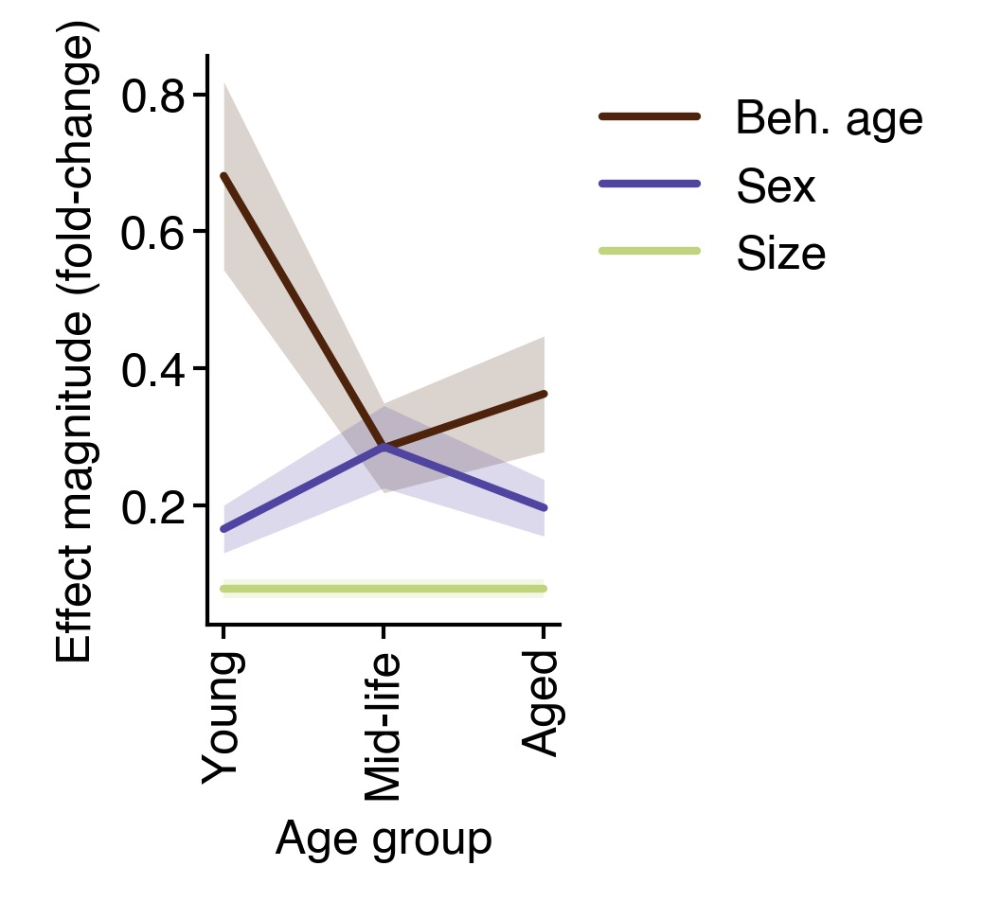

In [44]:
start = 93
fig = figure(0.8, 1.3)
ax = sns.lineplot(
    data=pplt,
    x="age_group",
    y="value",
    hue="component",
    palette=reversed(cc.glasbey[start : start + 3]),
    err_kws=dict(lw=0),
    errorbar=("se", 2),
)
ax.set(
    ylabel="Effect magnitude (fold-change)",
    xlabel="Age group",
    xticklabels=["Young", "Mid-life", "Aged"],
)
ax.tick_params(axis="x", rotation=90)
legend(ax)
sns.despine()
saver(fig, "all-syllable-effect-magnitude");

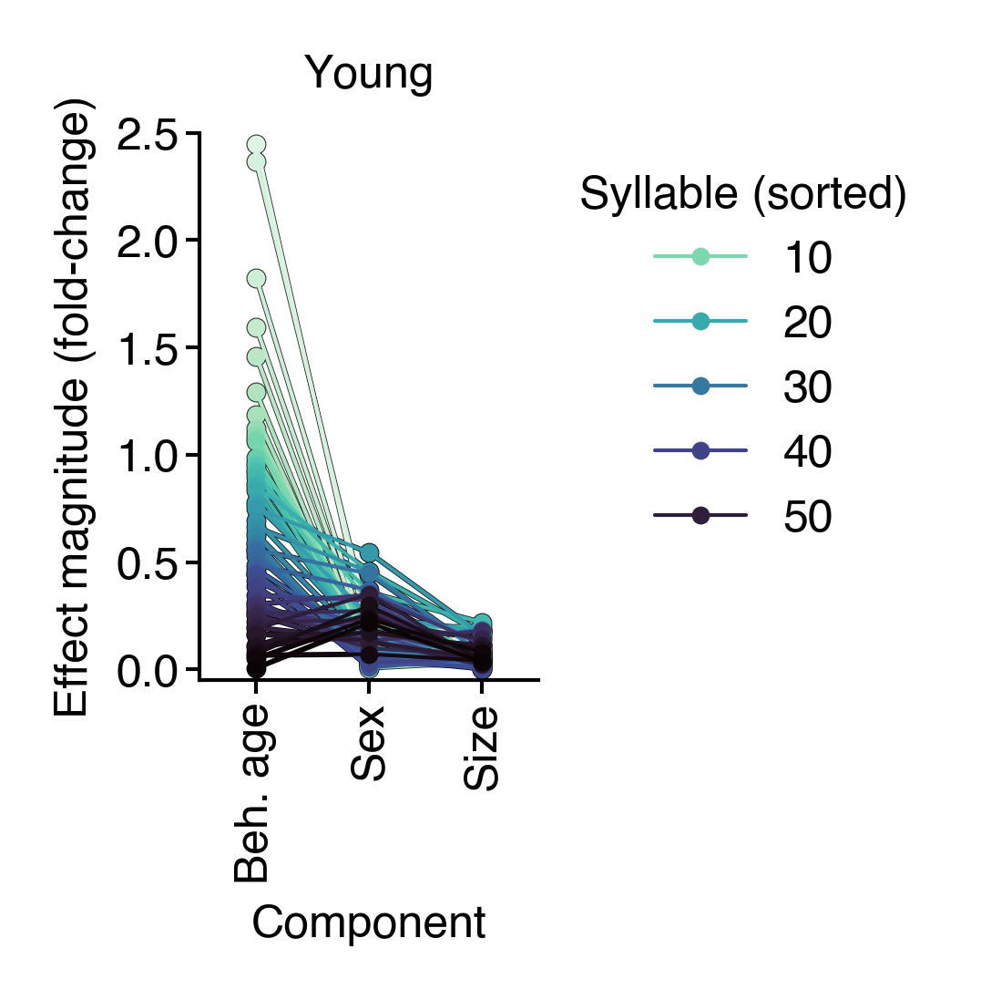

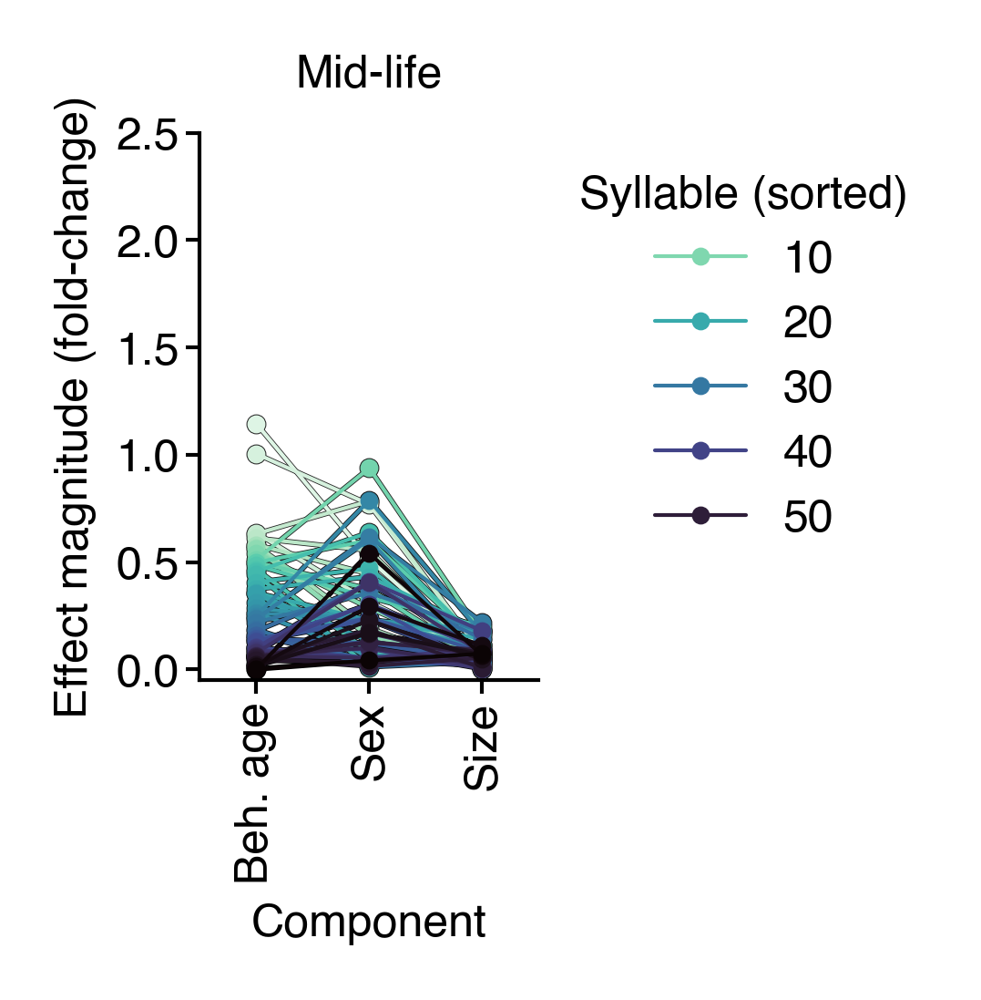

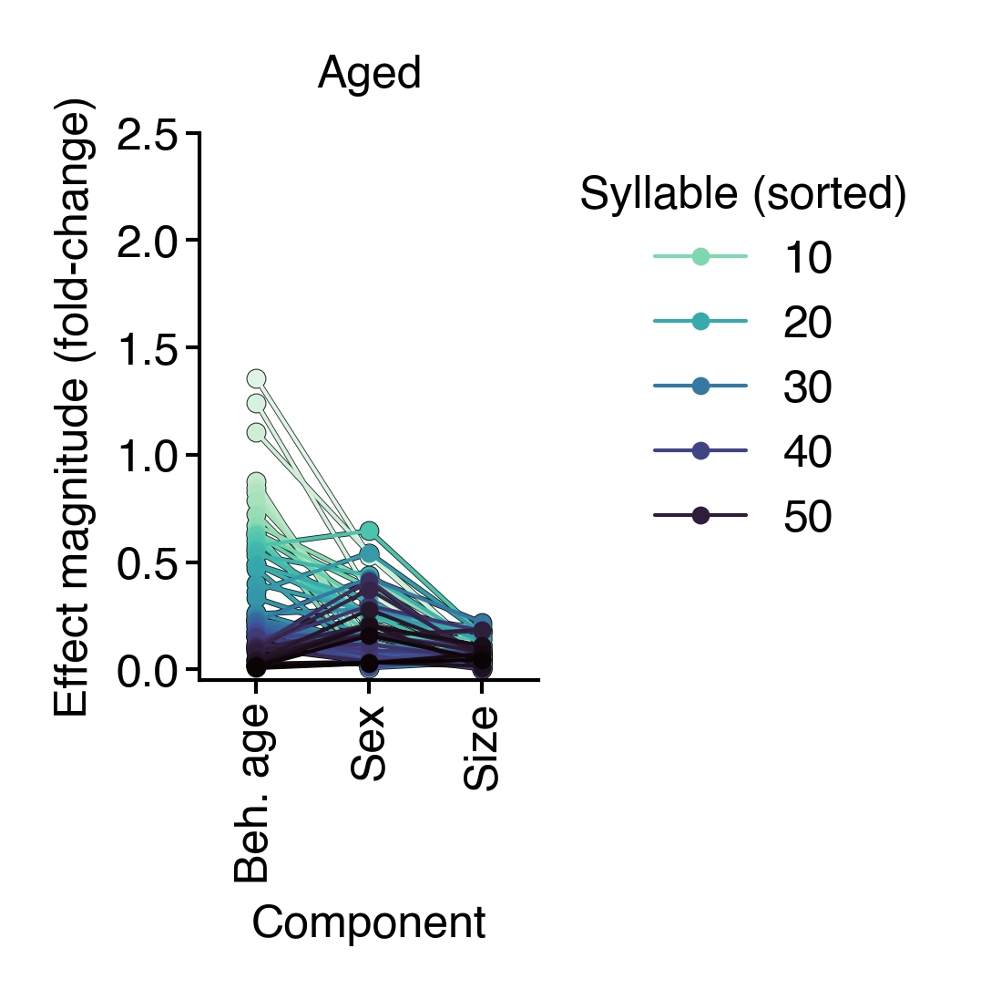

In [45]:
title_map = {
    "young": "Young",
    "mid": "Mid-life",
    "old": "Aged",
}
for _age_group in ("young", "mid", "old"):
    plt_df = pplt.query('age_group == @_age_group').copy()
    syllable_rank_map = plt_df.query('component == "Beh. age"').set_index('syllable')['value'].rank(ascending=False)
    plt_df['syllable_rank'] = plt_df['syllable'].map(syllable_rank_map)

    fig = figure(0.8, 1.3)
    ax = sns.pointplot(
        data=plt_df,
        x="component",
        y="value",
        hue="syllable_rank",
        palette="dark:k",
        legend=False,
        markersize=2.1,
        linewidth=0.7
    )
    ax = sns.pointplot(
        data=plt_df,
        x="component",
        y="value",
        hue="syllable_rank",
        palette="mako_r",
        legend=True,
        markersize=2,
        linewidth=0.5
    )
    ax.set(ylabel="Effect magnitude (fold-change)", xlabel="Component", title=title_map[_age_group], ylim=(-0.05, 2.5))
    ax.tick_params(axis='x', rotation=90)
    legend(ax, title="Syllable (sorted)")
    sns.despine()
    saver(fig, f'{_age_group}-syllable-effect-magnitude');

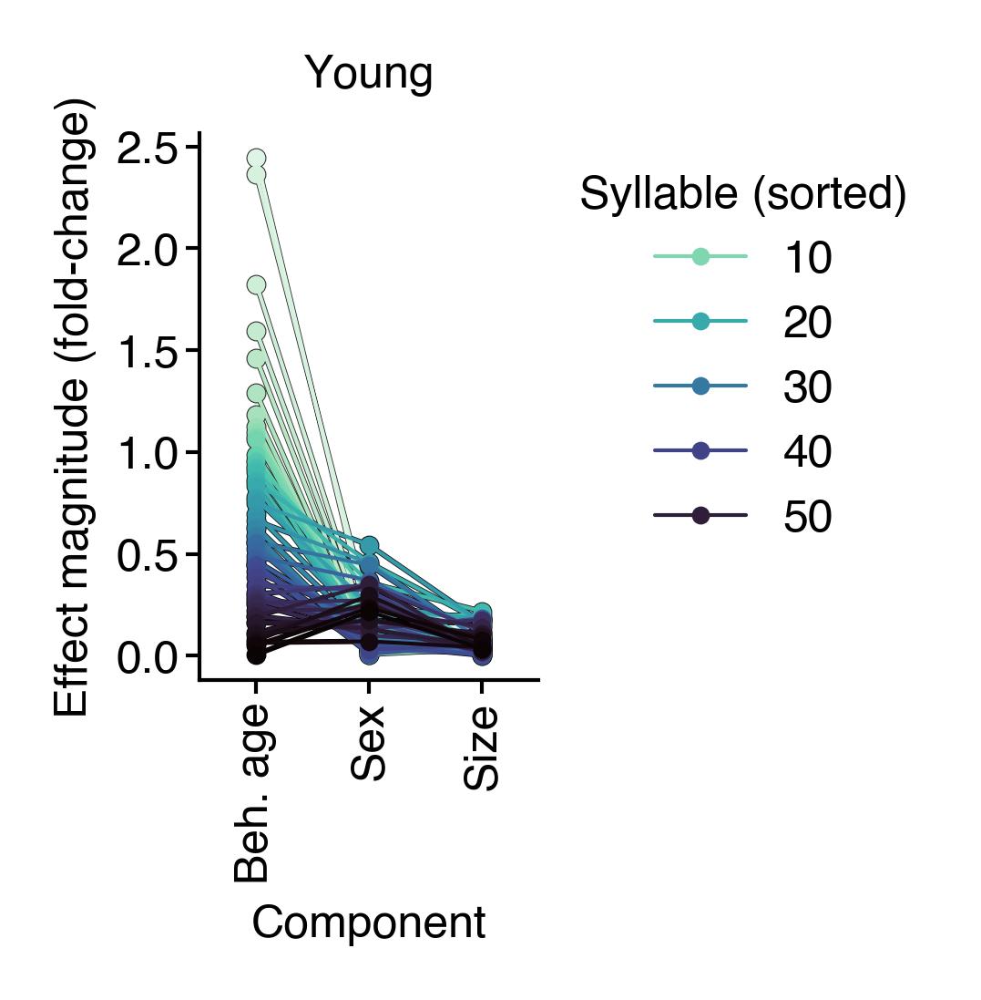

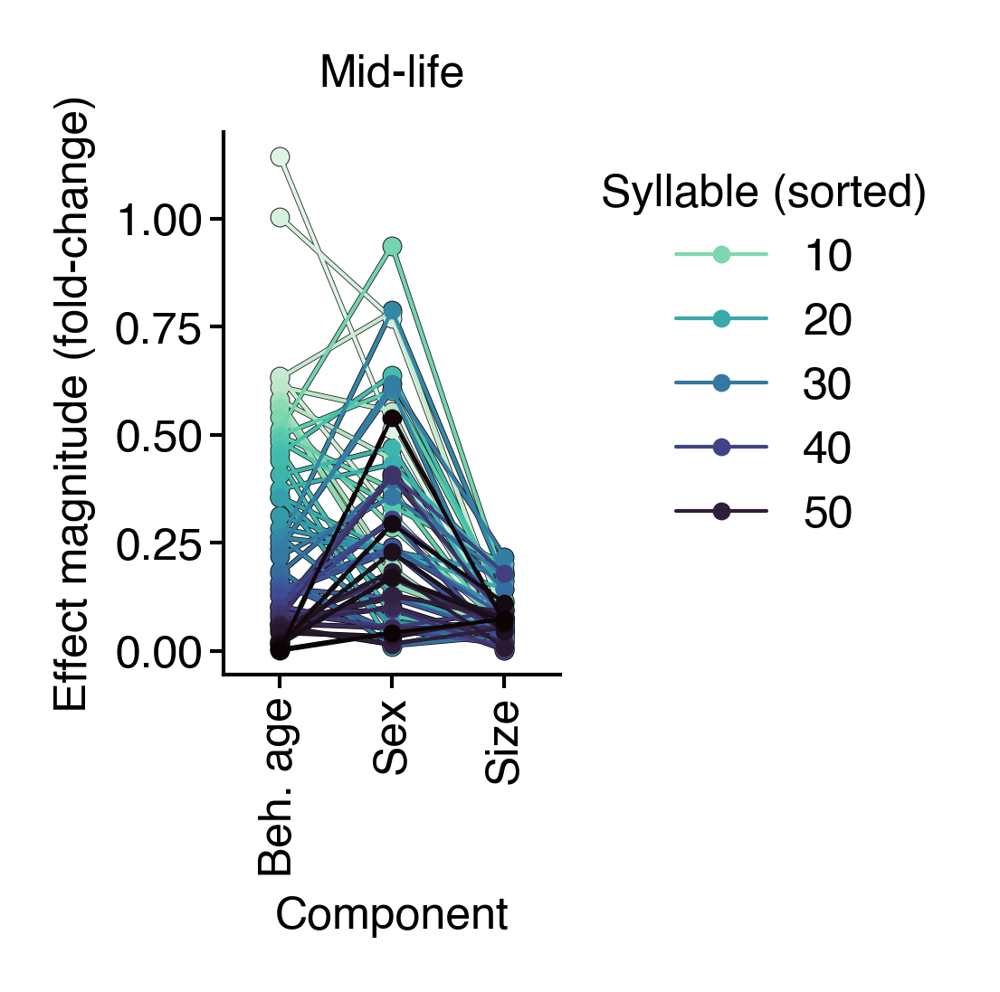

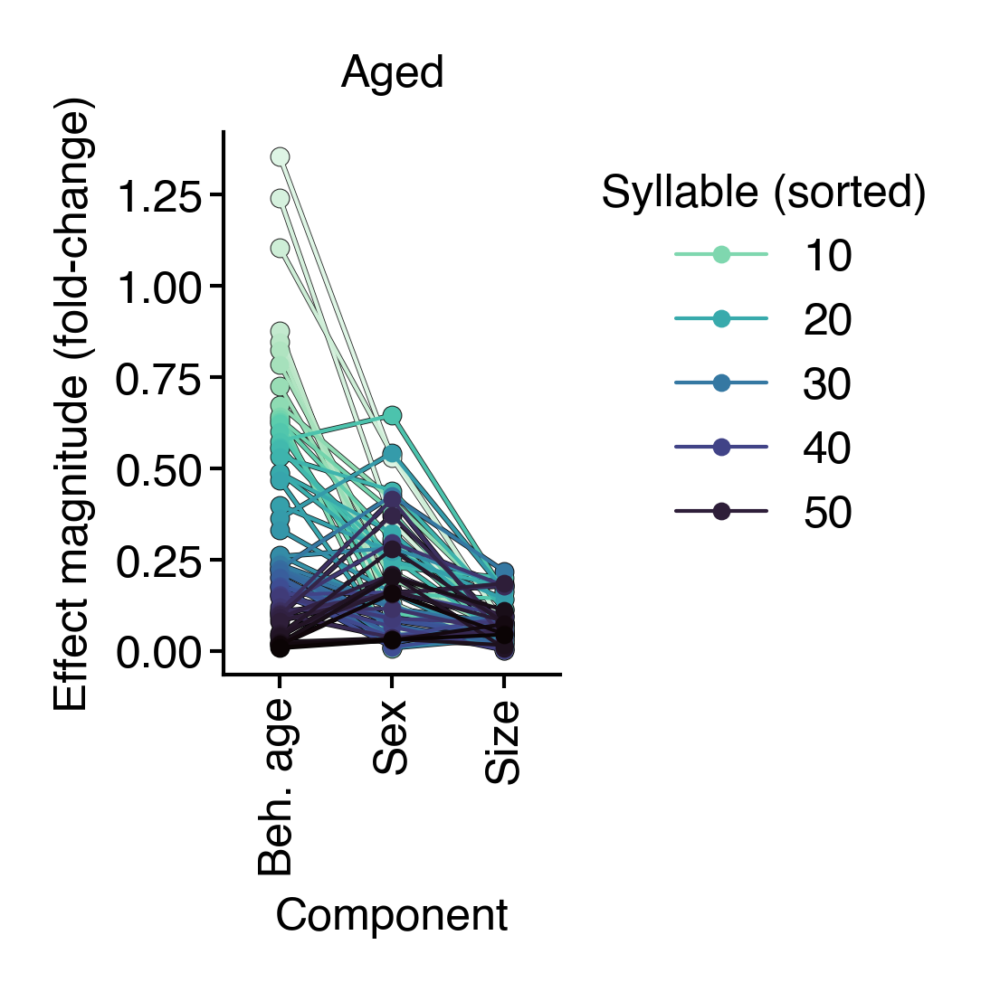

In [46]:
title_map = {
    "young": "Young",
    "mid": "Mid-life",
    "old": "Aged",
}
for _age_group in ("young", "mid", "old"):
    plt_df = pplt.query('age_group == @_age_group').copy()
    syllable_rank_map = plt_df.query('component == "Beh. age"').set_index('syllable')['value'].rank(ascending=False)
    plt_df['syllable_rank'] = plt_df['syllable'].map(syllable_rank_map)

    fig = figure(0.8, 1.3)
    ax = sns.pointplot(
        data=plt_df,
        x="component",
        y="value",
        hue="syllable_rank",
        palette="dark:k",
        legend=False,
        markersize=2.1,
        linewidth=0.7
    )
    ax = sns.pointplot(
        data=plt_df,
        x="component",
        y="value",
        hue="syllable_rank",
        palette="mako_r",
        legend=True,
        markersize=2,
        linewidth=0.5
    )
    ax.set(ylabel="Effect magnitude (fold-change)", xlabel="Component", title=title_map[_age_group])
    ax.tick_params(axis='x', rotation=90)
    legend(ax, title="Syllable (sorted)")
    sns.despine()
    saver(fig, f'{_age_group}-syllable-effect-magnitude-indep-scale');

/tmp/ipykernel_30093/2602123389.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set(ylabel="Effect magnitude (fold-change)", xlabel="Component", title=_age_group, xticklabels=["Young", "Mid-life", "Aged"])
/tmp/ipykernel_30093/2602123389.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set(ylabel="Effect magnitude (fold-change)", xlabel="Component", title=_age_group, xticklabels=["Young", "Mid-life", "Aged"])
/tmp/ipykernel_30093/2602123389.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set(ylabel="Effect magnitude (fold-change)", xlabel="Component", title=_age_group, xticklabels=["Young", "Mid-life", "Aged"])


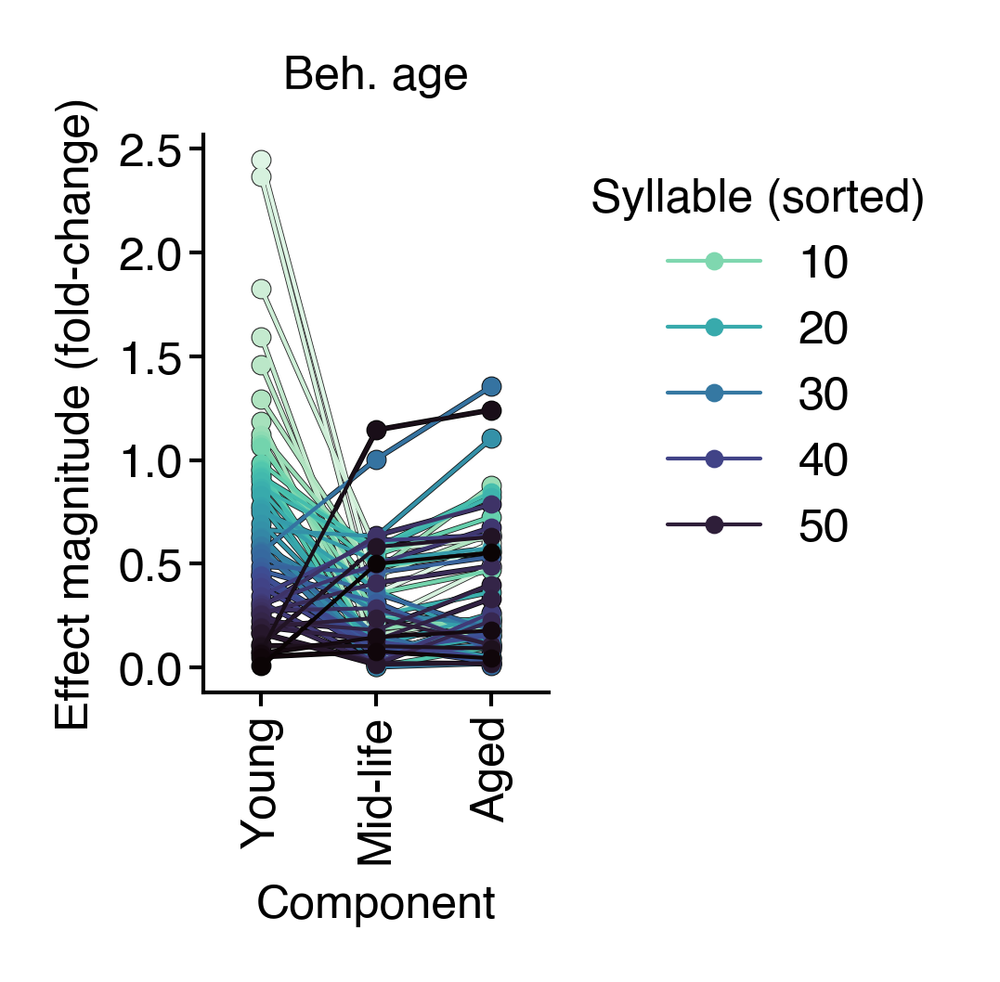

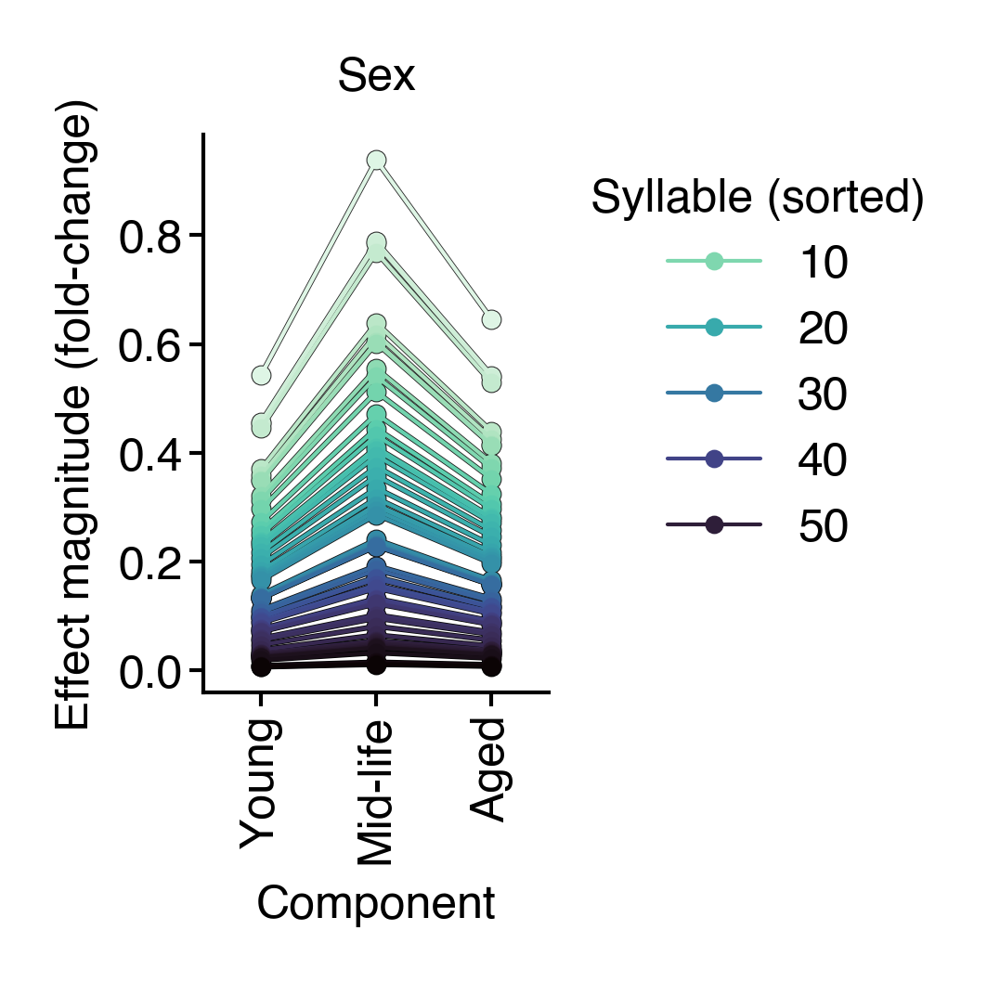

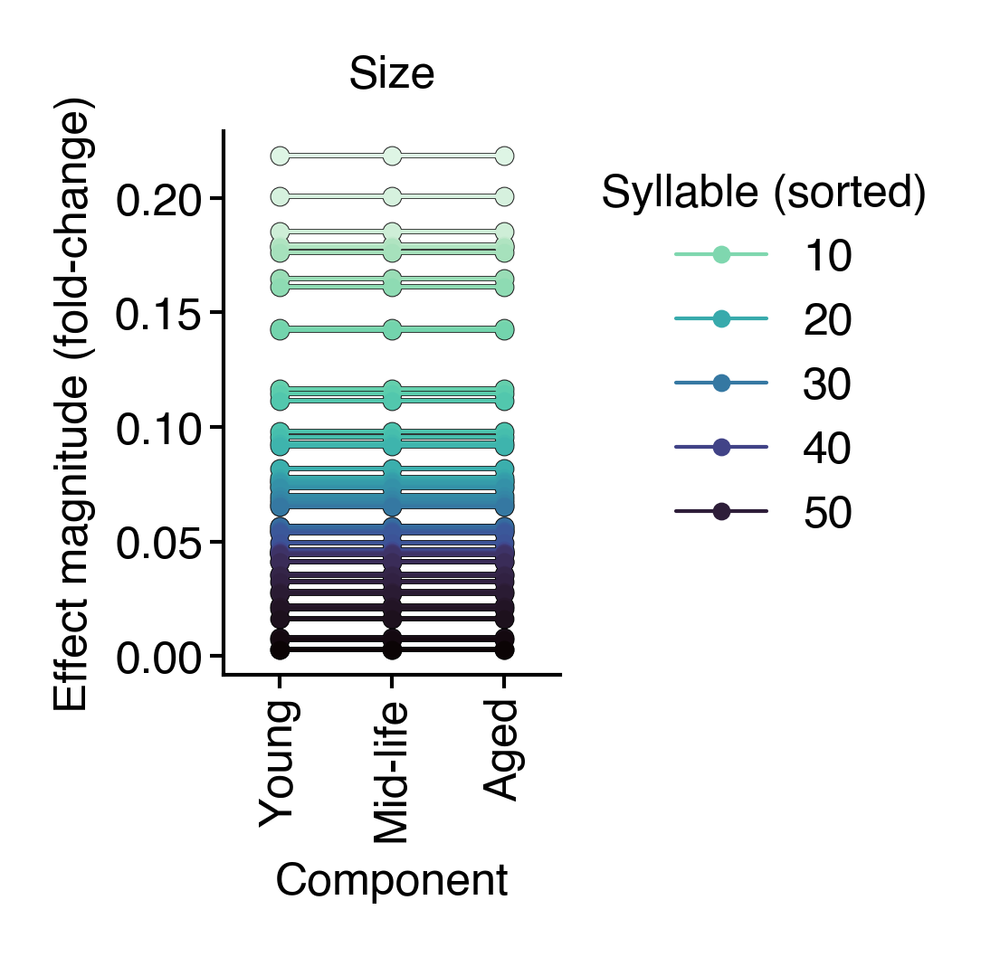

In [47]:
for _age_group in ("Beh. age", "Sex", "Size"):
    plt_df = pplt.query('component == @_age_group').copy()
    syllable_rank_map = pplt.query('component == @_age_group & age_group == "young"').set_index('syllable')['value'].rank(ascending=False)
    plt_df['syllable_rank'] = plt_df['syllable'].map(syllable_rank_map)

    fig = figure(0.8, 1.3)
    ax = sns.pointplot(
        data=plt_df,
        x="age_group",
        y="value",
        hue="syllable_rank",
        palette="dark:k",
        legend=False,
        markersize=2.1,
        linewidth=0.7
    )
    ax = sns.pointplot(
        data=plt_df,
        x="age_group",
        y="value",
        hue="syllable_rank",
        palette="mako_r",
        legend=True,
        markersize=2,
        linewidth=0.5
    )
    ax.set(ylabel="Effect magnitude (fold-change)", xlabel="Component", title=_age_group, xticklabels=["Young", "Mid-life", "Aged"])
    ax.tick_params(axis='x', rotation=90)
    legend(ax, title="Syllable (sorted)")
    sns.despine()
    saver(fig, f'{_age_group}-syllable-effect-magnitude-per-component-indep-scale');

#### Get syllable rankings for sex and size

In [53]:
per_component_rank = pplt.groupby(['component', 'age_group'])['value'].rank(ascending=True)

In [54]:
pplt['comp_rank'] = per_component_rank

In [55]:
mdl_prediction_df = pplt.set_index(['age_group', 'component', 'syllable'])

In [56]:
example = mdl_prediction_df.loc['young']

In [58]:
keep_ranks = example[example['comp_rank'] < 5]

In [72]:
both_ranks = example.query('component != "Beh. age"').groupby('syllable')['comp_rank'].mean()
keep_ranked_sylls = both_ranks.sort_values().head(5)

In [71]:
np.sort(mutual_info_regression(df, df.index.get_level_values('age')))

array([0.        , 0.        , 0.0048181 , 0.01559493, 0.02008472,
       0.02339387, 0.03449538, 0.03573544, 0.04097245, 0.04499212,
       0.04814202, 0.04984485, 0.05168758, 0.05337908, 0.06700085,
       0.06854133, 0.07081244, 0.07107965, 0.07614915, 0.07651343,
       0.07699693, 0.08021591, 0.08326329, 0.08405321, 0.08629939,
       0.08663417, 0.09112732, 0.09363529, 0.0948097 , 0.09484382,
       0.09544275, 0.09633409, 0.09922361, 0.10236512, 0.10319464,
       0.11269226, 0.11382784, 0.11623722, 0.12297506, 0.1234855 ,
       0.12409927, 0.12557261, 0.1286958 , 0.13077498, 0.13207568,
       0.13463342, 0.14928848, 0.15517816, 0.15994938, 0.1626188 ,
       0.1675171 , 0.16978643, 0.18473469, 0.19068007, 0.20179691,
       0.23412615, 0.32701104, 0.3316992 ])

In [73]:
mutual_info_regression(df[keep_ranked_sylls.index], df.index.get_level_values('age'))

array([0.16414388, 0.13218647, 0.16743882, 0.03371322, 0.24788199])

In [77]:
mutual_info_regression(df[keep_ranked_sylls.index], mdl['bio_ages'])

array([0.22950894, 0.12830122, 0.10634671, 0.06628599, 0.28044575])

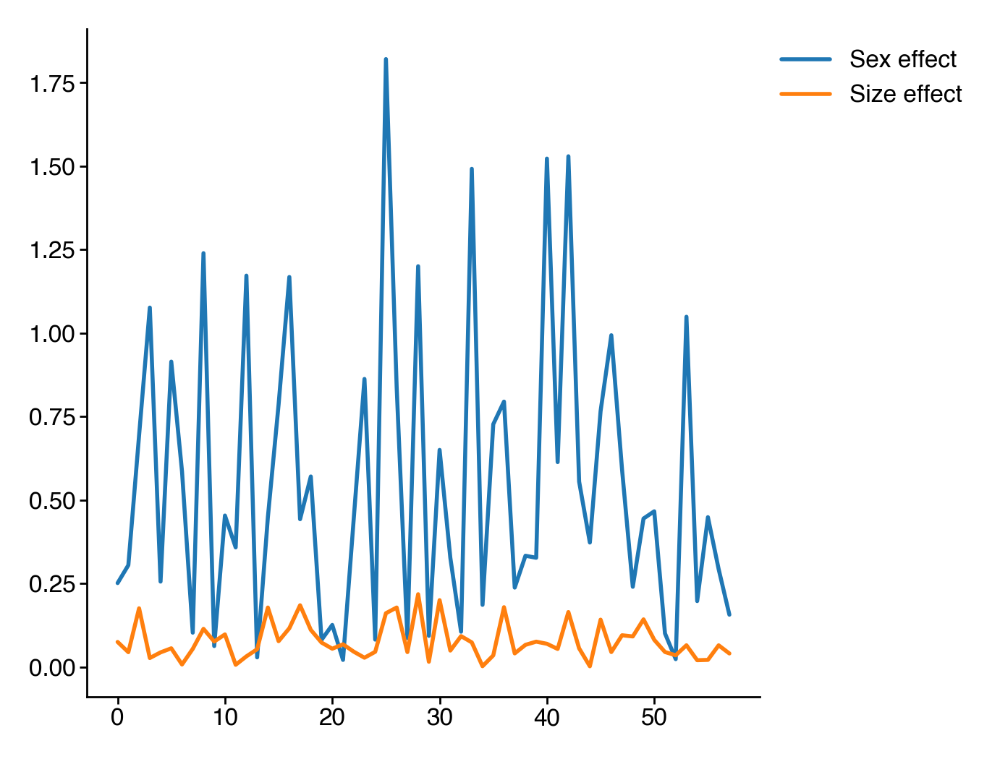

In [136]:
plt.plot(sex_bias_effect, label="Sex effect")
plt.plot(size_effect, label="Size effect")
sns.despine()
legend()

In [35]:
syll_effects = []
for i in range(len(bio_deriv)):
    syll_effects.append(np.abs(get_bio_deriv(true_age[:-1], i)))
syll_effects = np.array(syll_effects)

In [277]:
exp_syll_effects = []
for i in range(len(bio_deriv)):
    exp_syll_effects.append(np.abs(get_exp_bio_deriv(true_age[:-1], i)))
exp_syll_effects = np.array(exp_syll_effects)

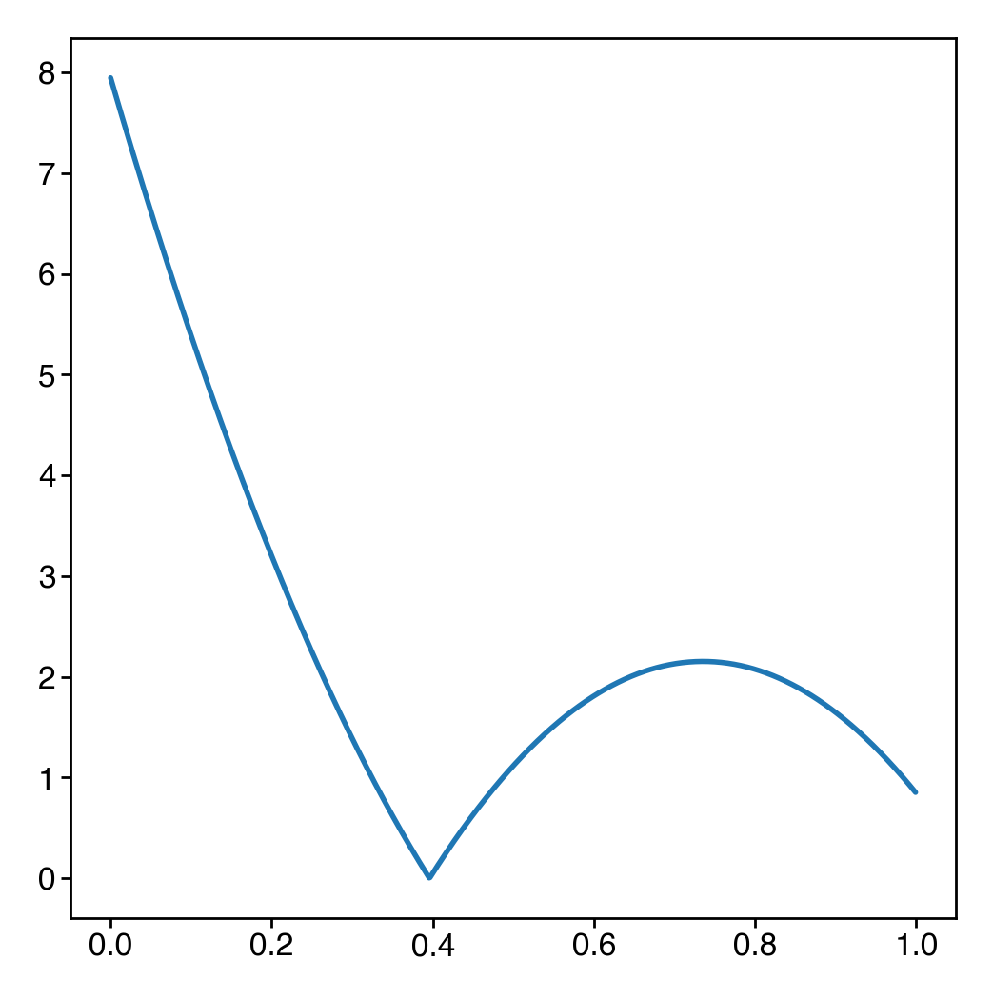

In [38]:
plt.plot(mdl_components.age_samples[:-1], syll_effects[4])

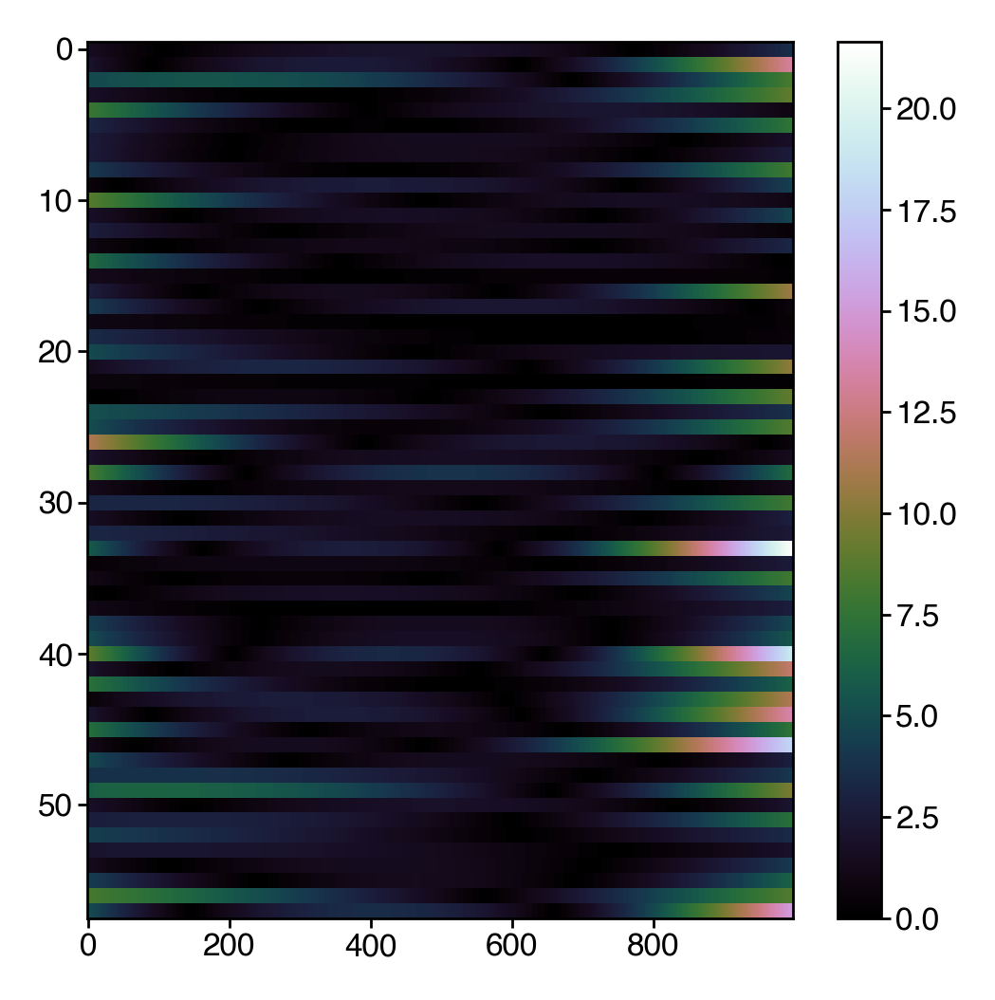

In [40]:
plt.imshow(syll_effects, cmap='cubehelix', aspect='auto', interpolation='none', vmin=0)
plt.colorbar()

In [260]:
age_ranking = np.argsort(syll_effects[:, :900].mean(1))[::-1]

# try normalizing for syllable counts
# age_ranking = np.argsort(syll_effects.mean(1) / np.quantile(syllable_counts_jax, 0.95, axis=0))[::-1]
age_ranking

array([49, 56,  2, 33, 40, 26, 46, 57, 28, 21, 10,  4, 44, 30, 43, 24, 48,
        1, 51, 25, 42, 14, 52, 41, 45, 16, 20,  8, 17,  3, 23,  9, 32, 39,
        5, 55, 53, 35, 47, 38,  0, 36, 12, 50, 11, 27,  6, 31, 54,  7, 19,
       29, 13, 34, 37, 15, 18, 22])

In [278]:
syll_effect_mag = syll_effects[:, :900].mean(1)
exp_syll_effect_mag = exp_syll_effects[:, :900].mean(1)
# syll_effect_mag = syll_effects.mean(1) / np.quantile(syllable_counts_jax, 0.95, axis=0)

In [262]:
_avgs = x.groupby(['type', 'syllable']).mean()

In [263]:
_r2s = _avgs.loc['age']

In [264]:
idx = np.argsort(_r2s['r2'].to_numpy())[::-1]

In [265]:
pd_idx_sort = _r2s['r2'].sort_values(ascending=False).index

In [266]:
syllable_counts_jax.shape

(680, 58)

In [267]:
pd_idx_sort[:5]

Index([46, 56, 33, 40, 49], dtype='int64', name='syllable')

In [268]:
syllable_counts_jax[np.arange(len(syllable_counts_jax))[:, None], np.array(pd_idx_sort[:5])].mean(0)

Array([47.102943, 10.357353, 32.005882, 80.875   , 32.530884], dtype=float32)

In [269]:
np.quantile(syllable_counts_jax[np.arange(len(syllable_counts_jax))[:, None], np.array(pd_idx_sort[:5])], (0.05, 0.5, 0.95), axis=0)

array([[  5.  ,   0.  ,   3.  ,   5.  ,   3.  ],
       [ 31.  ,   7.  ,  19.  ,  67.  ,  29.  ],
       [141.05,  33.  , 107.1 , 207.05,  78.05]])

In [270]:
np.sort(np.quantile(syllable_counts_jax, 0.95, axis=0))[::-1]

array([388.  , 292.05, 234.05, 212.05, 207.05, 200.  , 198.05, 192.  ,
       188.  , 175.05, 163.  , 162.  , 152.  , 141.05, 141.05, 140.05,
       131.05, 127.05, 125.  , 117.05, 108.05, 107.1 , 105.  , 102.  ,
        95.  ,  94.  ,  93.05,  86.05,  78.05,  74.  ,  62.  ,  58.  ,
        57.  ,  53.  ,  52.  ,  52.  ,  48.05,  46.  ,  45.  ,  44.05,
        43.  ,  42.05,  42.  ,  38.  ,  34.  ,  33.05,  33.  ,  32.05,
        32.  ,  31.  ,  31.  ,  30.  ,  28.05,  28.  ,  28.  ,  24.05,
        24.  ,  22.  ])

In [272]:
syll_effect_mag.shape

(58,)

ValueError: x and y must be the same size

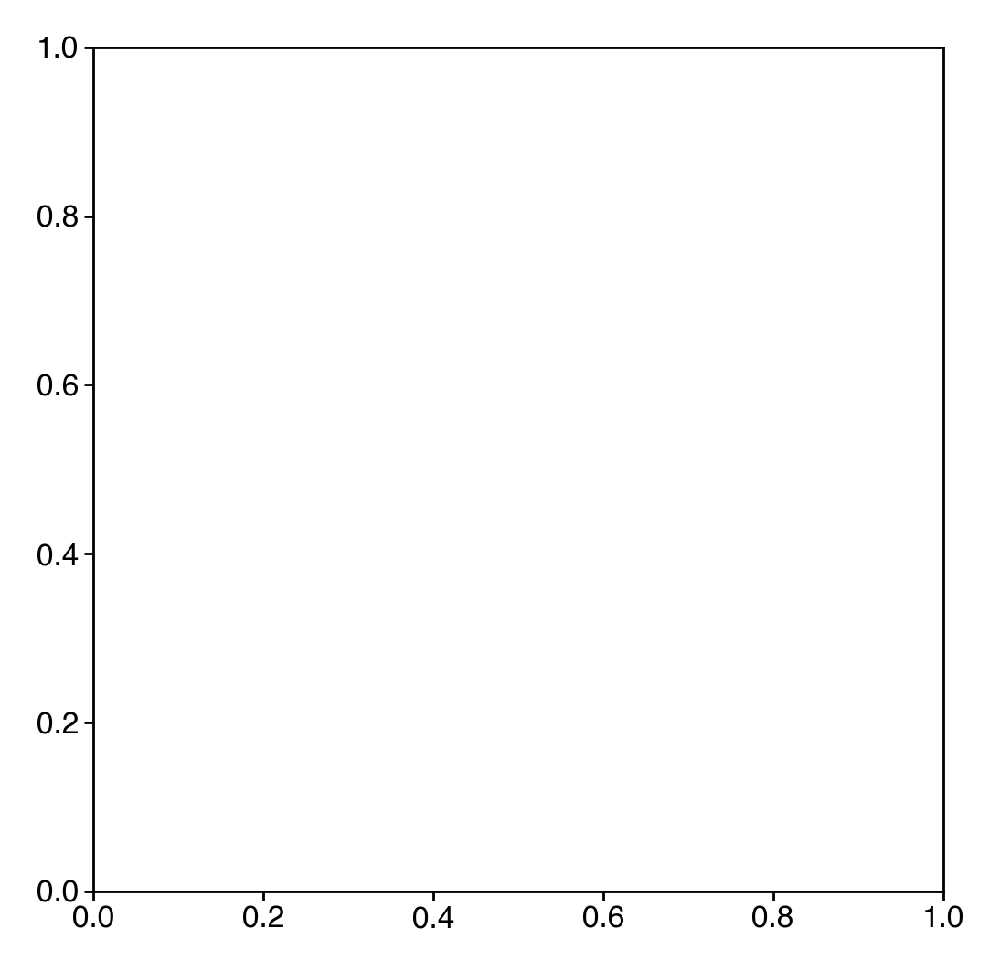

In [271]:
plt.scatter(syll_effect_mag, _r2s)

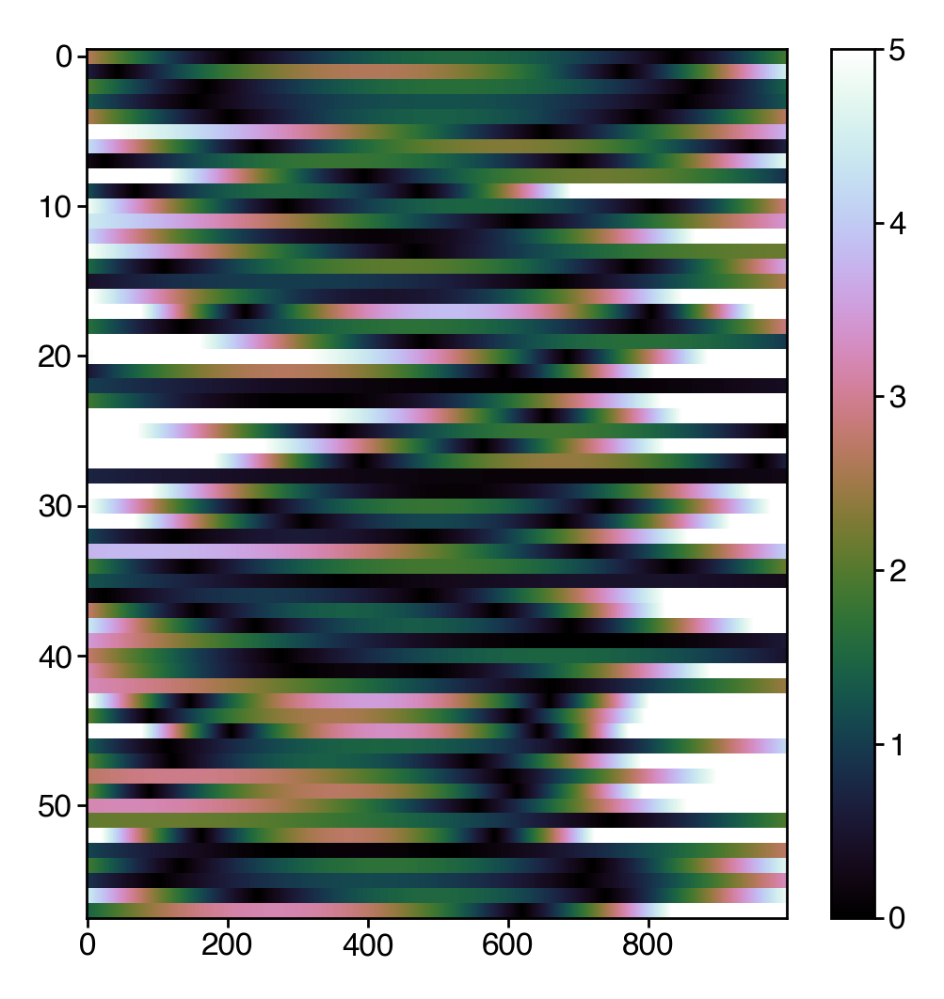

In [101]:
plt.imshow(syll_effects[idx], cmap='cubehelix', aspect='auto', interpolation='none', vmin=0, vmax=5)
plt.colorbar()

In [66]:
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression

In [203]:
sex_mi = mutual_info_classif(syllable_counts_jax, np.argmax(features['mice'], axis=0))

In [208]:
size_mi = mutual_info_regression(syllable_counts_jax, features['sizes'])

In [212]:
age_mi = mutual_info_regression(syllable_counts_jax, features['ages'])

In [214]:
bio_age_mi = mutual_info_regression(syllable_counts_jax, mdl['bio_ages'])

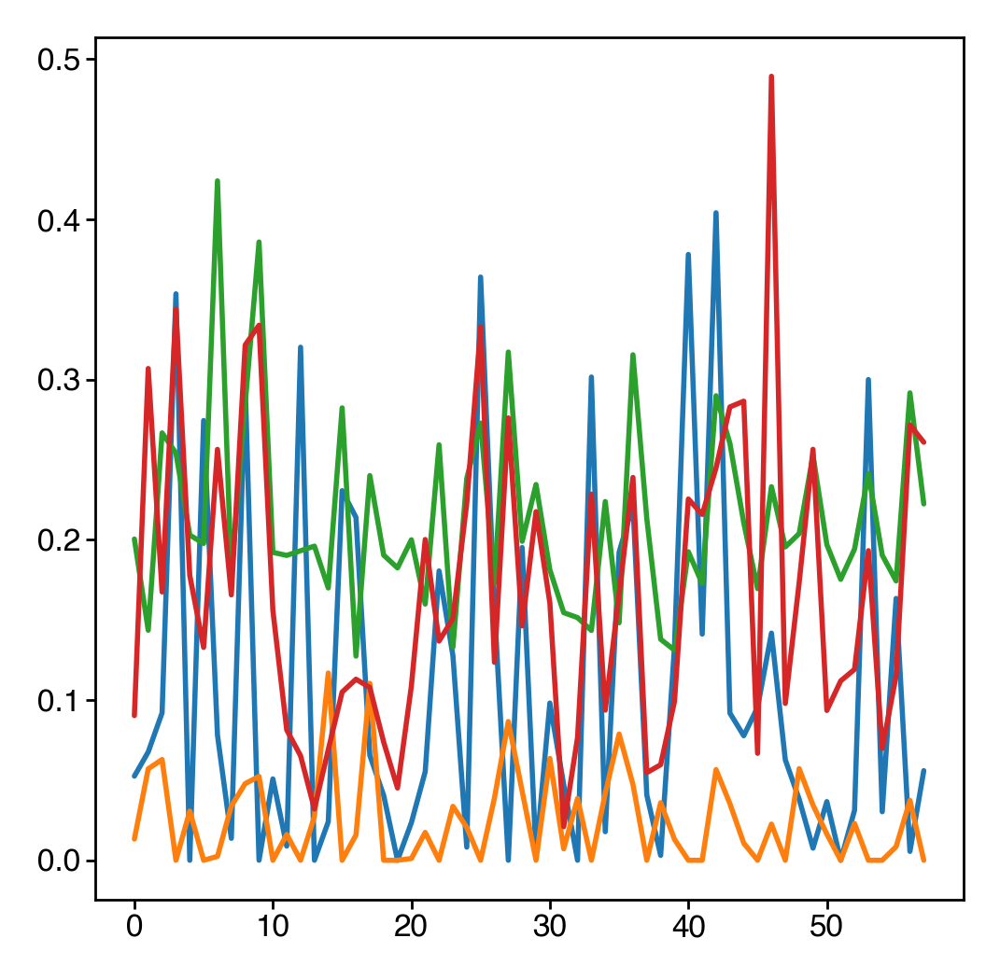

In [215]:
plt.plot(sex_mi)
plt.plot(size_mi)
plt.plot(age_mi)
plt.plot(bio_age_mi)

In [235]:
male_age_mi = mutual_info_regression(syllable_counts_jax[:333], features['ages'][:333])
female_age_mi = mutual_info_regression(syllable_counts_jax[333:], features['ages'][333:])

<Axes: title={'center': 'Chron. age'}, xlabel='male mi', ylabel='female mi'>

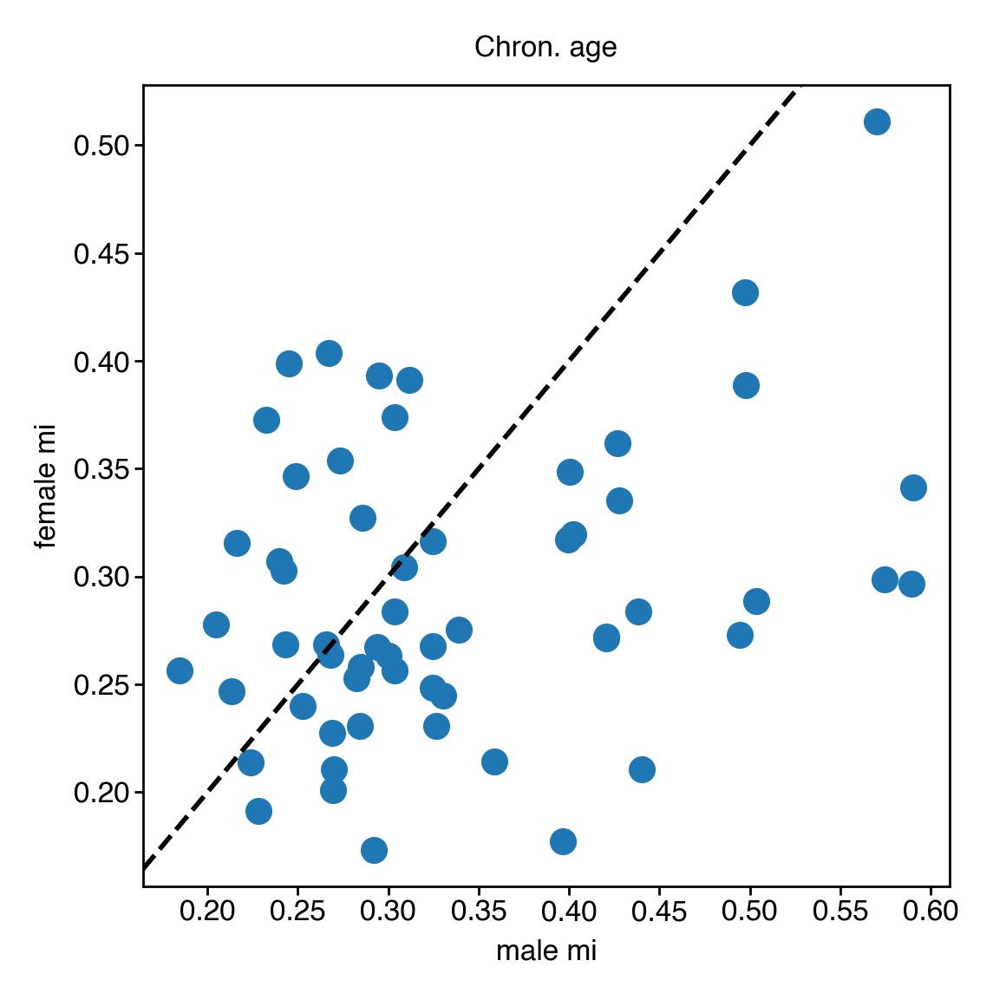

In [231]:
plt.scatter(male_age_mi, female_age_mi)
plt.title("Chron. age")
plt.xlabel("male mi")
plt.ylabel("female mi")
add_identity(plt.gca(), c='k', ls='--')

In [236]:
male_bio_age_mi = mutual_info_regression(syllable_counts_jax[:333], mdl['bio_ages'][:333])
female_bio_age_mi = mutual_info_regression(syllable_counts_jax[333:], mdl['bio_ages'][333:])

<Axes: title={'center': 'Beh. age'}, xlabel='male mi', ylabel='female mi'>

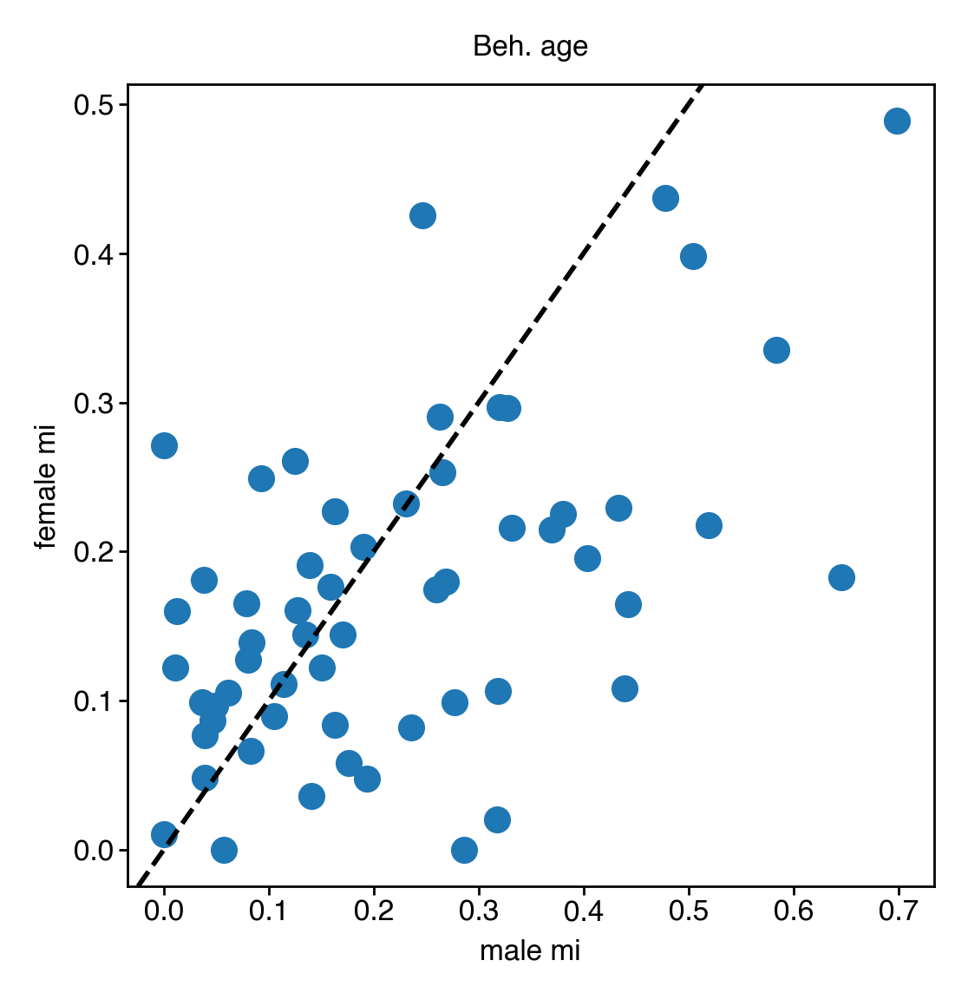

In [233]:
plt.scatter(male_bio_age_mi, female_bio_age_mi)
plt.title("Beh. age")
plt.xlabel("male mi")
plt.ylabel("female mi")
add_identity(plt.gca(), c='k', ls='--')

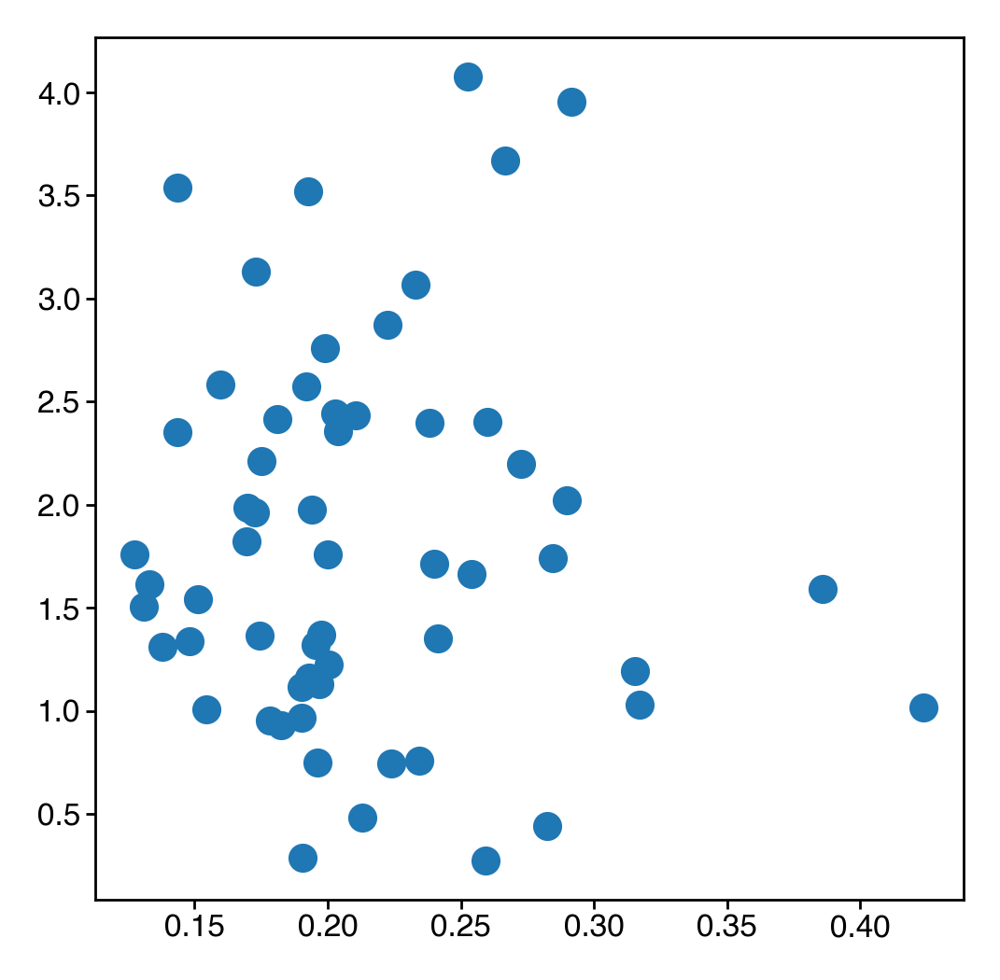

In [274]:
plt.scatter(age_mi, syll_effect_mag)

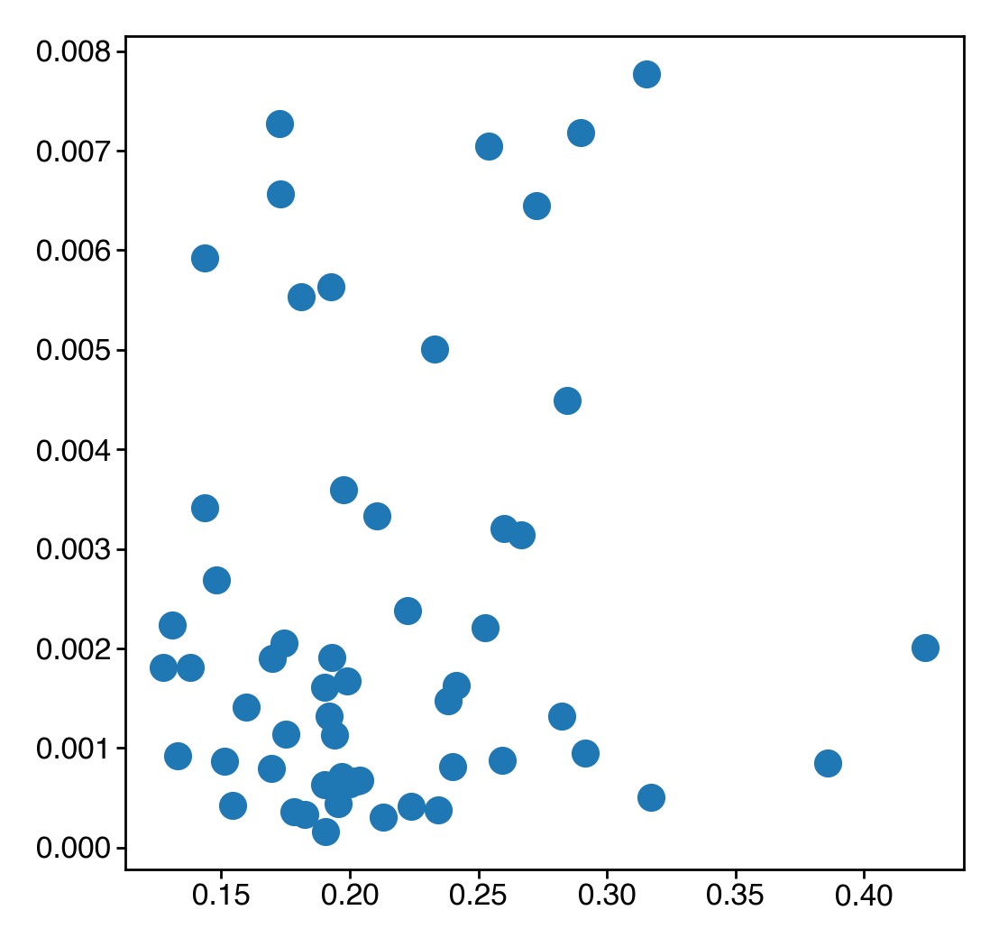

In [279]:
plt.scatter(age_mi, exp_syll_effect_mag)

### Make plots showing high-influence syllables are better predicting than low-influence syllables

In [90]:
from sklearn.svm import SVC, SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.metrics import accuracy_score, r2_score

In [48]:
top_n = 5

In [196]:
syll_groups = {'sex': sex_ranking[:top_n], 'size': size_ranking[:top_n], 'age': age_ranking[:top_n]}
# syll_groups = {'sex': sex_ranking[:top_n], 'size': size_ranking[:top_n], 'age': age_ranking}

In [50]:
clf_data = df.reset_index()

In [174]:
pipe = make_pipeline(
    StandardScaler(),
    LinearRegression(),
    # SVR()
)

In [173]:
male_data = clf_data.query('sex == 0')

In [197]:
n_repeats = 10
x = []

for _type, sylls in syll_groups.items():
    # age regression
    for syll_idx in sylls:
        r2s = []
        for i in range(n_repeats):
            preds = cross_val_predict(
                pipe,
                # np.array(syllable_counts_jax[:, [syll_idx]]),
                np.array(male_data[[keep_syllables[syll_idx]]]),
                male_data["age"],
                cv=KFold(n_splits=10, shuffle=True, random_state=i),
                n_jobs=-1,
            )
            r2s.append(r2_score(male_data["age"], preds))
        x.append({"r2": np.mean(r2s), "type": _type, "syllable": syll_idx})

x = pd.DataFrame(x)

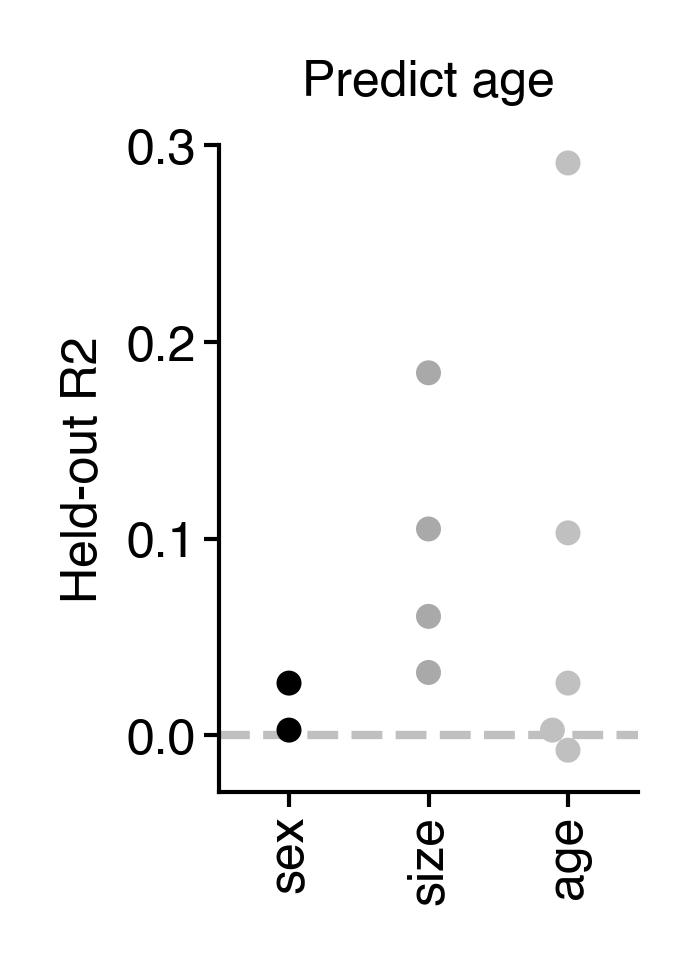

In [198]:
fig = figure(0.9, 1.4)
ax = sns.swarmplot(data=x, x='type', y='r2', hue='type', palette=['k', 'darkgray', 'silver'], size=3)
plt.xticks(rotation=90)
ax.set(ylabel="Held-out R2", xlabel="", title="Predict age", ylim=(None, 0.3))
ax.axhline(0, color='silver', ls='--', lw=1, zorder=-1)
sns.despine()
# saver(fig, "predict-age-from-syllables", tight_layout=True);

In [51]:
pipe = make_pipeline(
    StandardScaler(),
    LinearRegression(),
)

In [55]:
n_repeats = 10
x = []

for _type, sylls in syll_groups.items():
    # age regression
    for syll_idx in sylls:
        r2s = []
        for i in range(n_repeats):
            preds = cross_val_predict(
                pipe,
                np.array(syllable_counts_jax[:, [syll_idx]]),
                np.array(features['sizes']),
                cv=KFold(n_splits=10, shuffle=True, random_state=i),
                n_jobs=-1,
            )
            r2s.append(r2_score(np.array(features['sizes']), preds))
        x.append({"r2": np.mean(r2s), "type": _type})

x = pd.DataFrame(x)

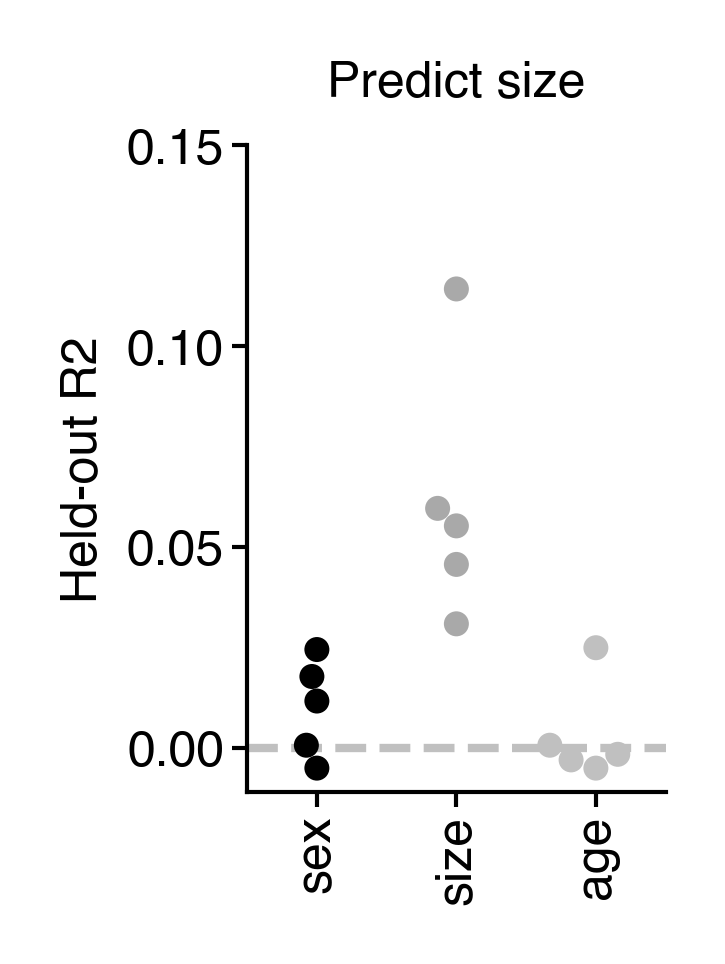

In [57]:
fig = figure(0.9, 1.4)
ax = sns.swarmplot(data=x, x='type', y='r2', hue='type', palette=['k', 'darkgray', 'silver'], size=3)
plt.xticks(rotation=90)
ax.set(ylabel="Held-out R2", xlabel="", title="Predict size", ylim=(None, 0.15))
ax.axhline(0, color='silver', ls='--', lw=1, zorder=-1)
sns.despine()
# saver(fig, "predict-size-from-syllables", tight_layout=True);

In [60]:
clf_pipe = make_pipeline(
    StandardScaler(),
    SVC(kernel='linear'),
)

In [64]:
n_repeats = 10
x = []

for _type, sylls in syll_groups.items():
    # age regression
    for syll_idx in sylls:
        r2s = []
        for i in range(n_repeats):
            preds = cross_val_predict(
                clf_pipe,
                np.array(syllable_counts_jax[:, [syll_idx]]),
                np.argmax(features['mice'], axis=0),
                cv=KFold(n_splits=10, shuffle=True, random_state=i),
                n_jobs=-1,
            )
            r2s.append(accuracy_score(np.argmax(features['mice'], axis=0), preds))
        x.append({"acc": np.mean(r2s), "type": _type})

x = pd.DataFrame(x)

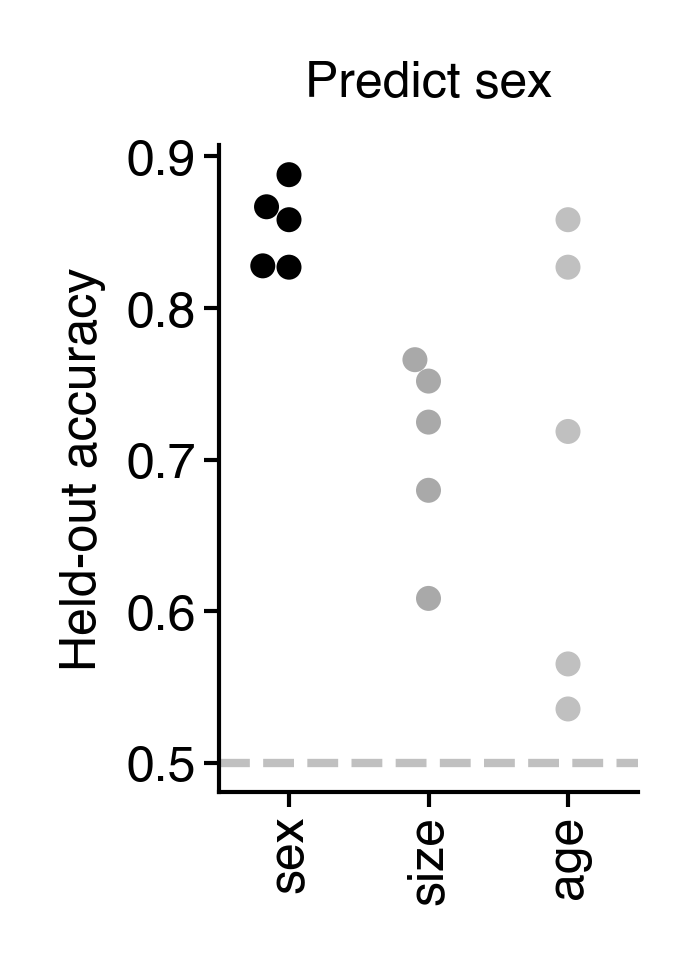

In [66]:
fig = figure(0.9, 1.4)
ax = sns.swarmplot(data=x, x='type', y='acc', hue='type', palette=['k', 'darkgray', 'silver'], size=3)
plt.xticks(rotation=90)
ax.set(ylabel="Held-out accuracy", xlabel="", title="Predict sex")
ax.axhline(0.5, color='silver', ls='--', lw=1, zorder=-1)
sns.despine()
# saver(fig, "predict-sex-from-syllables", tight_layout=True);

## Observe concentration magnitudes per-syllable

In [138]:
splines.shape

(58, 1000)

In [139]:
size_effect

array([0.07548983, 0.04484264, 0.17614903, 0.02732871, 0.04422758,
       0.05642242, 0.00797247, 0.05467491, 0.11468881, 0.07673927,
       0.09796211, 0.00710456, 0.0323276 , 0.05365435, 0.17846438,
       0.07777246, 0.1165024 , 0.18529339, 0.11157861, 0.07360332,
       0.05518848, 0.06844888, 0.04635166, 0.02821663, 0.0459363 ,
       0.1614368 , 0.17849332, 0.04508283, 0.21834727, 0.01616699,
       0.20060329, 0.0496086 , 0.09289057, 0.07405291, 0.00279158,
       0.03519278, 0.17952009, 0.04118092, 0.06675696, 0.07634827,
       0.06993669, 0.05448895, 0.16499037, 0.05636408, 0.00263114,
       0.14218709, 0.04516302, 0.09550066, 0.09188114, 0.14306793,
       0.08171307, 0.04529099, 0.03561221, 0.06555926, 0.02075646,
       0.02175195, 0.0653903 , 0.04097191], dtype=float32)

In [141]:
bio_concentrations = mdl_params['bio_basis_weights'] @ mdl_components.bases['bio']
size_concentrations = (
    mdl_params["size_slope"] @ mdl_components.bases["size"]
)
bias_scale = np.exp(mdl_params["development_weights"] @ mdl_components.bases["development"])

individual_biases = np.array(
    raise_dim(mdl_params["individual_biases"], axis=1) @ mdl_components.bases["individual"]
)

bio_concentrations = bio_concentrations.T[None]
size_concentrations = size_concentrations.T[:, None, :]
individual_biases = individual_biases.T[:, None, :]

concentrations = bio_concentrations + size_concentrations + (individual_biases * bias_scale[..., None])

In [147]:
size_concentrations.shape

(680, 1, 58)

In [142]:
concentrations.shape

(680, 1000, 58)

In [249]:
def make_plots(syllable, conc_only=False):
    figure(2, 2)
    plt.plot(concentrations[..., syllable].T)
    plt.title(syllable)
    if conc_only:
        return
        
    figure(2, 2)
    sns.histplot(individual_biases[:, 0, syllable])
    plt.title(syllable)
    figure(2, 2)
    sns.histplot(size_concentrations[:, 0, syllable])
    plt.title(syllable)

In [ ]:
make_plots(9)

In [ ]:
make_plots(13)

In [ ]:
make_plots(25)

In [237]:
age_mi_sort = np.argsort(age_mi)[::-1]
male_age_mi_sort = np.argsort(male_age_mi)[::-1]

#### Age mi sorted output

In [ ]:
for i in range(5):
    make_plots(age_mi_sort[i], conc_only=True)

In [ ]:
for i in range(5):
    make_plots(age_mi_sort[-(i + 1)], conc_only=True)

#### Male age mi sorted output

In [ ]:
for i in range(5):
    make_plots(male_age_mi_sort[i], conc_only=True)

In [ ]:
for i in range(5):
    make_plots(male_age_mi_sort[-(i + 1)], conc_only=True)